# 数据结构

# 画图

In [1]:
%matplotlib notebook
from qulab.storage.schema import Record, base
from qulab.storage.utils import save
import time
from scipy import constants as const
from sympy import diff, symbols
import sympy as sy
from scipy.optimize import least_squares as ls
from scipy.fftpack import fft,ifft,hilbert
from qulab.storage import connect
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import imp, qulab.optimize
op = imp.reload(qulab.optimize)
connect.connect()

In [2]:
def _read(title=None,which=0):
    
    x = Record.objects.order_by('-finished_time').first()
    tags, comment, name = x['tags'], x['comment'], x['title']
    if title is not None:
        name = title
    
    def getDBdata(title):
        r = Record.objects(title=title).order_by('-finished_time')[which]
        return base.from_pickle(r.datafield), r.id

    def getIDdata(ID):
        r = Record.objects(id__in=[ID])[0]
        return base.from_pickle(r.datafield)
    
    data, ID = getDBdata(name)
    return data, ID, comment, tags, name


def read(title=None,which=0):
    
    if title is None:
        x = Record.objects.order_by('-finished_time')[which]
    else:
        x = Record.objects(title=title).order_by('-finished_time')[which]
    tags, comment, name = x['tags'], x['comment'], x['title']
    data, ID = base.from_pickle(x.datafield), x.id
    return data, ID, comment, tags, name

In [4]:
def write(phase=None,addr='mongodb',height=2,title=None,which=0):
    if addr == 'mongodb':
        data, ID, comment, tags, name = read(title=title,which=which)
    else:
        d = np.load(addr)
        data, tags = (d['row'],d['col'],d['s']), d['tags']

    if len(data) == 2:
        num = len(data[0].T)
        if phase == 'phase': 
            fig, axes = plt.subplots(ncols=2,nrows=num,figsize=(9,height*num))
            fig.subplots_adjust(top=0.98,bottom=0.02,hspace=0.2)
            v = []
            for i in range(num): 
                f, s = data[0][:,i],data[1][:,i]
                v.append((f,s))
                if num != 1:
                    
                    axes[i][0].plot(f,abs(s))
                    axes[i][1].plot(f,np.angle(s))
                else:
                    axes[0].plot(f,abs(s))
                    axes[1].plot(f,np.angle(s))
        else:
            n = num // 2 + num % 2
            fig, axes = plt.subplots(ncols=2,nrows=n,figsize=(9,height*n))
            fig.subplots_adjust(top=0.9,bottom=0.1,hspace=0.5)
            v = []
            for i in range(num): 
                f, s = data[0][:,i]/1e9,data[1][:,i]
                v.append((f,s))
                if n != 1:
                    axes[i//2][i%2].plot(f,abs(s))
                    #axes[i//2][i%2].set_title(name)
                else:
                    axes[i].plot(f,abs(s))
                    if addr == 'mongodb':
                        axes[i].set_title(name)
        return v,num,tags
    if len(data) == 3 :
        
        num = len(data[0].T)
        if phase == 'phase': 
            n = num // 2 + num % 2
            fig, axes = plt.subplots(ncols=2,nrows=num,figsize=(9,height*num))
            fig.subplots_adjust(top=0.9,bottom=0.1,hspace=0.5)
            v = []
            for i in range(num): 
                cols, rows, s= data[0][:,i], data[1][0,:], data[2][:,:,i]
                v.append((cols,rows,s))
                extent = [min(rows)/1e9,max(rows)/1e9,min(cols),max(cols)]
                if n != 1:
                    axes[i//2][i%2].imshow(abs(s),extent=extent,aspect='auto',origin='lower',interpolation='nearest')
                    #axes[i][1].imshow(np.angle(s),extent=extent,aspect='auto',origin='lower',interpolation='nearest')
                else:
                    #axes[0].imshow(abs(s),extent=extent,aspect='auto',origin='lower',interpolation='nearest')
                    axes[i].imshow(np.angle(s),extent=extent,aspect='auto',origin='lower',interpolation='nearest')
        else:
            n = num // 2 + num % 2
            fig, axes = plt.subplots(ncols=2,nrows=n,figsize=(9,height*n))
            fig.subplots_adjust(top=0.9,bottom=0.1,hspace=0.5)
            v = []
            for i in range(num): 
                cols, rows, s= data[0][:,i], data[1][0][:,0], data[2][:,:,i]
                v.append((cols,rows,s))
                extent = [min(rows)/1e9,max(rows)/1e9,min(cols),max(cols)]
                if n != 1:
                    axes[i//2][i%2].imshow(abs(s),extent=extent,aspect='auto',origin='lower',interpolation='nearest')
                    #axes[i//2][i%2].set_title(name)
                else:
                    axes[i].imshow(np.abs(s),extent=extent,aspect='auto',origin='lower',interpolation='nearest',animated=True)
                    axes[i].set_title(tags[0])
        return v,num,tags

# 拟合z_crosstalk

<IPython.core.display.Javascript object>


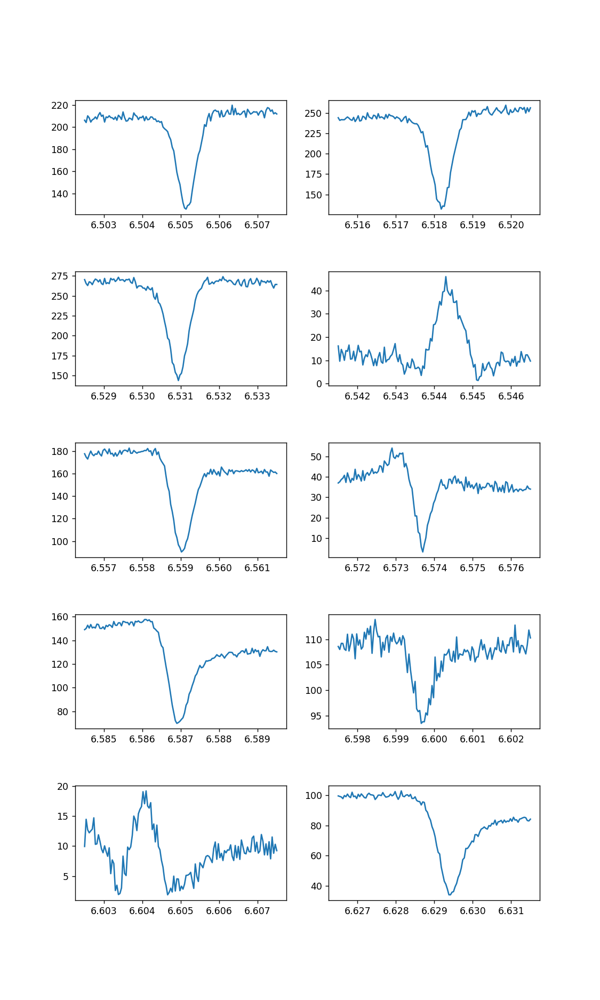

In [14]:
value,num,tags = write(height=3,which=0)

In [9]:
v = np.array([-2,-1.7,-1.5])
f = np.array(f)

In [28]:
a,b,c,d,band,res = op.Lorentz_Fit().fitLorentz(value[0][0],np.abs(value[0][1]))
x = value[0][0]
f.append(b)
z = a/(1.0+c*(x-b)**2)+d
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(x,z)
ax[0].set_title('$%f$'%b)
plt.show()

In [29]:
f

[3.851365142303963, 3.822237574220639, 3.468989248697093]

<IPython.core.display.Javascript object>


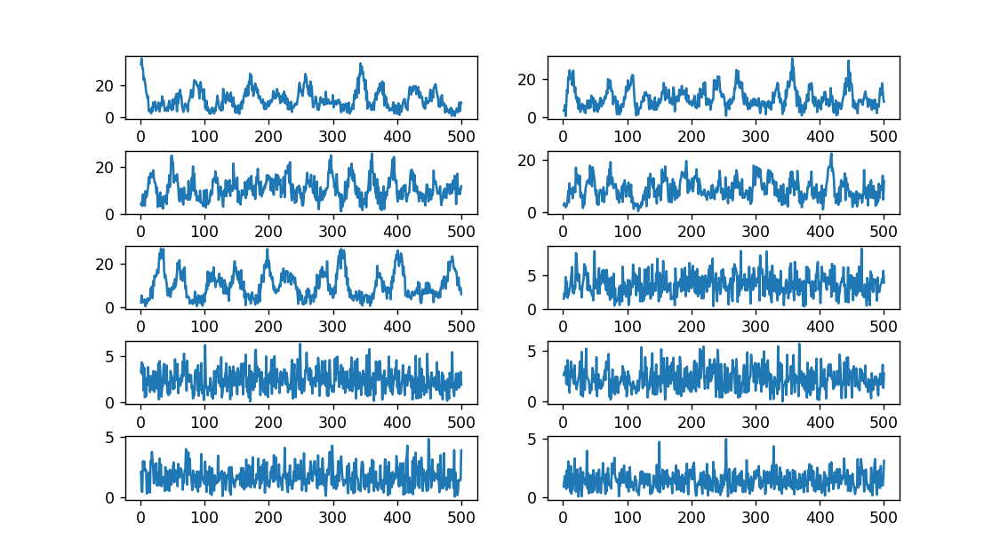

In [500]:
value,num,tags = write(height=1)

<IPython.core.display.Javascript object>


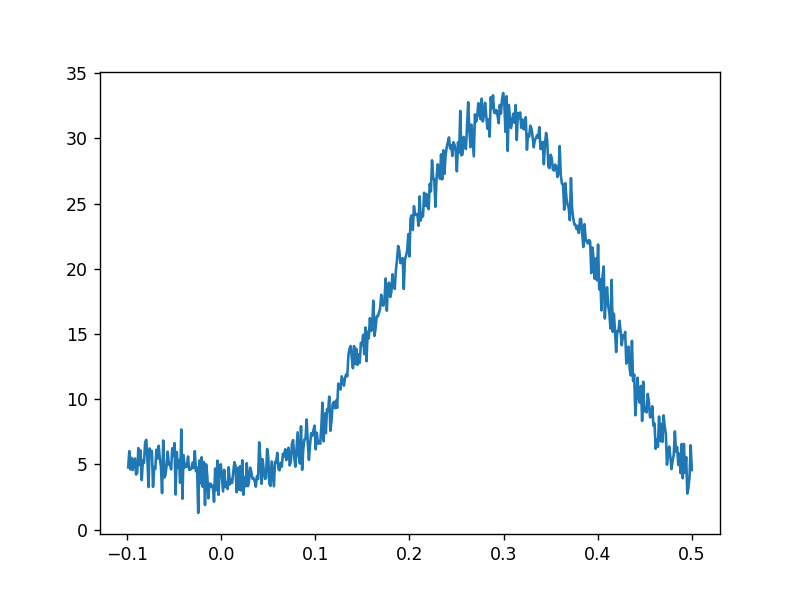

0.2996000000000009

In [447]:
num = 4
volt,s = value[num-1][0],np.abs(value[num-1][1])
# A, C, W, phi = op.Cos_Fit().fit_cos(volt,s)
# z = A*np.cos(2*np.pi*W*volt+phi)+C
plt.figure()
plt.plot(volt,s)
#plt.plot(volt,z)
plt.show()
volt_op = volt[np.argmax(s)]
volt_op

In [512]:
value,num,tags = write(height=1,addr=title='single',which=11)

<IPython.core.display.Javascript object>

IndexError: too many indices for array

<IPython.core.display.Javascript object>


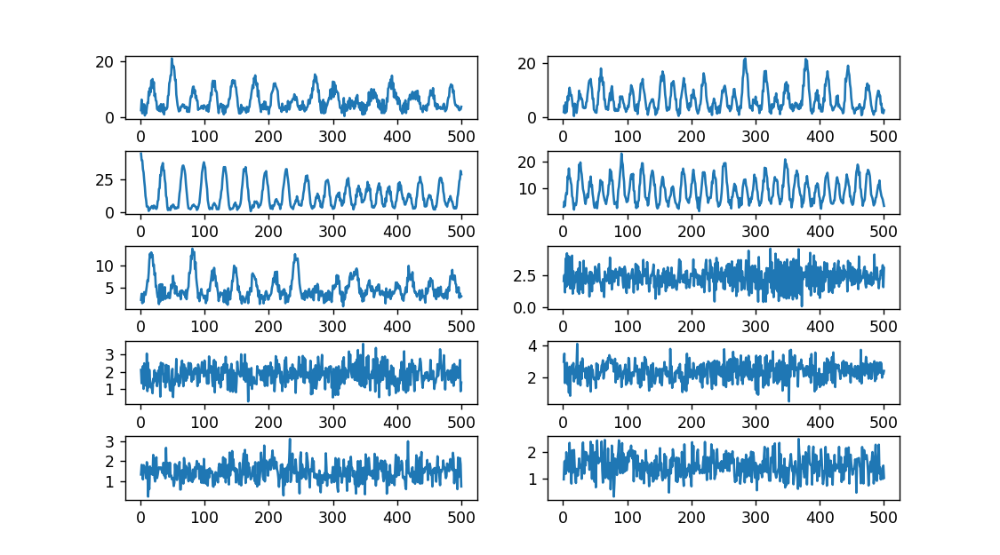

In [631]:
value,num,tags = write(height=1,title='single',which=7)

In [632]:
t = value[0][0]
S = []
j_max = 0
    
for i in range(len(value)):
    if i < 5:
        s_m = np.abs(value[i][1]) - np.min(np.abs(value[i][1]))
        j_max += np.max(np.abs(value[i][1]))
        s = s_m / (np.max(np.abs(value[i][1]))- np.min(np.abs(value[i][1])))
    else:
        s = value[i][1] / (j_max/5)
    S.append(s)

<IPython.core.display.Javascript object>


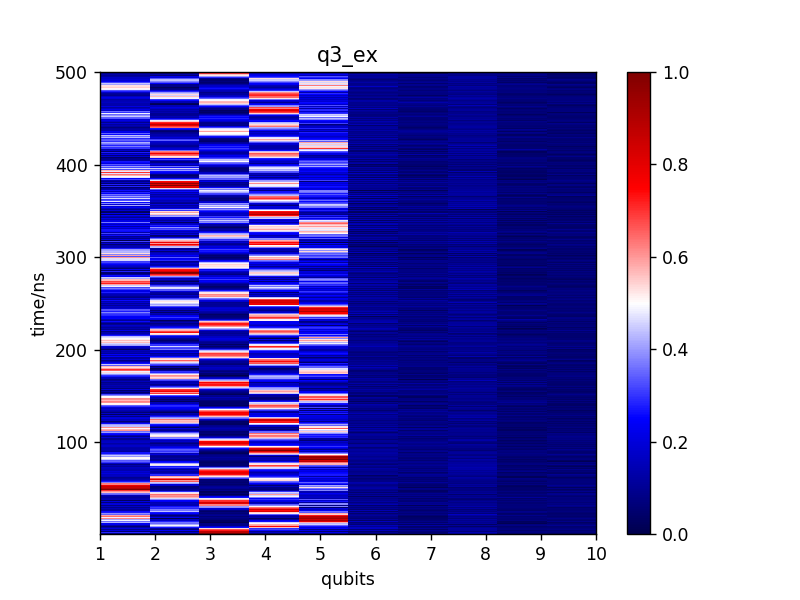

In [634]:
import matplotlib.colors as col
import matplotlib.cm as cm

plt.figure()
import matplotlib as mpl
Colors = ['#FFFFFF',
         '#%02x%02x%02x'%(157,195,224),
         '#%02x%02x%02x'%(72,140,196),
         '#%02x%02x%02x'%(61,89,143),
         '#%02x%02x%02x'%(147,53,72),
         '#FF0000']
cmap = mpl.colors.LinearSegmentedColormap.from_list('test', Colors)
extent = [1,10,min(t),max(t)]
plt.imshow(np.abs(S).T,aspect='auto',origin='lower',extent=extent,cmap='seismic')
plt.title('q3_ex')
plt.xlabel('qubits')
plt.ylabel('time/ns')
plt.colorbar()
plt.show()

In [554]:
tag = 'quantum_walk_ex5000_q3'
save('quantum_walk',tag,row=range(1,11),col=t,s=S,tags=tag,comment="2D_%d"%num)

WindowsPath('D:/QuLabData/2020/0112/quantum_walk/quantum_walk_ex5000_q3_20200112193355.npz')

<IPython.core.display.Javascript object>


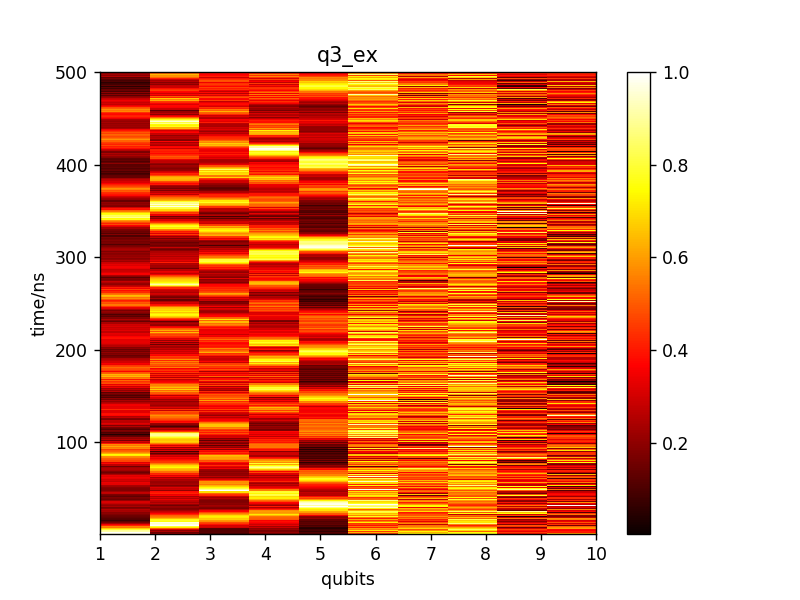

In [518]:
import matplotlib.colors as col
import matplotlib.cm as cm

plt.figure()
# cmap2 = col.LinearSegmentedColormap.from_list('wbr',['#FFFFFF','#00BFFF','#ff0000'],256)
# cm.register_cmap(cmap=cmap2) 
# cmap = cm.get_cmap('wbr')
extent = [1,10,min(t),max(t)]
plt.imshow(np.abs(S).T,aspect='auto',origin='lower',extent=extent,cmap='hot')
plt.title('q3_ex')
plt.xlabel('qubits')
plt.ylabel('time/ns')
plt.colorbar()
plt.show()

In [589]:
data = np.load(r'D:/QuLabData/2020/0111/quantum_walk/quantum_walk_ex5000_q1_20200111125757.npz')
row, col, s = data['row'], data['col'], data['s']


In [590]:
S = []
j_max = 0
for i,j in enumerate(s):

    j = np.array(j)
    if i < 5:
        j_max += np.abs(j).max()
        j /= np.abs(j).max() 
    else:
        j /= (j_max/5)
    S.append(j)

<IPython.core.display.Javascript object>


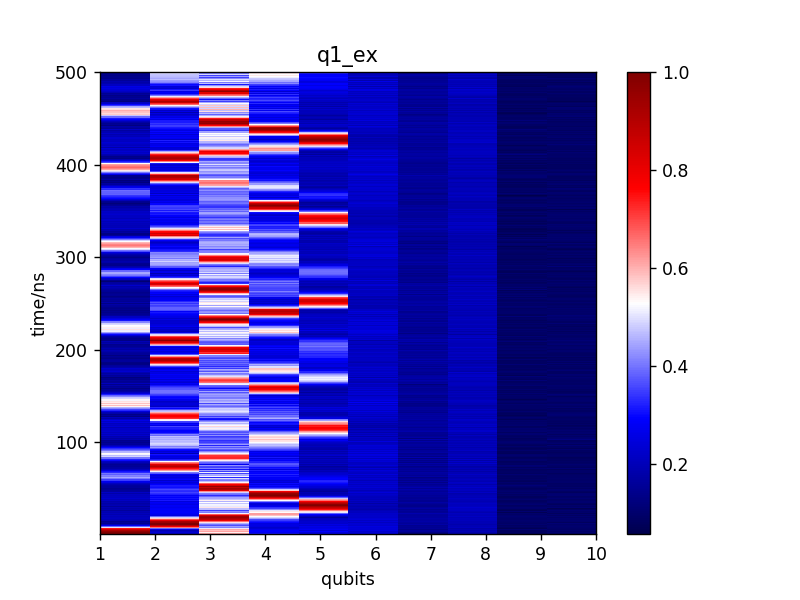

In [591]:
plt.figure()
extent = [1,10,min(t),max(t)]
plt.imshow(np.abs(S).T,aspect='auto',origin='lower',extent=extent,cmap='seismic')
plt.title('q1_ex')
plt.xlabel('qubits')
plt.ylabel('time/ns')
plt.colorbar()
plt.show()

<IPython.core.display.Javascript object>


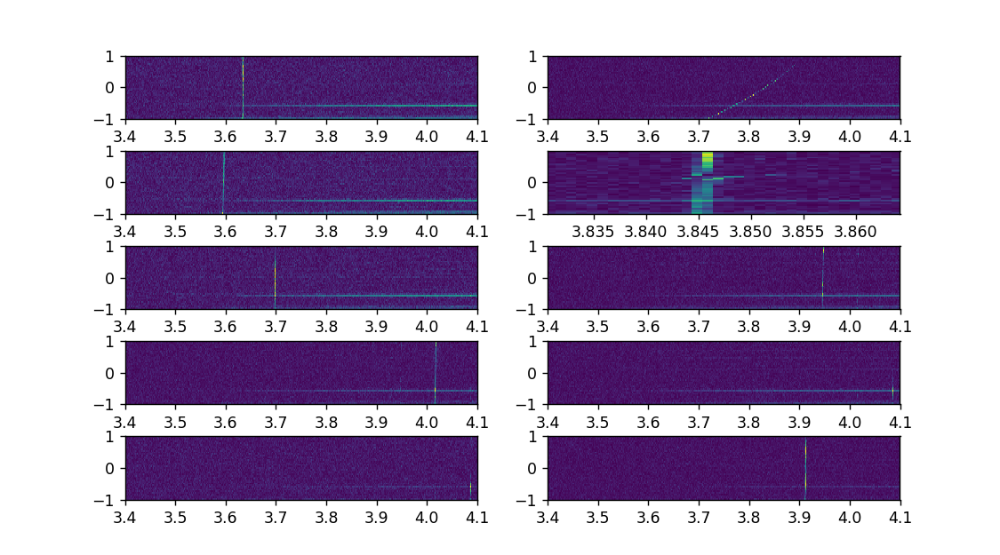

In [645]:
value,num,tags = write(height=1,title='spec2d',which=3)

<IPython.core.display.Javascript object>


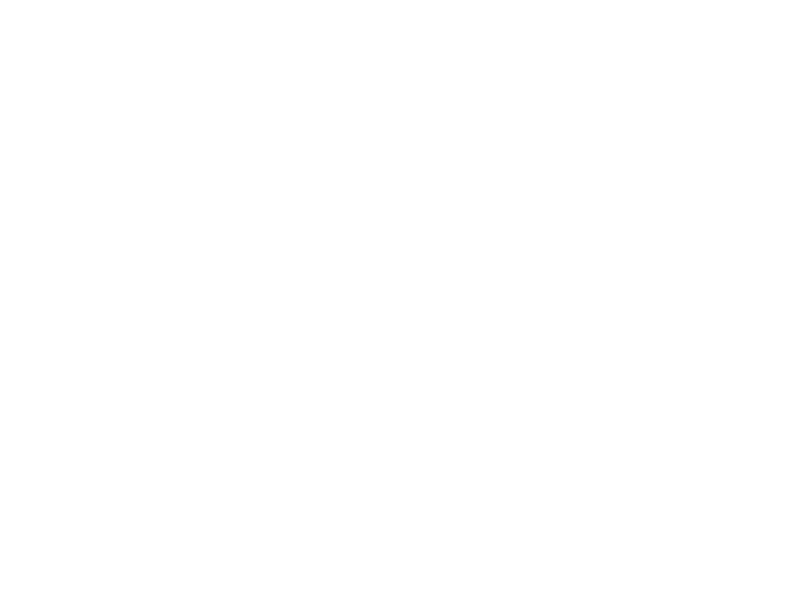

In [57]:
plt.figure()

for i, (f, s) in enumerate(value):
    plt.plot(np.real(f), np.abs(s)+i*15)
plt.show()

<IPython.core.display.Javascript object>


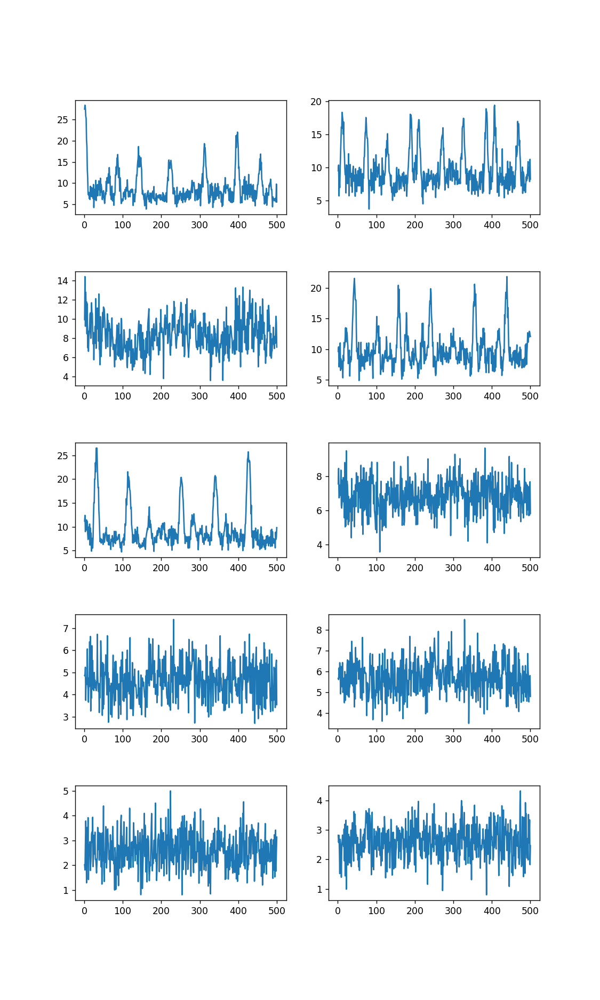

In [303]:
value,num,tags = write(height=3)

<IPython.core.display.Javascript object>


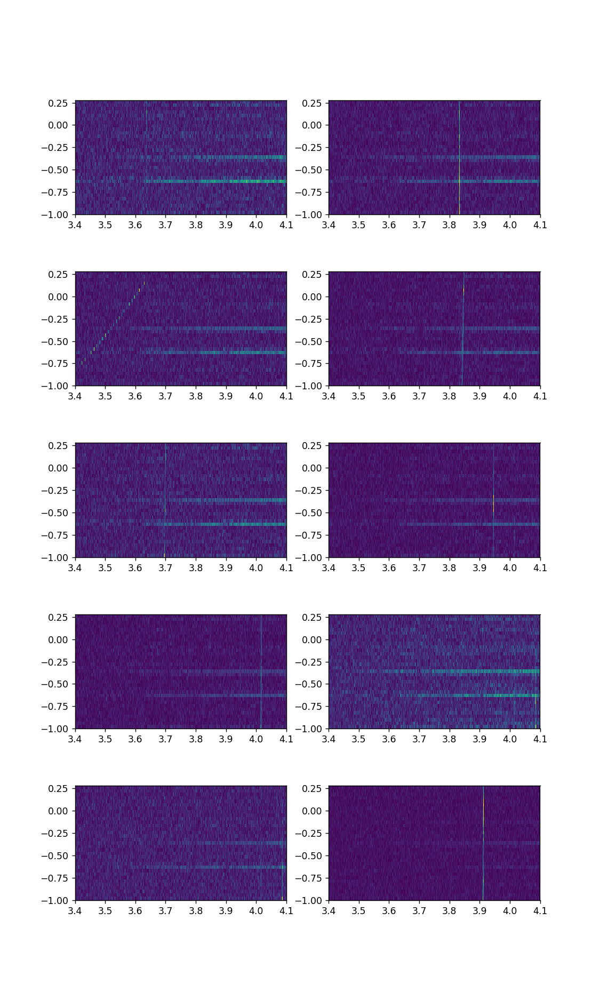

In [653]:
value,num,tags = write(height=3)

<IPython.core.display.Javascript object>


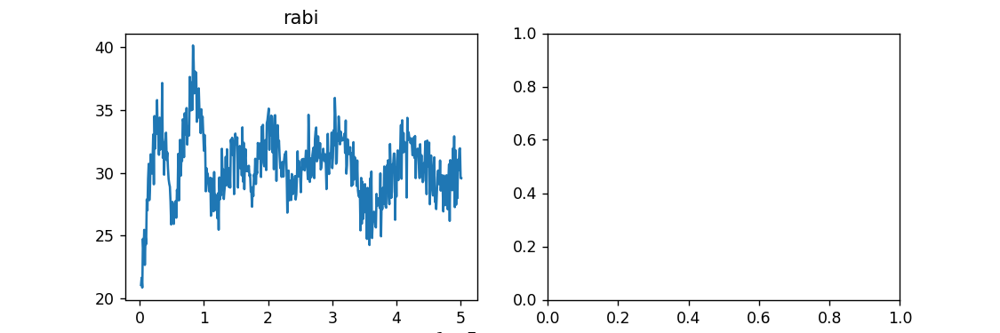

In [10]:
value,num,tags = write(height=3,title='rabi')

<IPython.core.display.Javascript object>


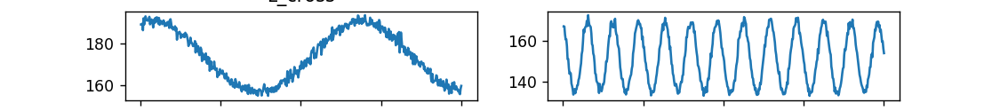

In [606]:
value,num,tags = write(height=1,title='z_cross',which=14)

In [361]:
from scipy.interpolate import CubicSpline

In [362]:
help(CubicSpline)

Help on class CubicSpline in module scipy.interpolate._cubic:

class CubicSpline(CubicHermiteSpline)
 |  CubicSpline(x, y, axis=0, bc_type='not-a-knot', extrapolate=None)
 |  
 |  Cubic spline data interpolator.
 |  
 |  Interpolate data with a piecewise cubic polynomial which is twice
 |  continuously differentiable [1]_. The result is represented as a `PPoly`
 |  instance with breakpoints matching the given data.
 |  
 |  Parameters
 |  ----------
 |  x : array_like, shape (n,)
 |      1-d array containing values of the independent variable.
 |      Values must be real, finite and in strictly increasing order.
 |  y : array_like
 |      Array containing values of the dependent variable. It can have
 |      arbitrary number of dimensions, but the length along ``axis``
 |      (see below) must match the length of ``x``. Values must be finite.
 |  axis : int, optional
 |      Axis along which `y` is assumed to be varying. Meaning that for
 |      ``x[i]`` the corresponding values are ``

<IPython.core.display.Javascript object>


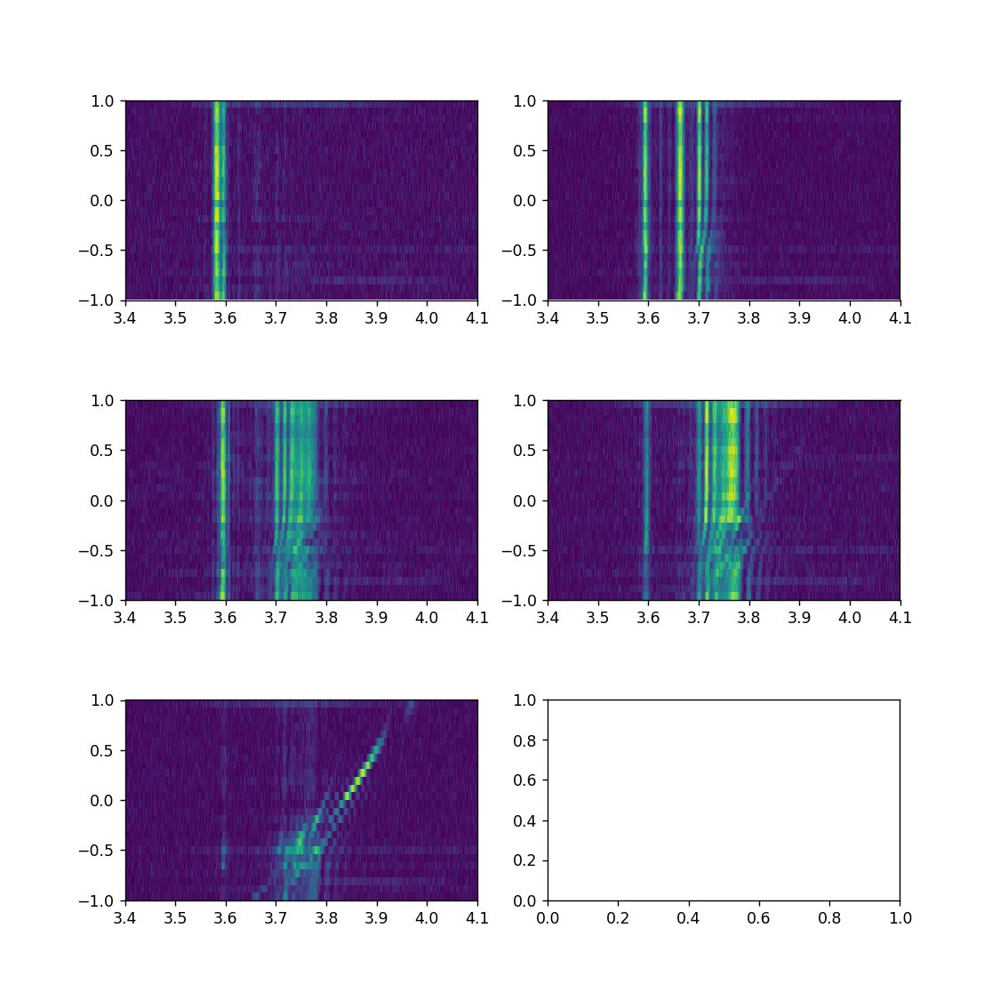

In [179]:
value,num,tags = write(height=3,title='spec2d',which=1)

<IPython.core.display.Javascript object>


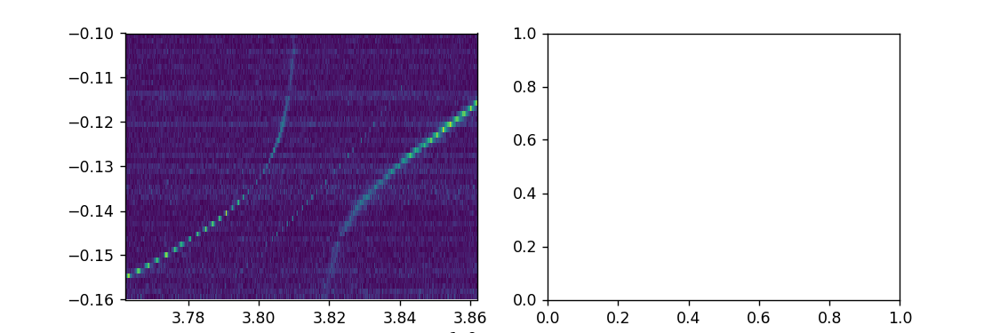

In [27]:
value,num,tags = write(height=3,addr=r'D:\QuLabData\2019\1013\spec2d\xue_crossover_cali_q10_20191013011222.npz')

<IPython.core.display.Javascript object>


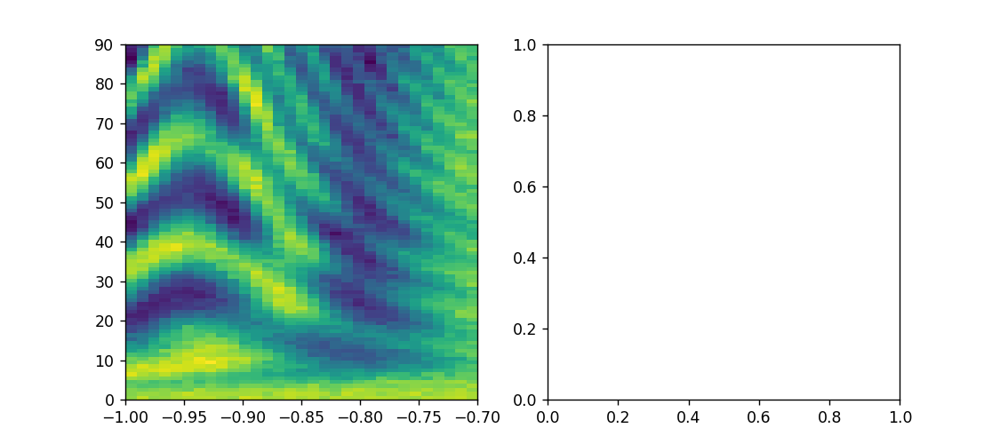

In [30]:
value,num,tags = write(height=4,addr=r'D:\QuLabData\2019\1014\Rabi3\xue_crossover_q8910_20191014175804.npz')

<IPython.core.display.Javascript object>


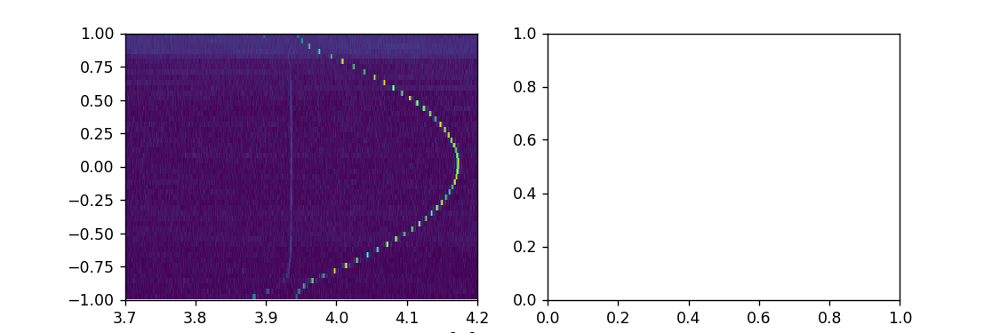

In [37]:
value,num,tags = write(height=3,addr=r'D:\QuLabData\2019\1014\Z_2spec\xue_crossover_q9_20191014112912.npz')

<IPython.core.display.Javascript object>


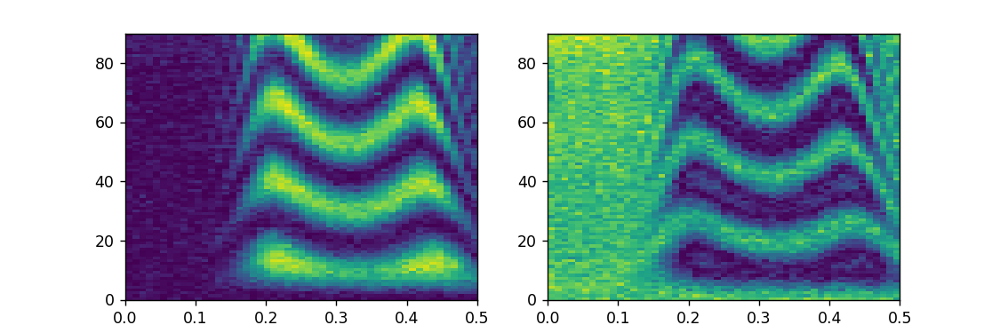

In [28]:
value,num,tags = write(height=3,addr=r'D:\QuLabData\2019\1031\Rabi3\xue_crossover_q6789_20191031015442.npz')

<IPython.core.display.Javascript object>


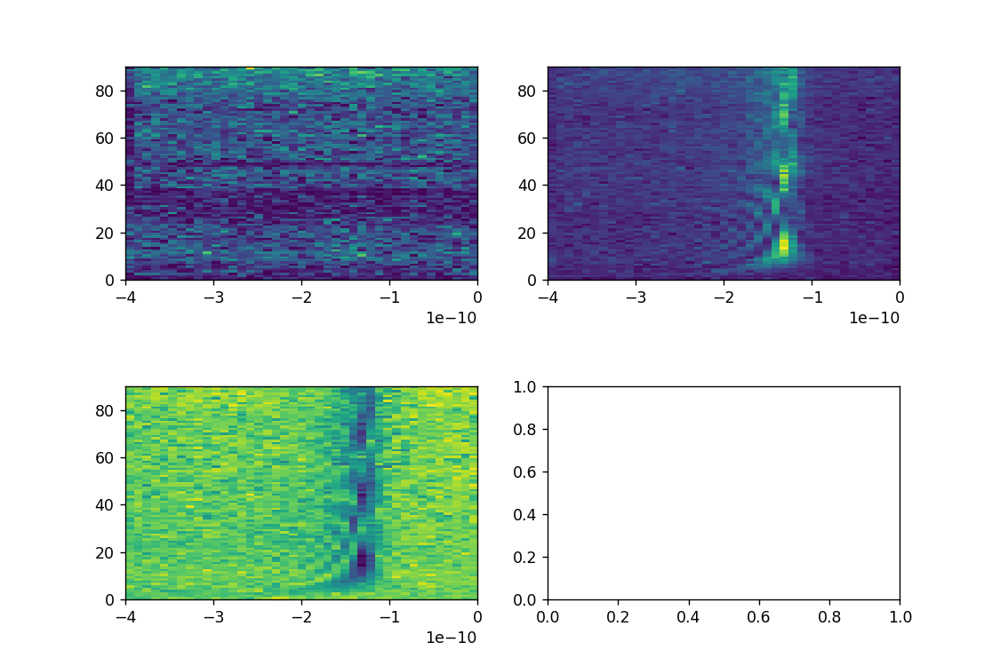

In [337]:
value,num,tags = write(height=3,title='Rabi3',which=10)

<IPython.core.display.Javascript object>


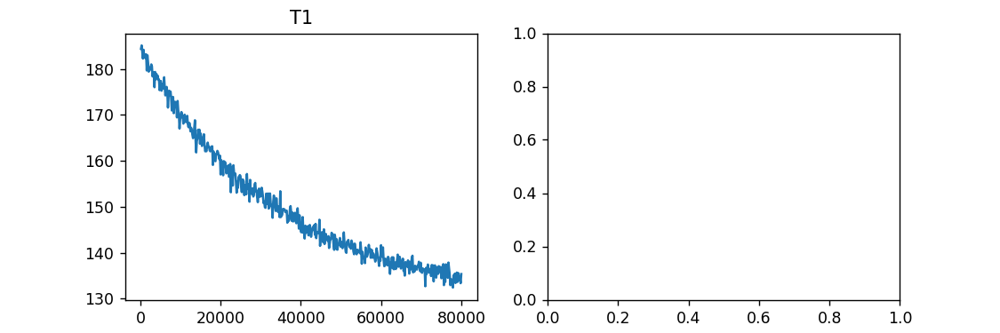

<IPython.core.display.Javascript object>


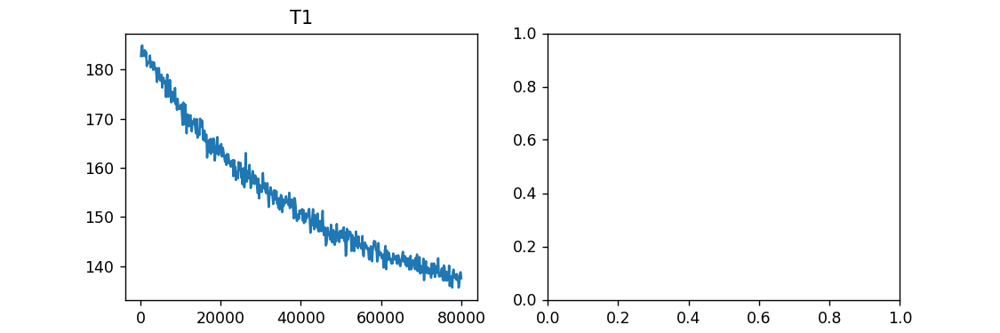

<IPython.core.display.Javascript object>


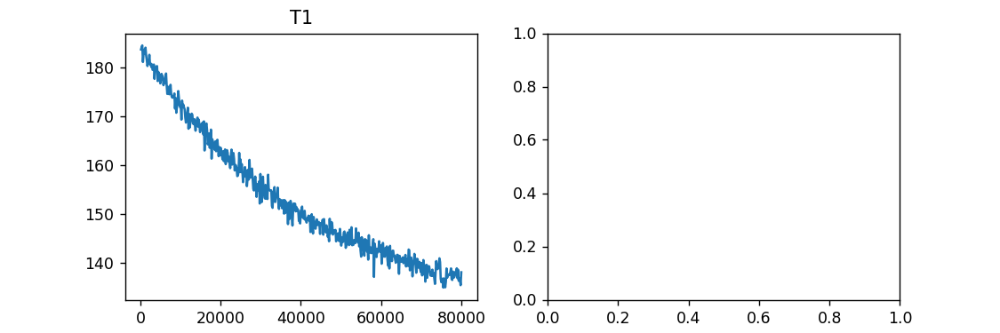

<IPython.core.display.Javascript object>


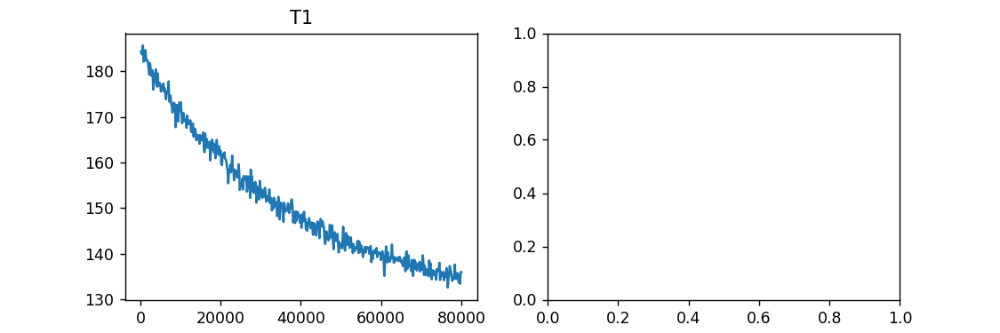

<IPython.core.display.Javascript object>


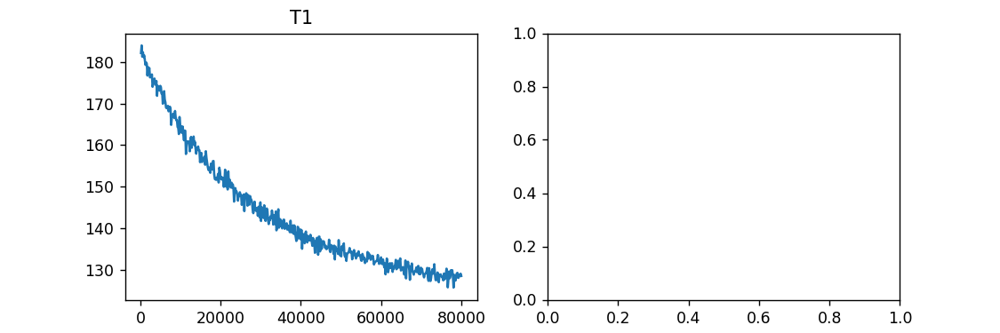

<IPython.core.display.Javascript object>


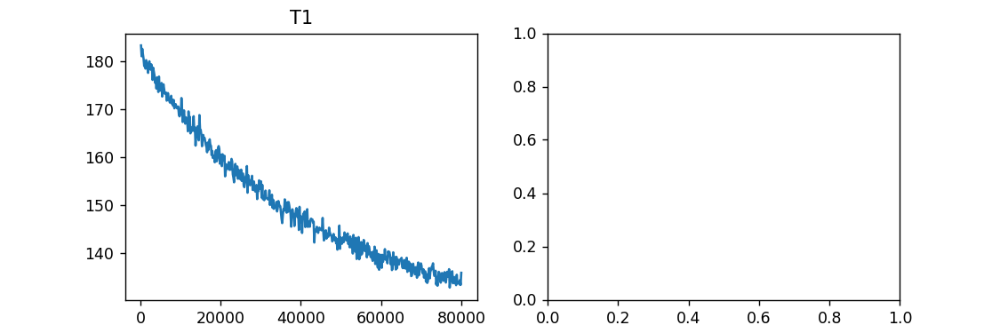

<IPython.core.display.Javascript object>


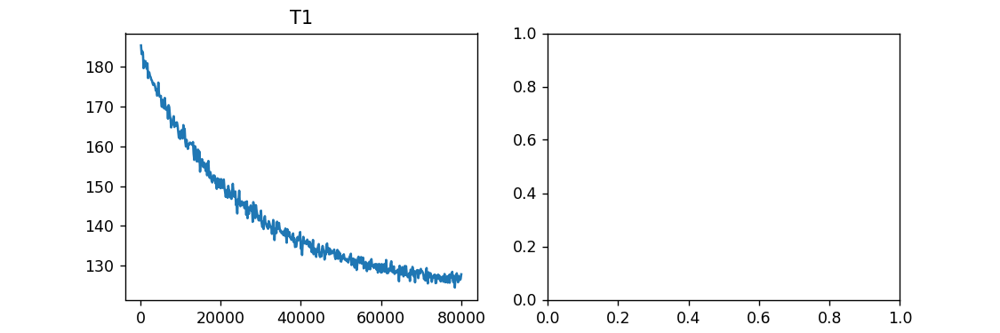

<IPython.core.display.Javascript object>


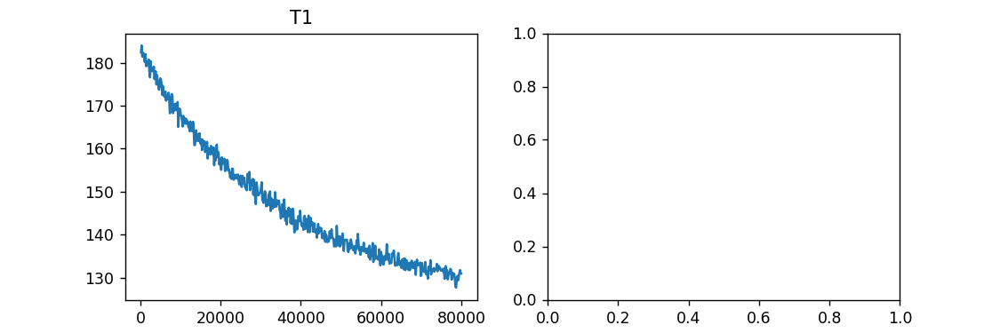

<IPython.core.display.Javascript object>


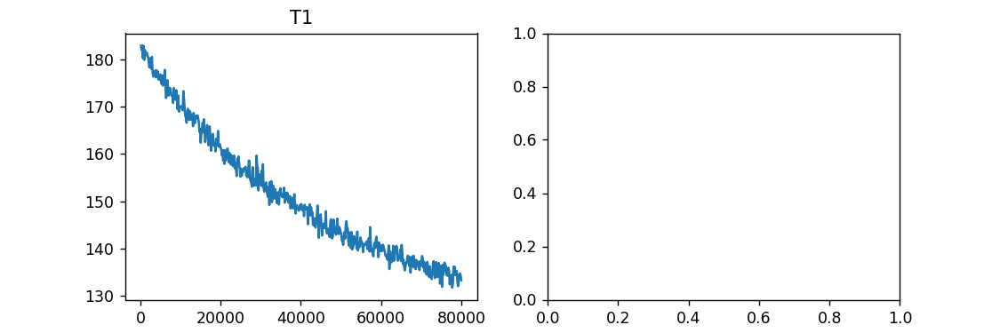

<IPython.core.display.Javascript object>


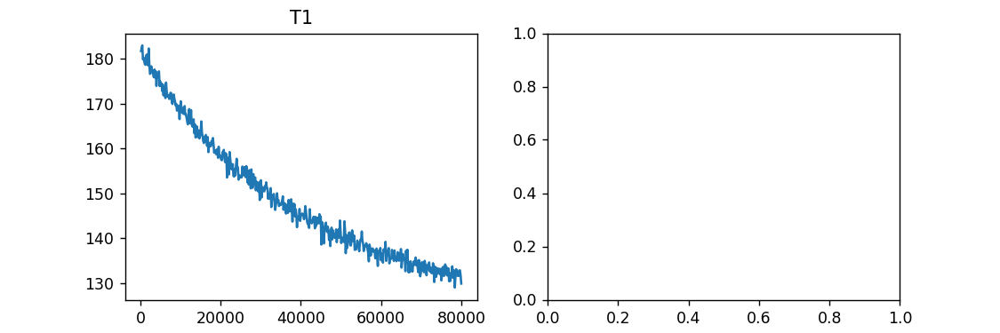

<IPython.core.display.Javascript object>


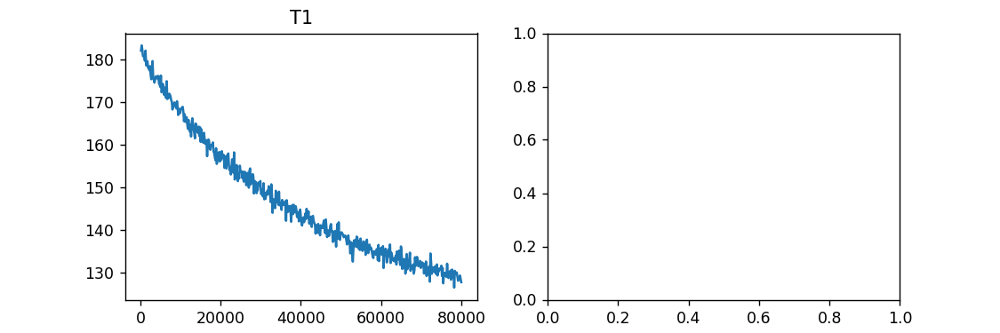

<IPython.core.display.Javascript object>


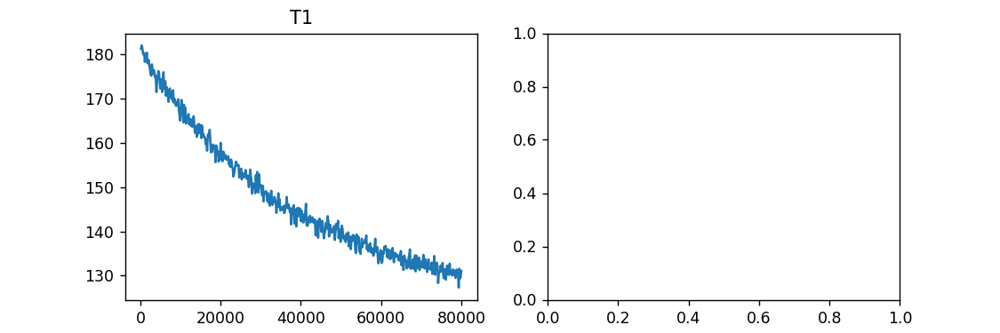

<IPython.core.display.Javascript object>


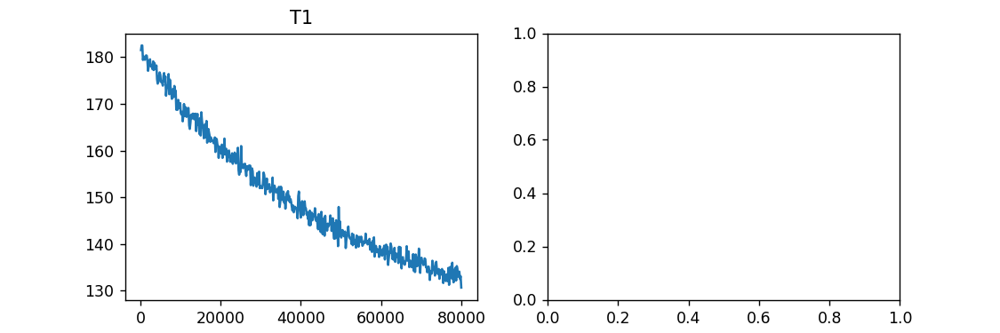

<IPython.core.display.Javascript object>


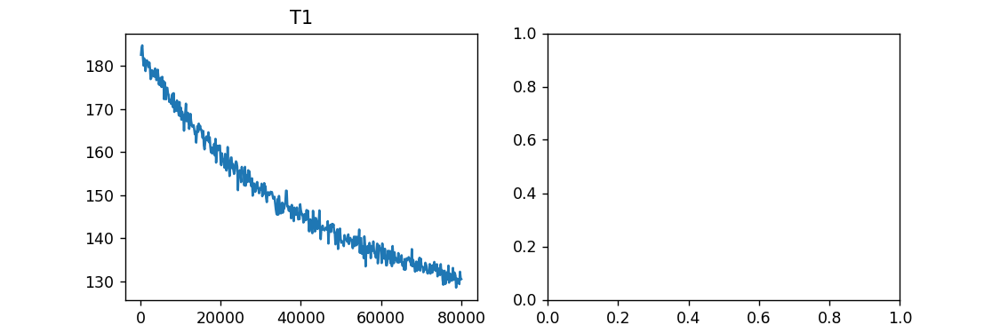

<IPython.core.display.Javascript object>


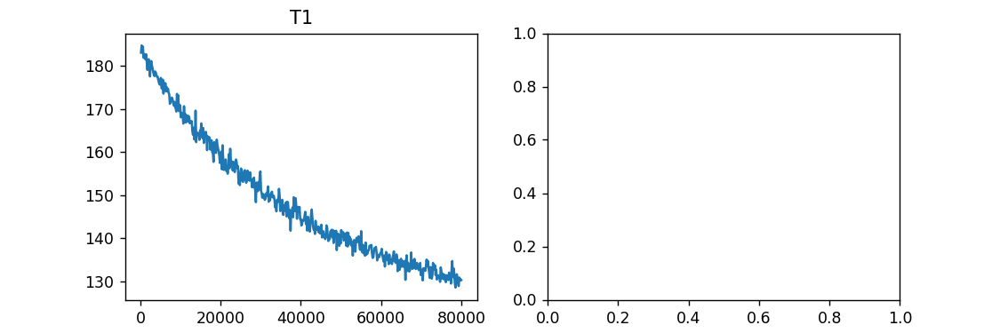

<IPython.core.display.Javascript object>


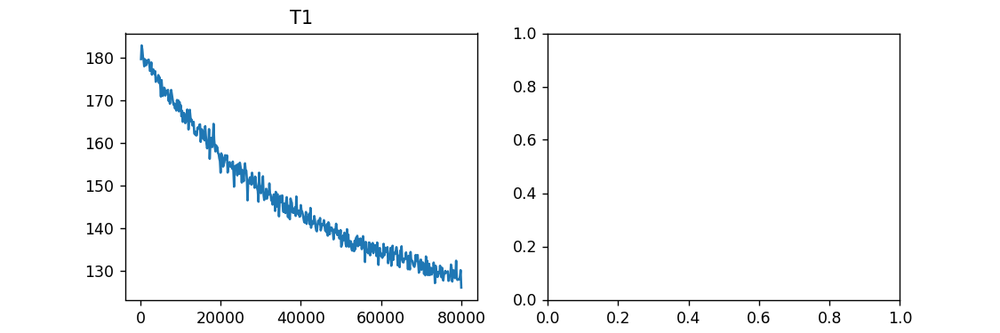

C:\WPy64-3740\python-3.7.4.amd64\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


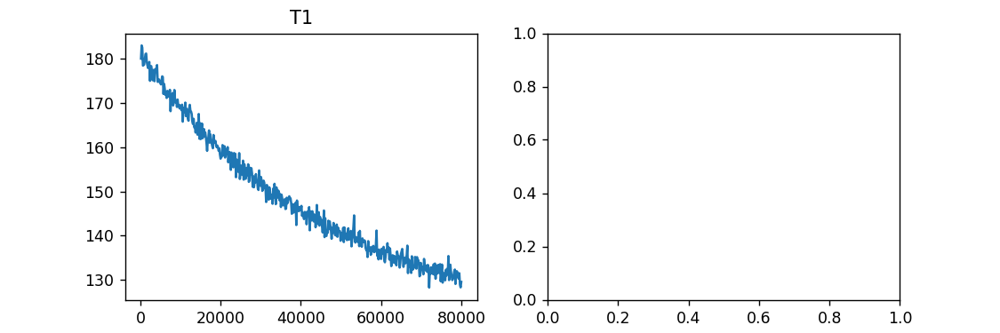

<IPython.core.display.Javascript object>


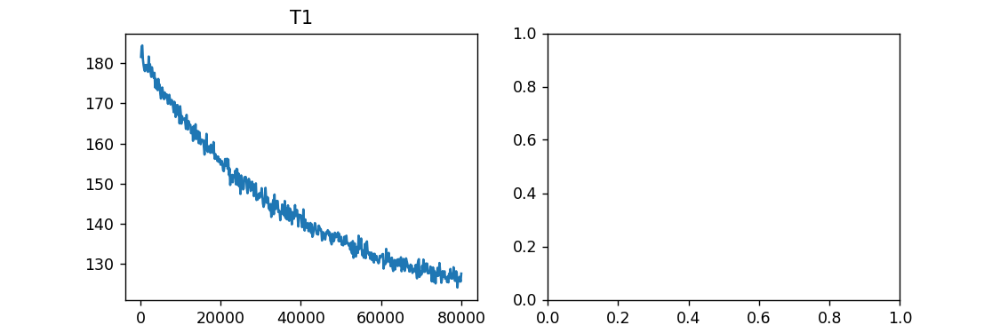

<IPython.core.display.Javascript object>


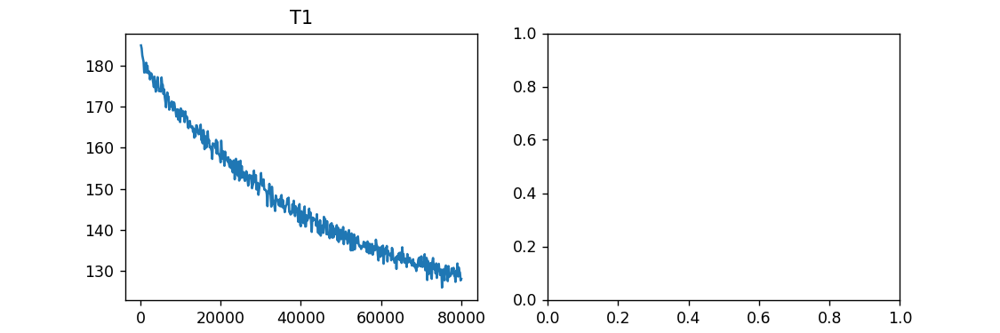

<IPython.core.display.Javascript object>


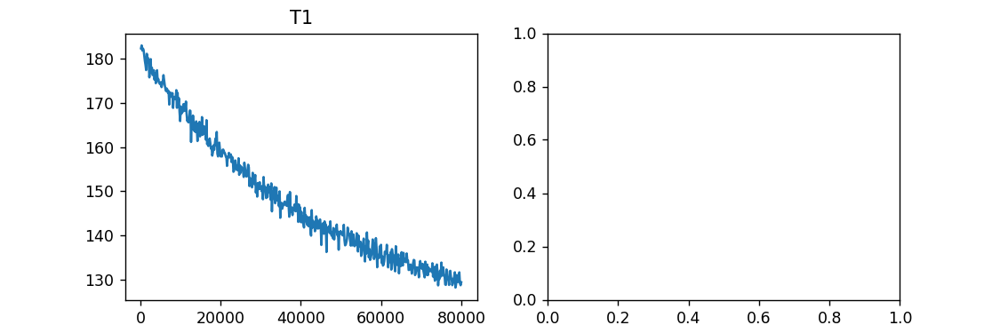

<IPython.core.display.Javascript object>


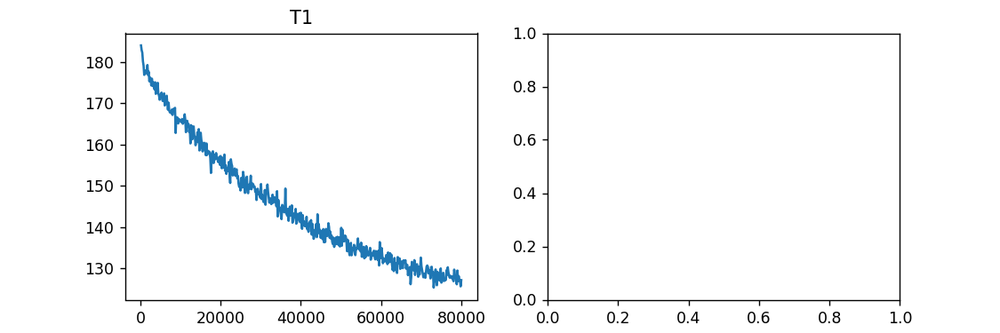

<IPython.core.display.Javascript object>


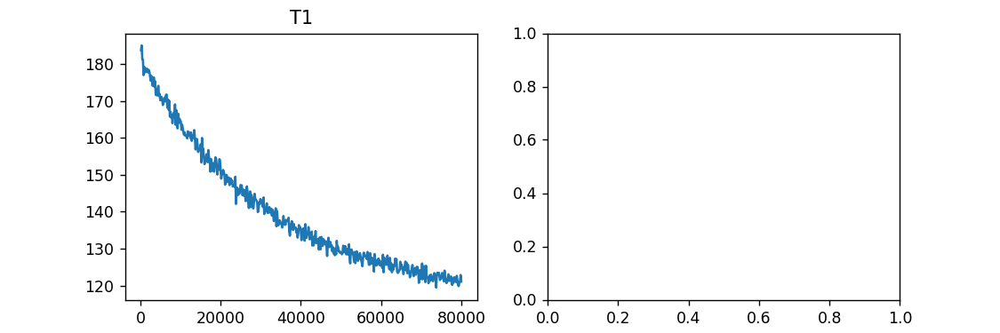

<IPython.core.display.Javascript object>


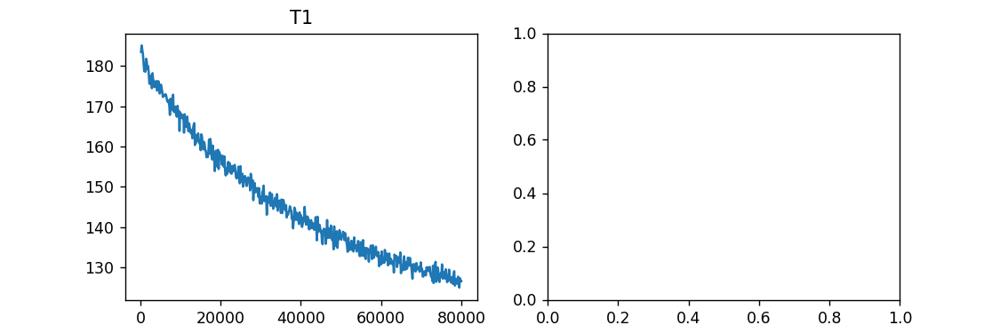

<IPython.core.display.Javascript object>


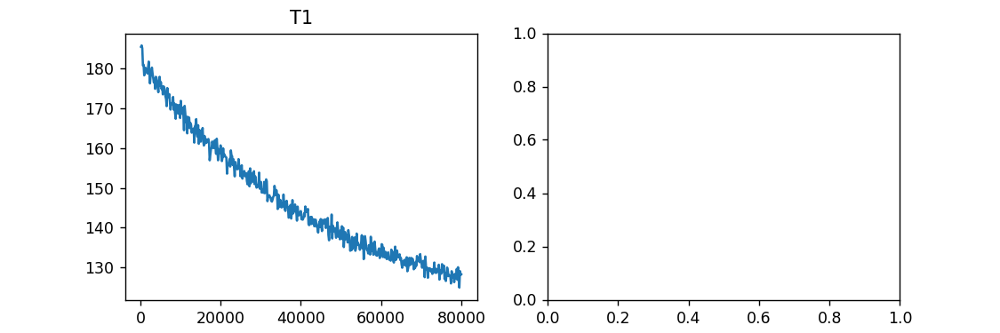

<IPython.core.display.Javascript object>


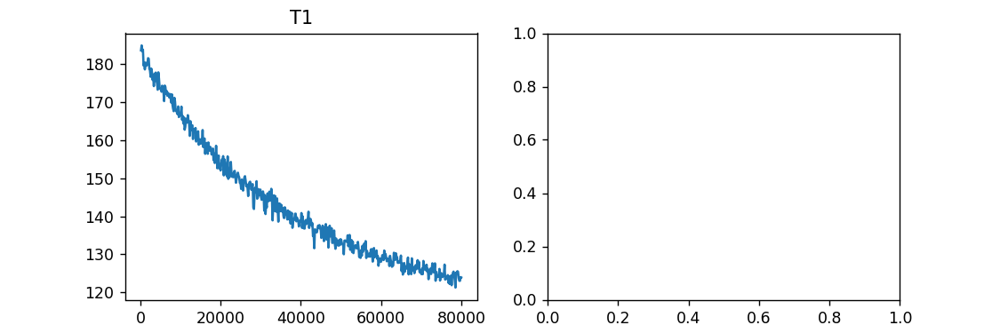

<IPython.core.display.Javascript object>


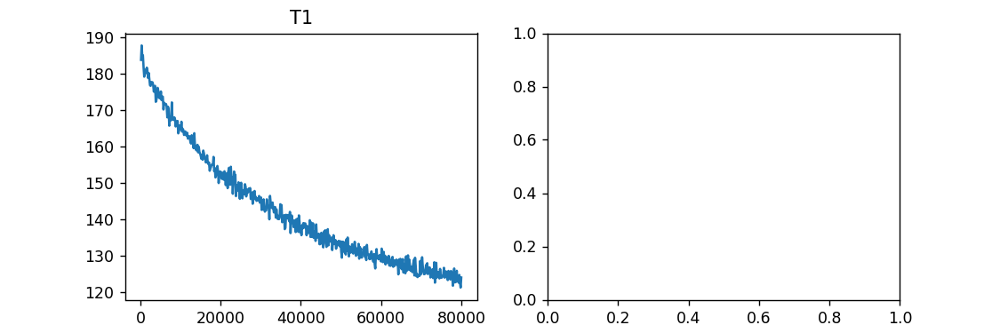

<IPython.core.display.Javascript object>


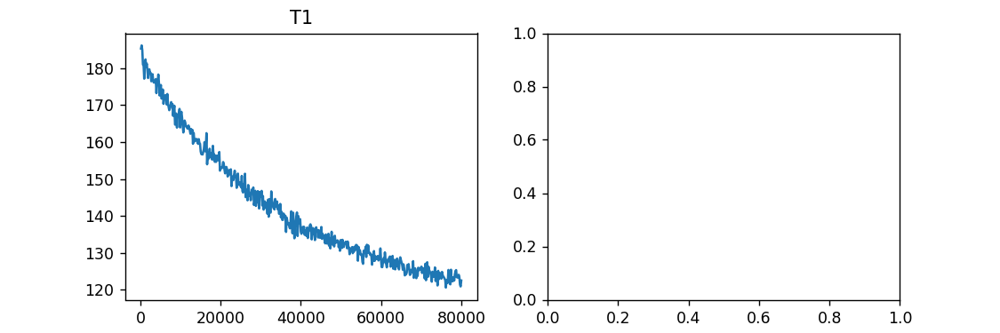

<IPython.core.display.Javascript object>


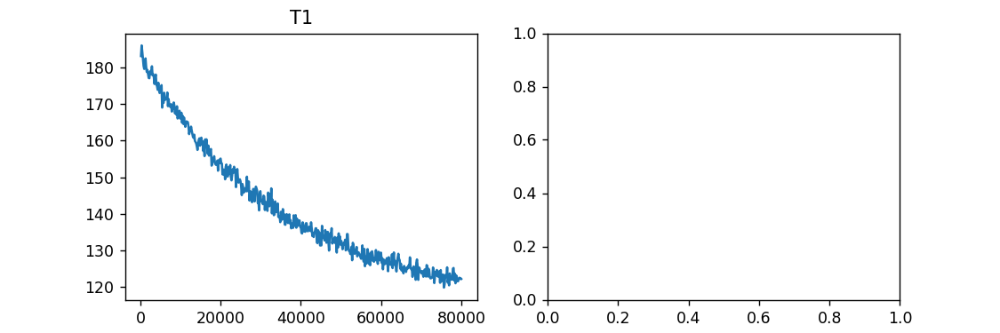

<IPython.core.display.Javascript object>


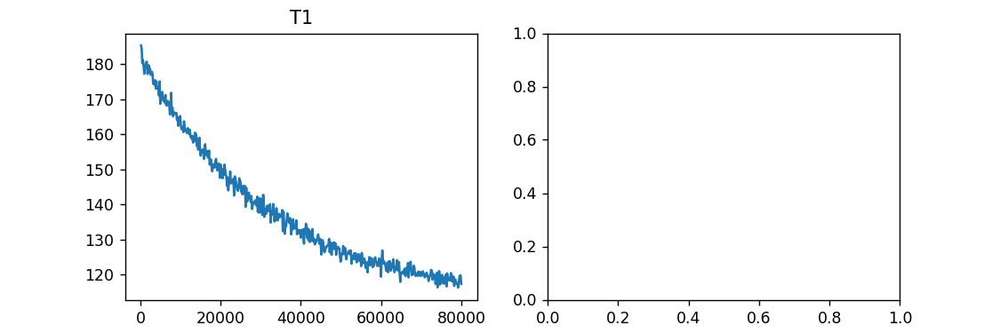

<IPython.core.display.Javascript object>


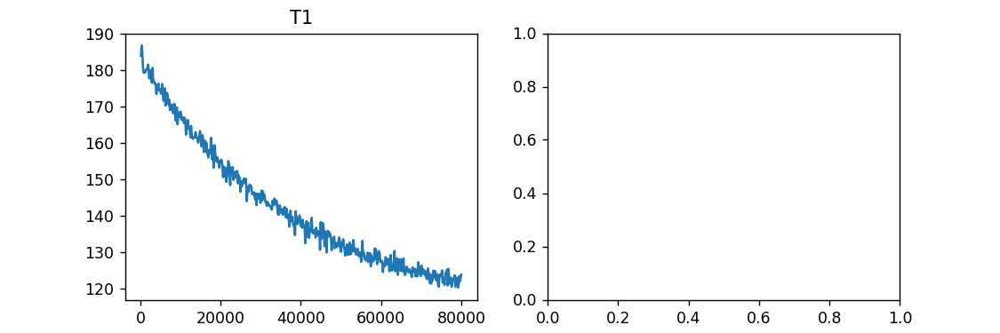

<IPython.core.display.Javascript object>


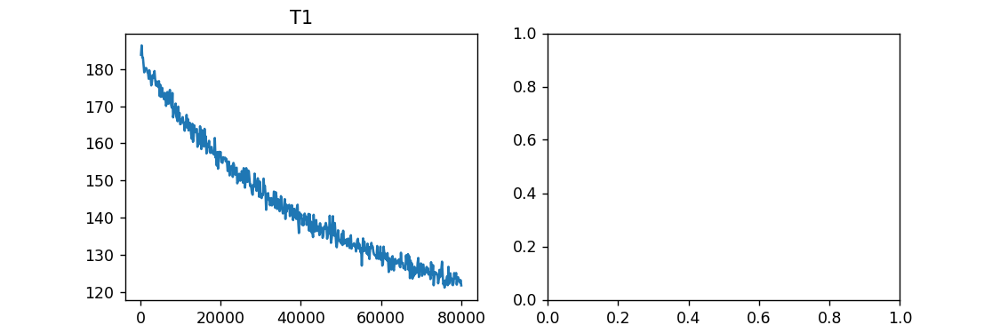

<IPython.core.display.Javascript object>


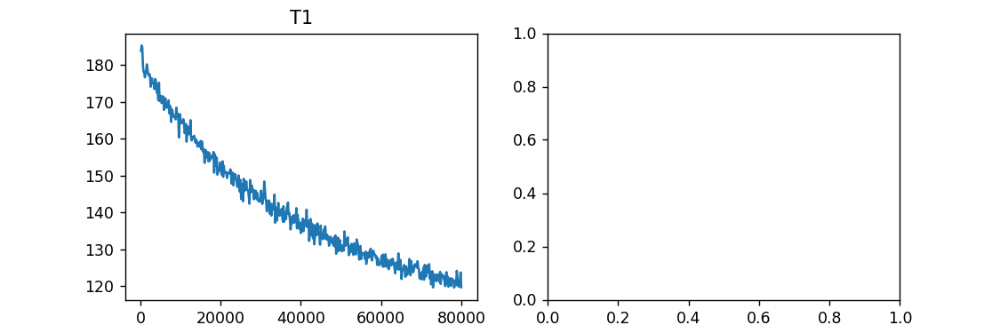

<IPython.core.display.Javascript object>


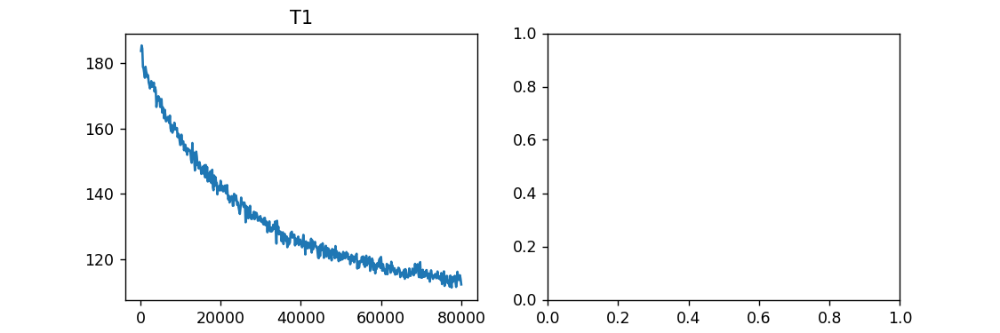

<IPython.core.display.Javascript object>


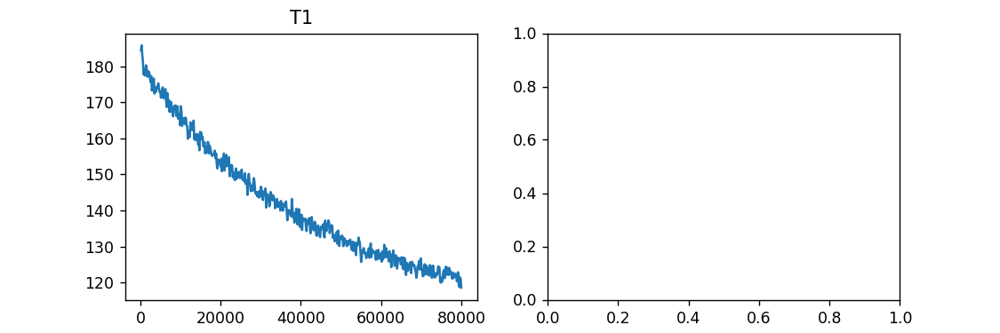

<IPython.core.display.Javascript object>


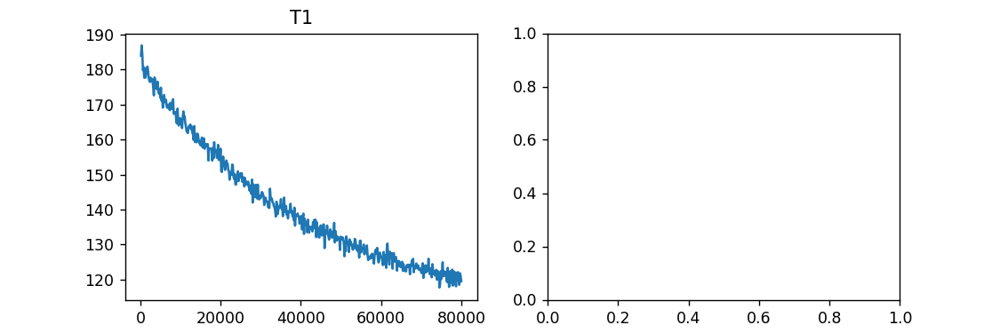

<IPython.core.display.Javascript object>


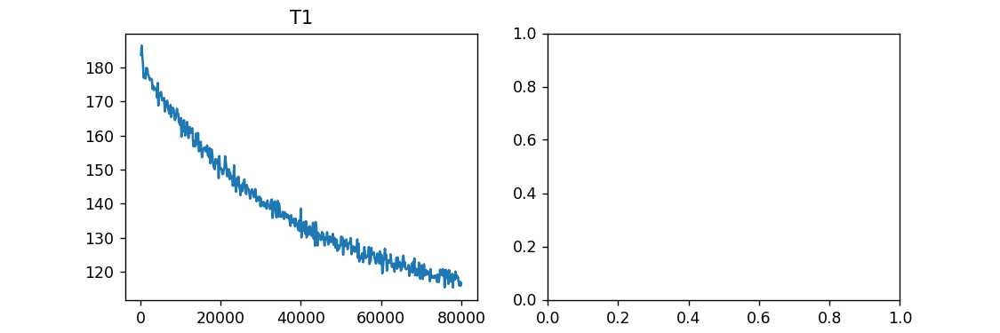

<IPython.core.display.Javascript object>


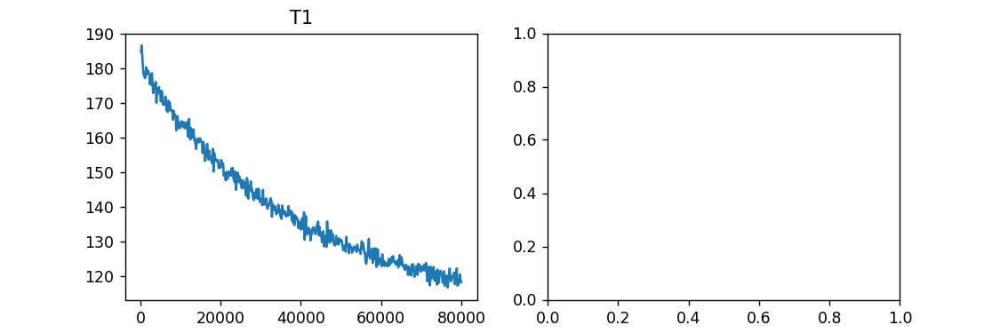

<IPython.core.display.Javascript object>


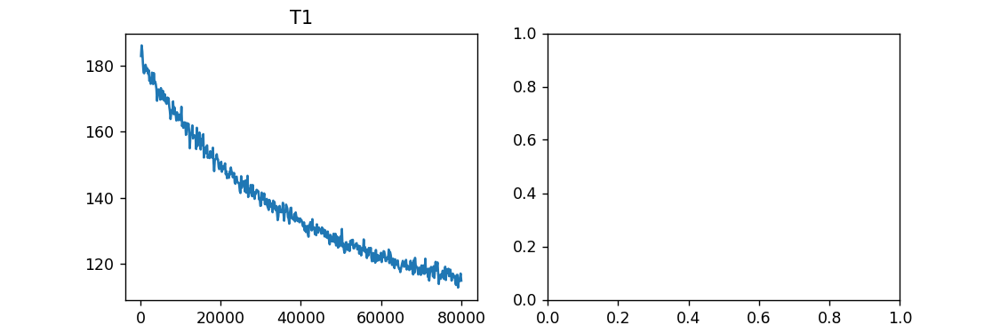

<IPython.core.display.Javascript object>


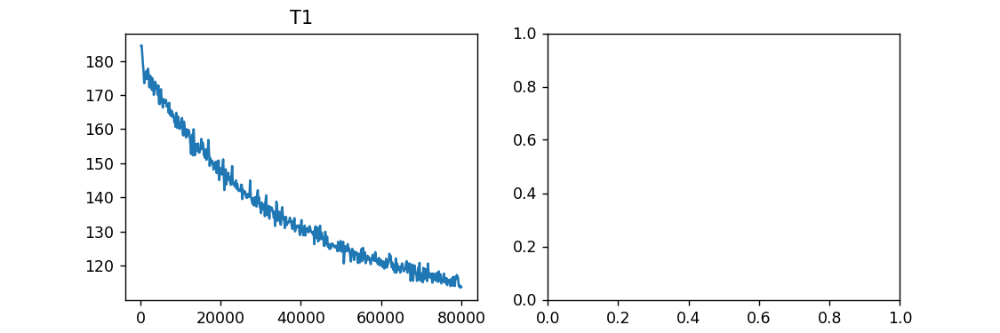

<IPython.core.display.Javascript object>


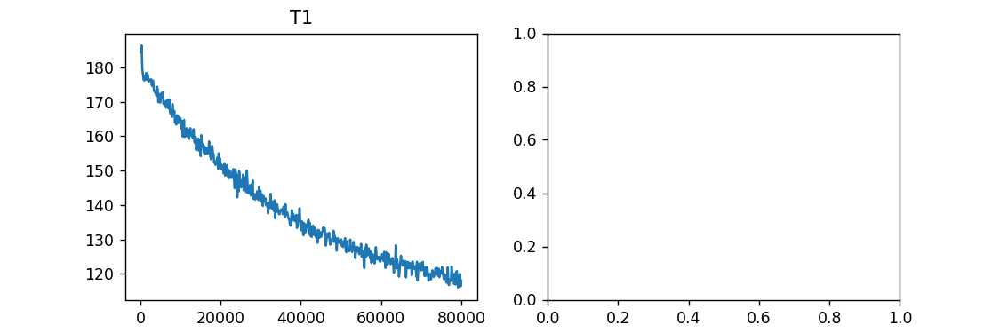

<IPython.core.display.Javascript object>


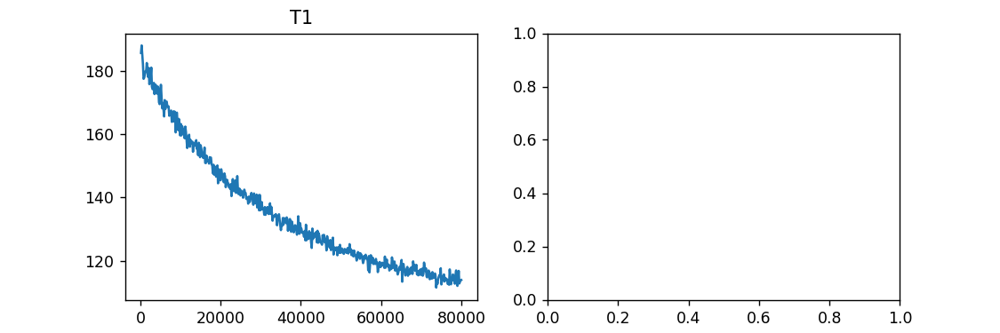

In [233]:
for i,v in enumerate(np.linspace(0,0.2,41)):
    value,num,tags = write(height=3,title='T1',which=(40-i))
    x,y = value[0]
    np.savetxt(f'D:\\QuLabData\\2019\\1220\\T1\\T1_{v}.txt', np.c_[x,y])

<IPython.core.display.Javascript object>


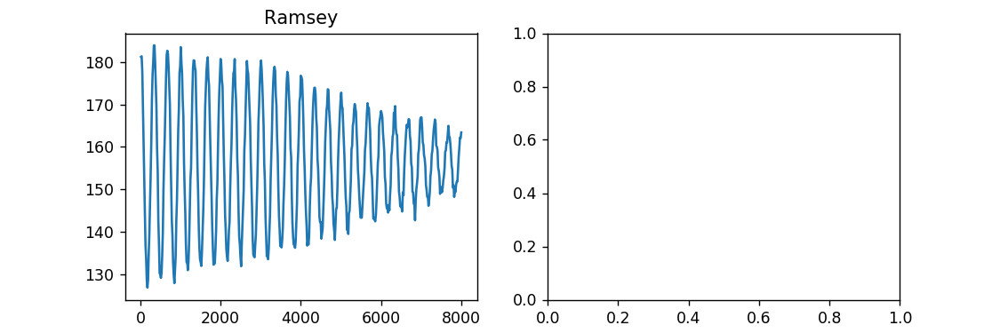

<IPython.core.display.Javascript object>


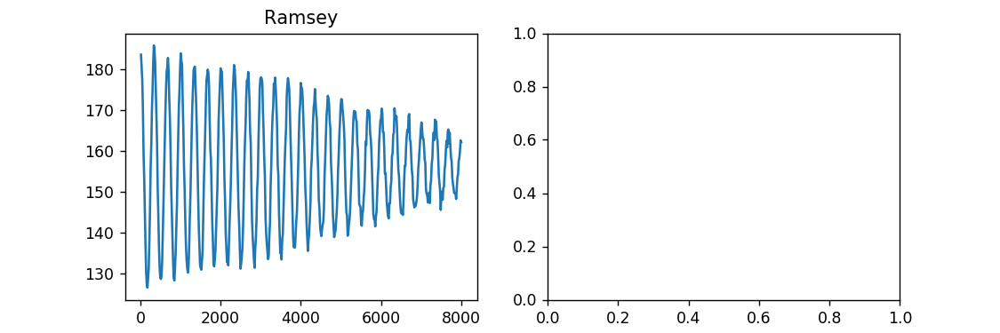

<IPython.core.display.Javascript object>


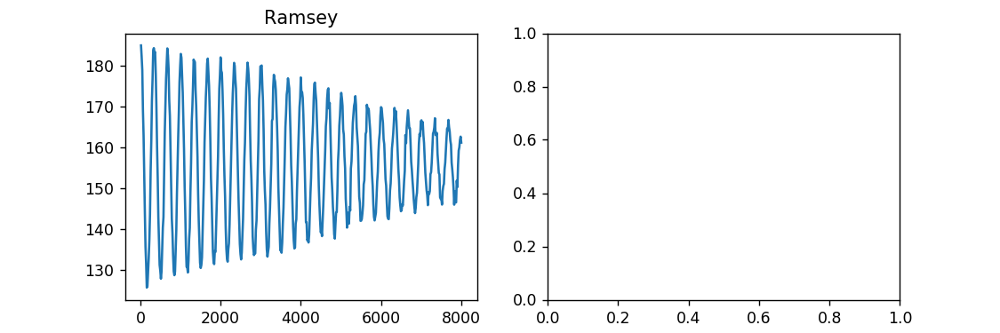

<IPython.core.display.Javascript object>


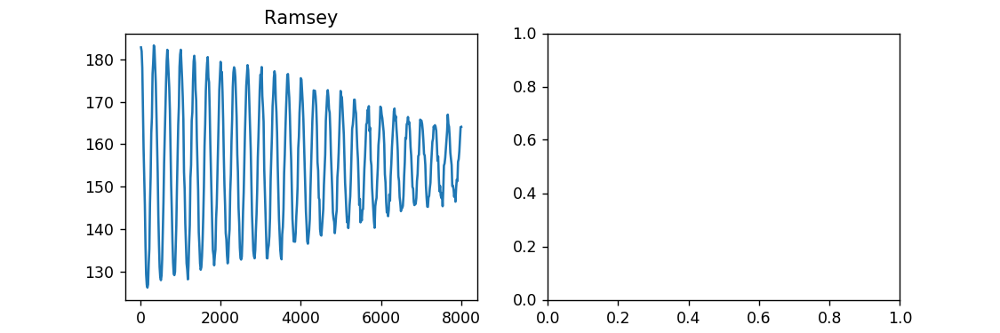

<IPython.core.display.Javascript object>


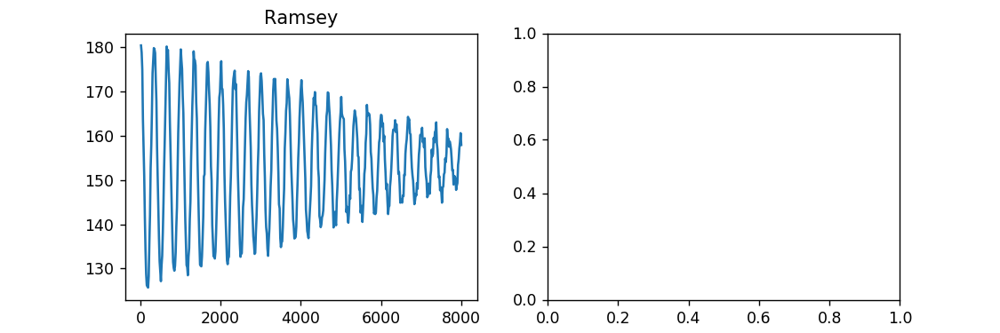

<IPython.core.display.Javascript object>


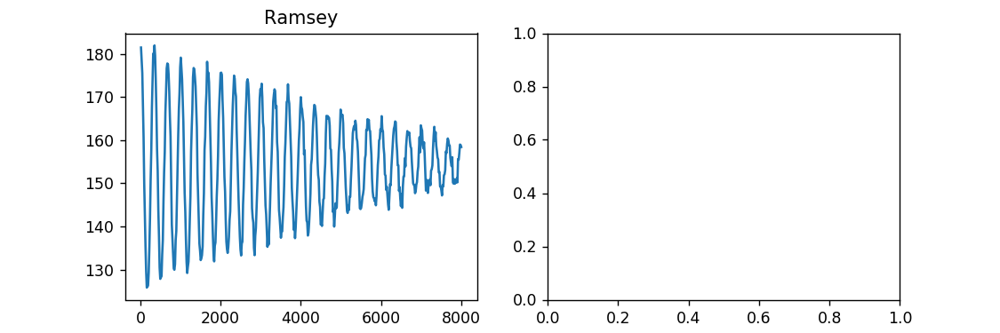

<IPython.core.display.Javascript object>


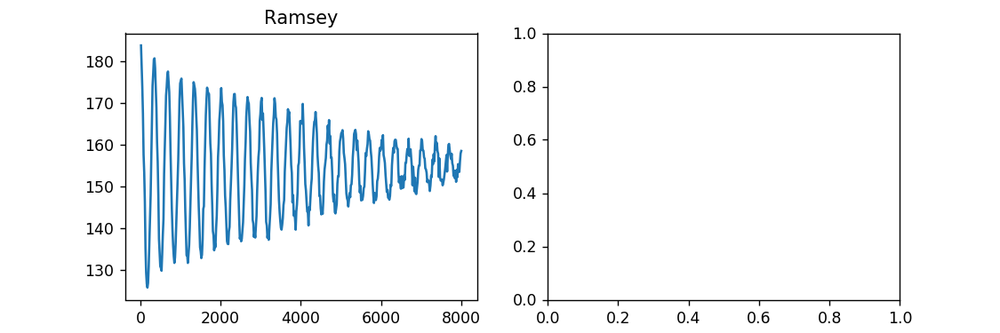

<IPython.core.display.Javascript object>


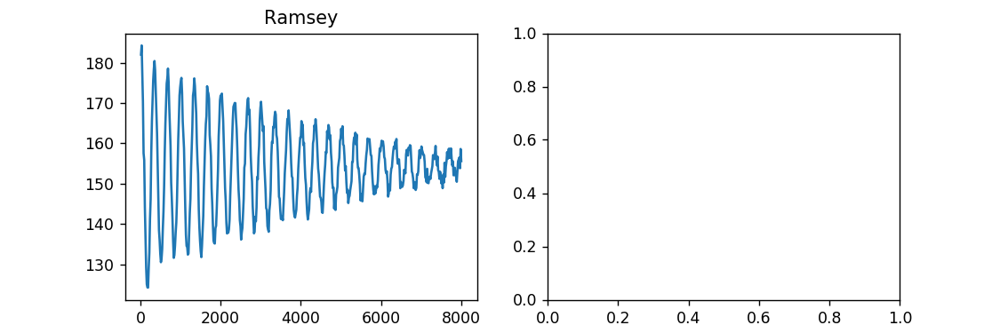

<IPython.core.display.Javascript object>


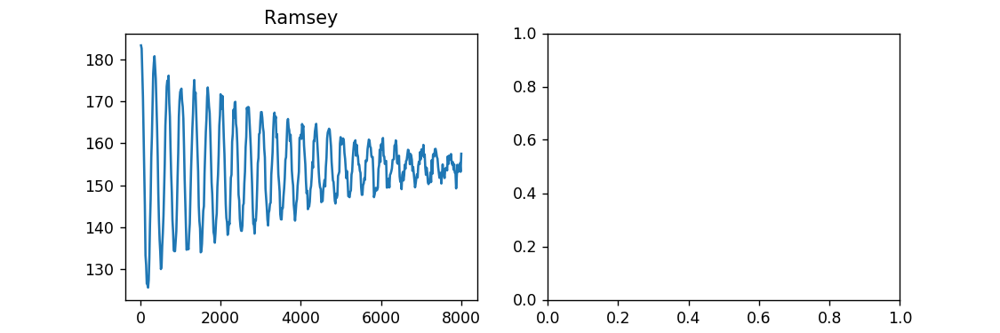

<IPython.core.display.Javascript object>


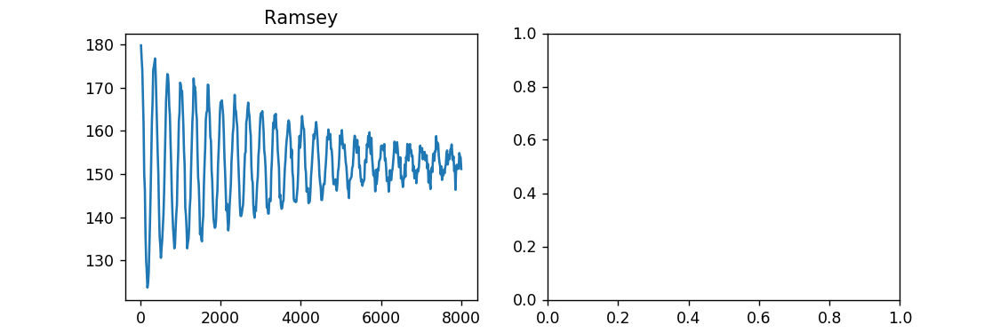

<IPython.core.display.Javascript object>


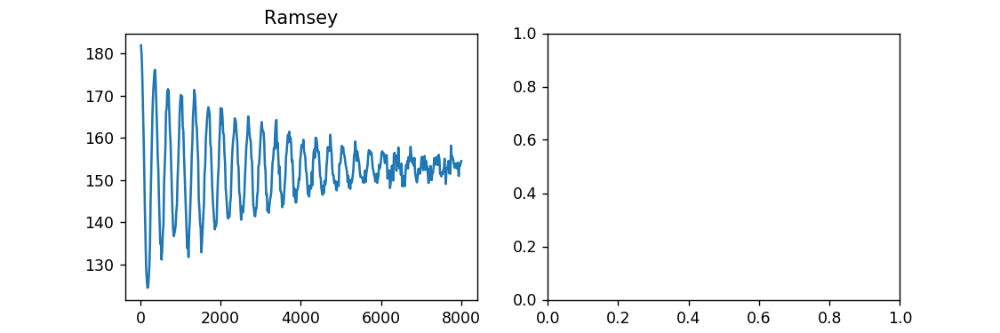

<IPython.core.display.Javascript object>


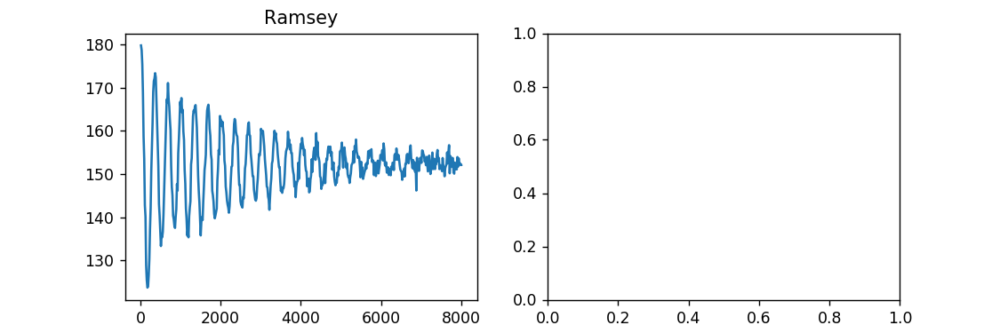

<IPython.core.display.Javascript object>


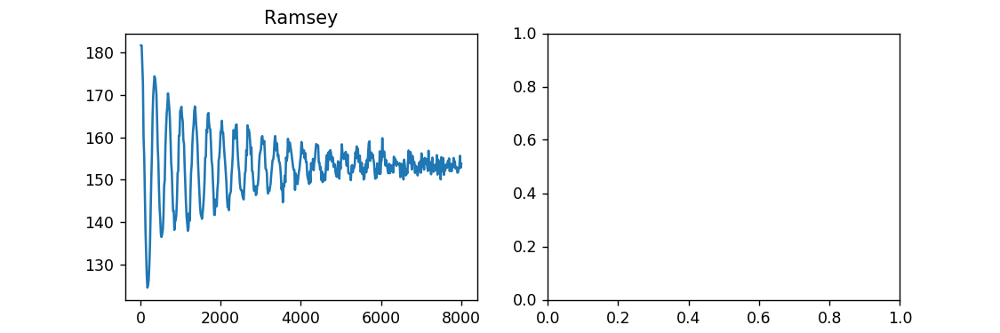

<IPython.core.display.Javascript object>


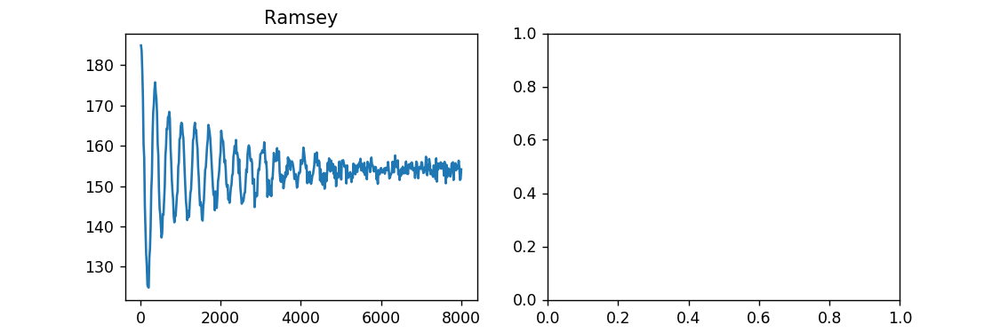

<IPython.core.display.Javascript object>


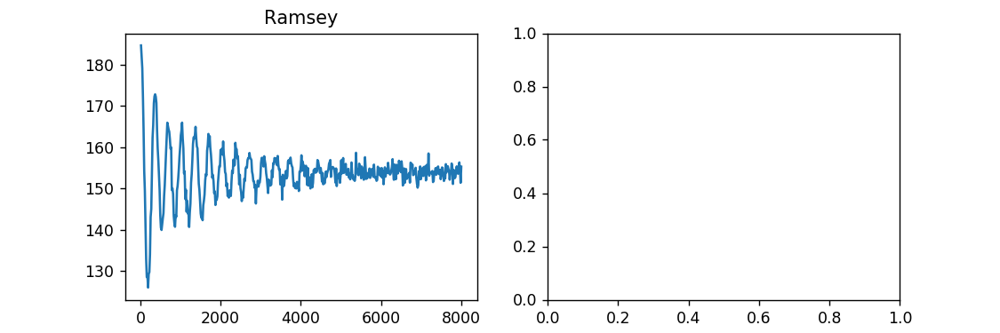

C:\WPy64-3740\python-3.7.4.amd64\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


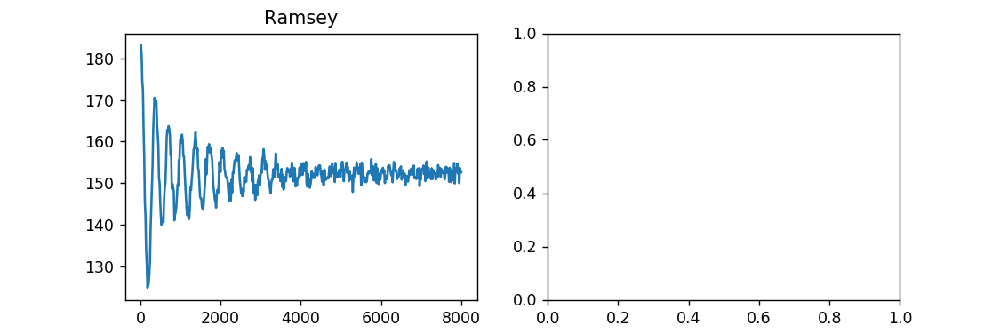

<IPython.core.display.Javascript object>


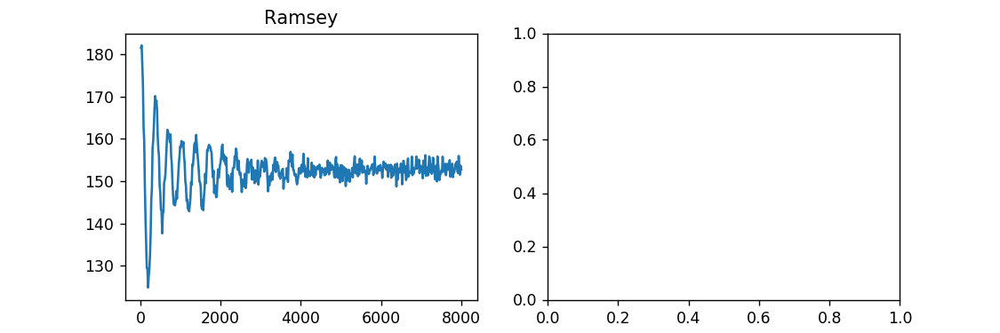

<IPython.core.display.Javascript object>


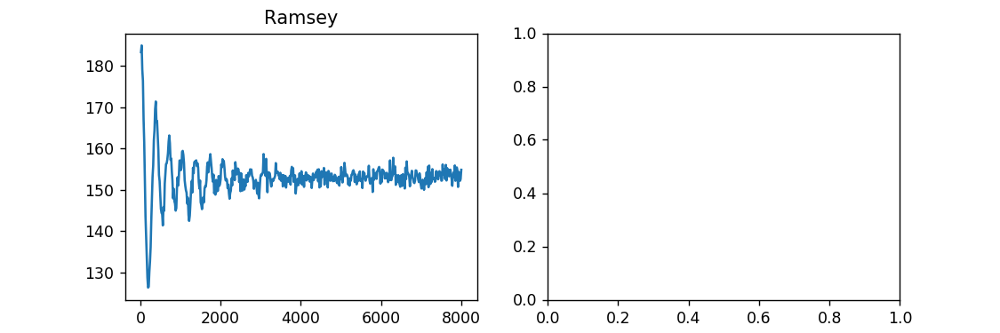

<IPython.core.display.Javascript object>


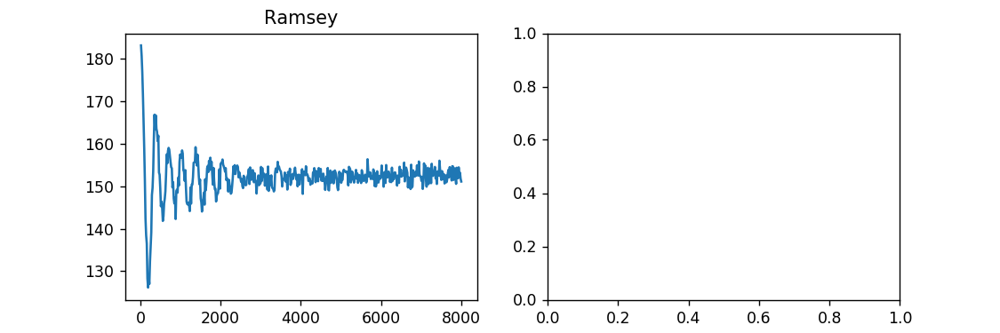

<IPython.core.display.Javascript object>


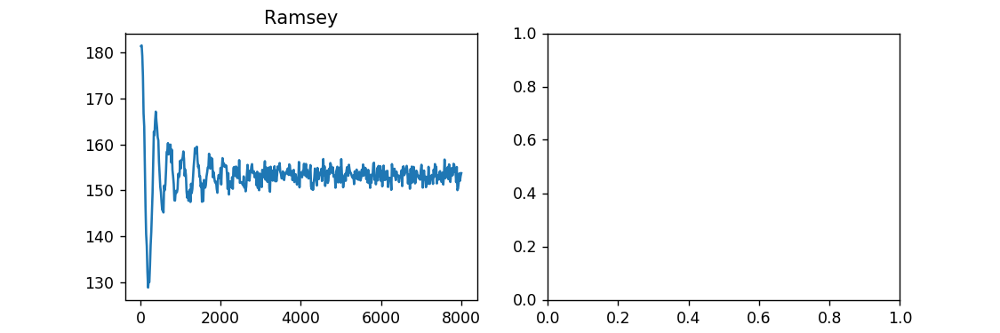

<IPython.core.display.Javascript object>


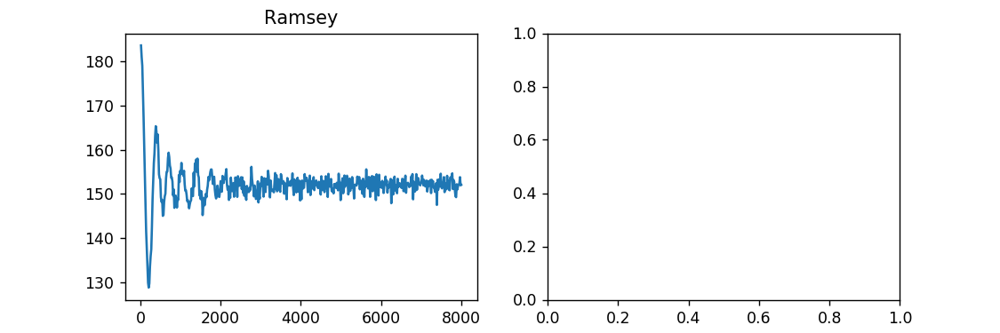

<IPython.core.display.Javascript object>


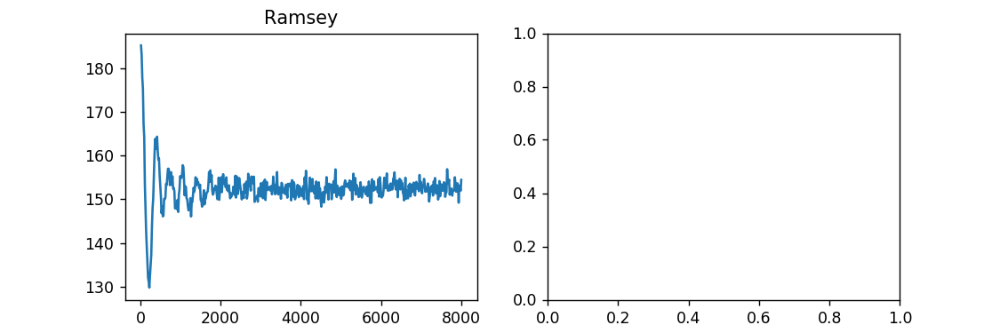

<IPython.core.display.Javascript object>


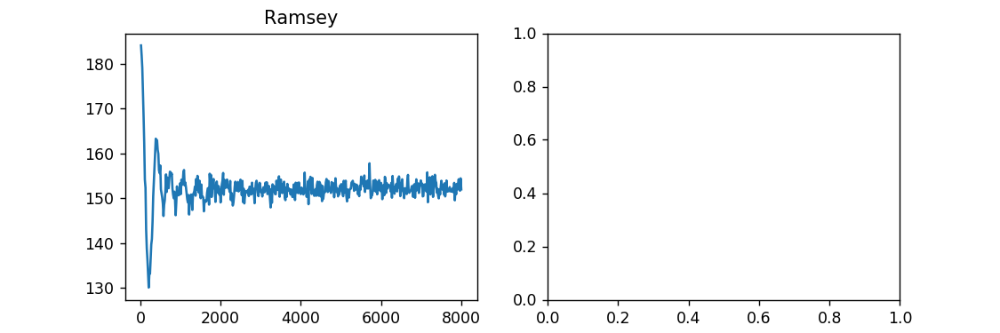

<IPython.core.display.Javascript object>


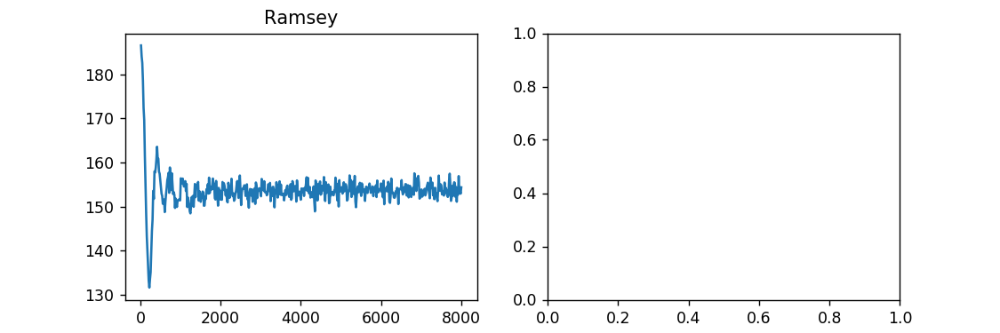

<IPython.core.display.Javascript object>


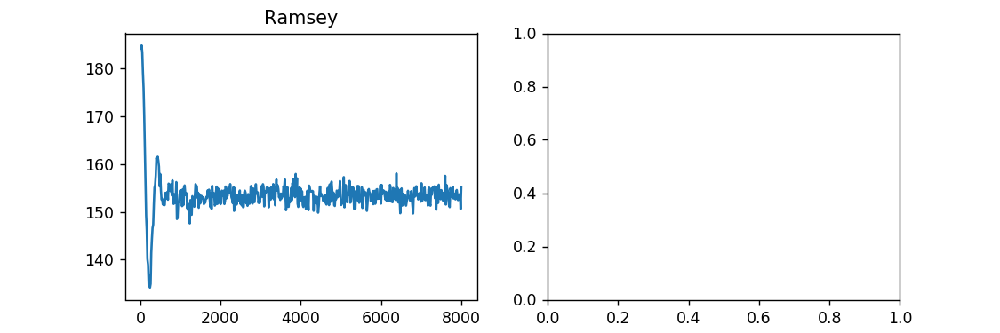

<IPython.core.display.Javascript object>


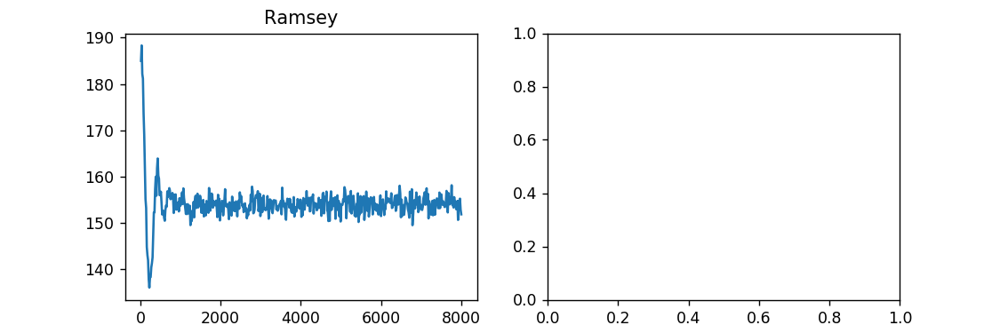

<IPython.core.display.Javascript object>


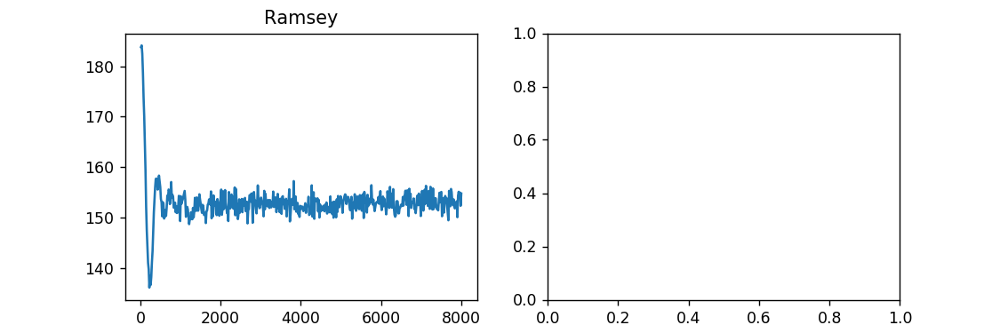

<IPython.core.display.Javascript object>


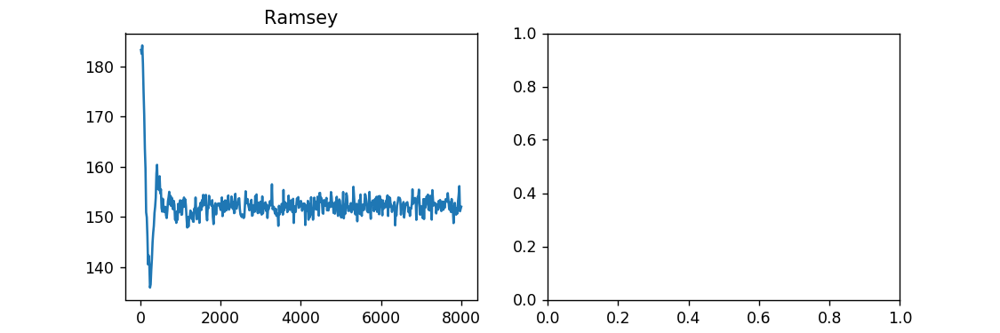

<IPython.core.display.Javascript object>


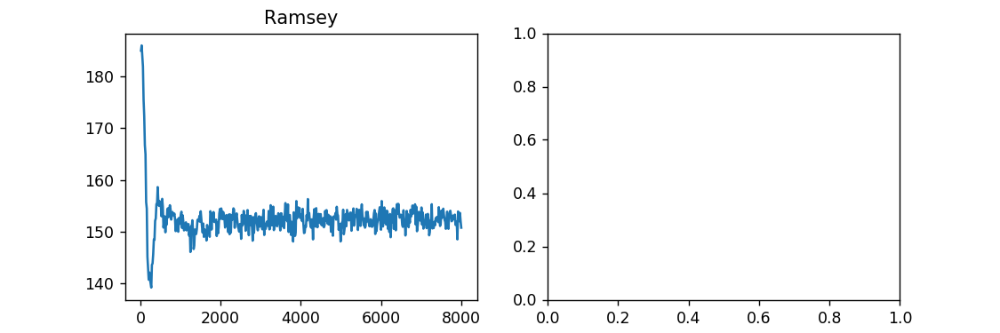

<IPython.core.display.Javascript object>


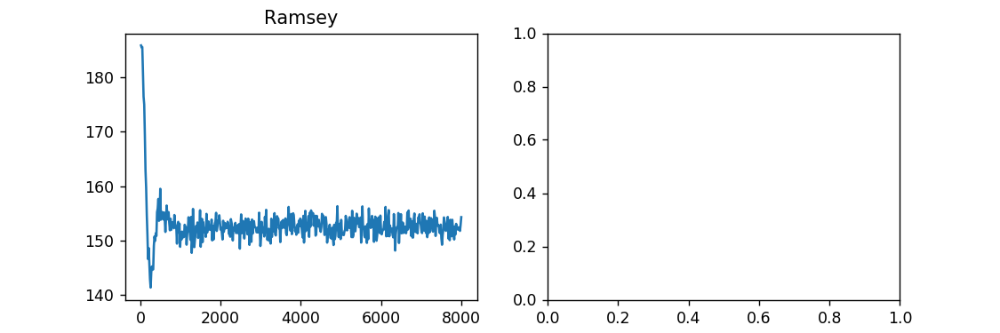

<IPython.core.display.Javascript object>


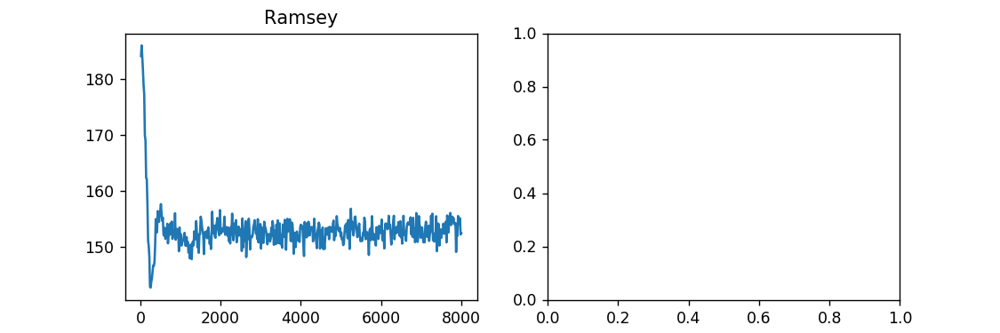

<IPython.core.display.Javascript object>


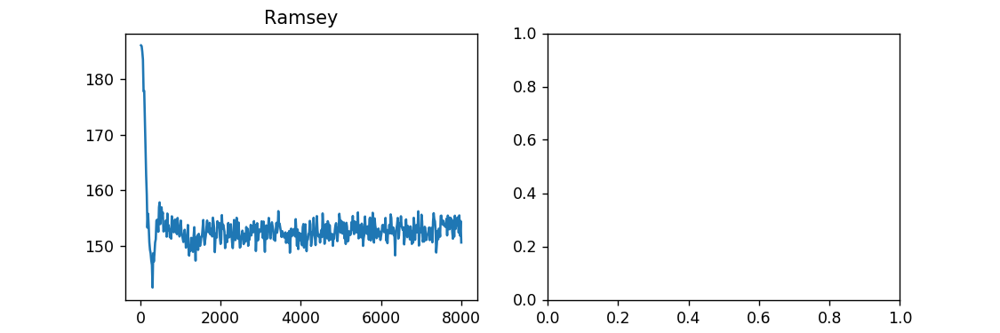

<IPython.core.display.Javascript object>


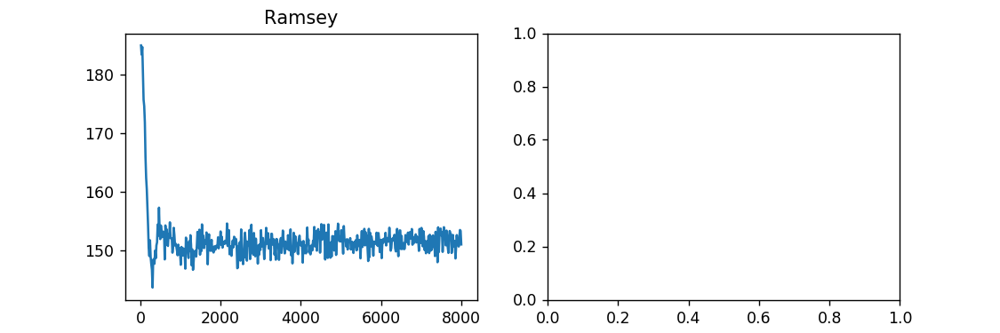

<IPython.core.display.Javascript object>


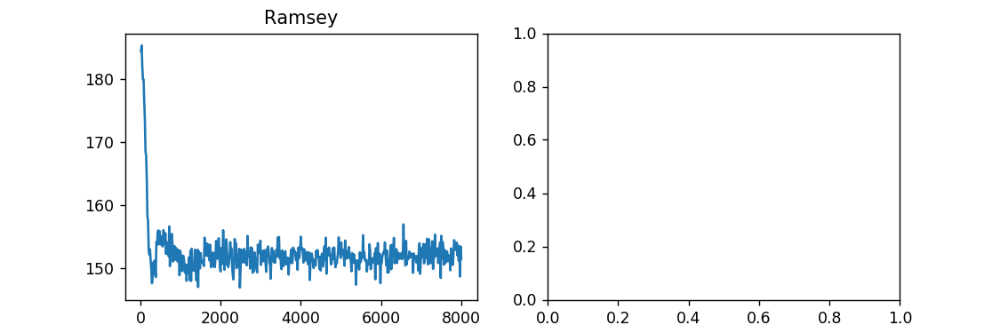

<IPython.core.display.Javascript object>


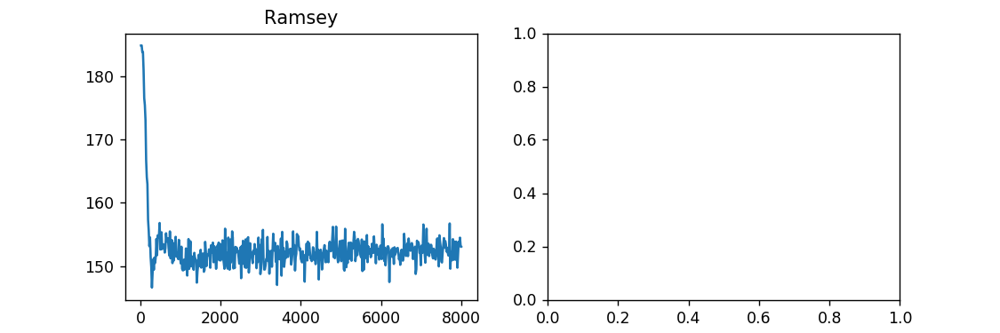

<IPython.core.display.Javascript object>


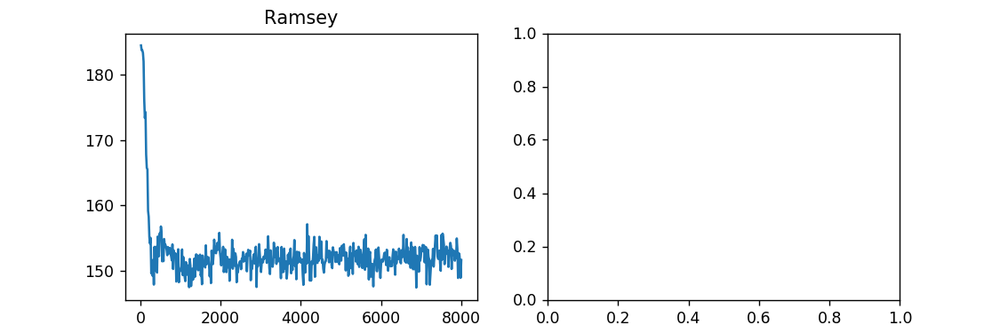

<IPython.core.display.Javascript object>


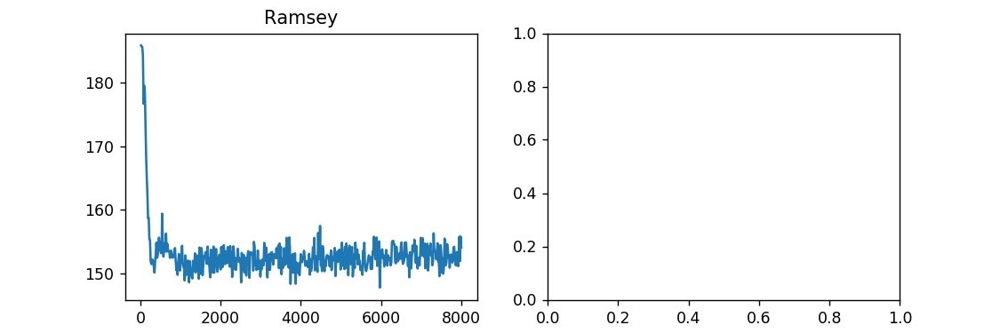

<IPython.core.display.Javascript object>


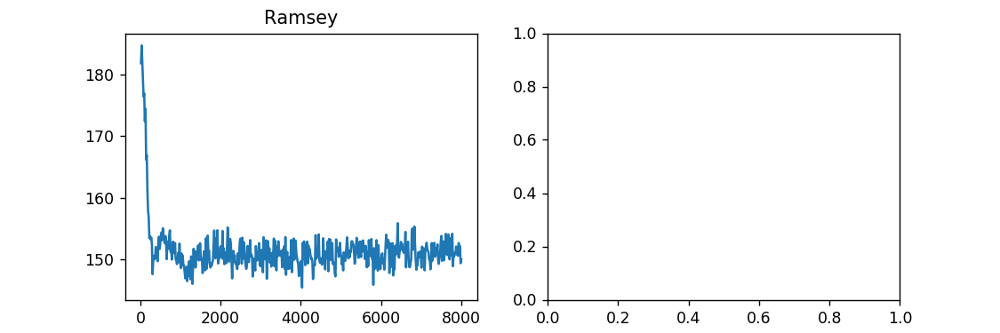

<IPython.core.display.Javascript object>


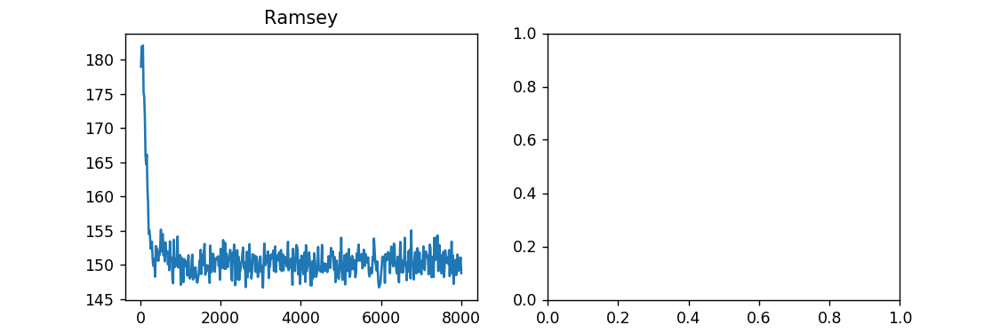

<IPython.core.display.Javascript object>


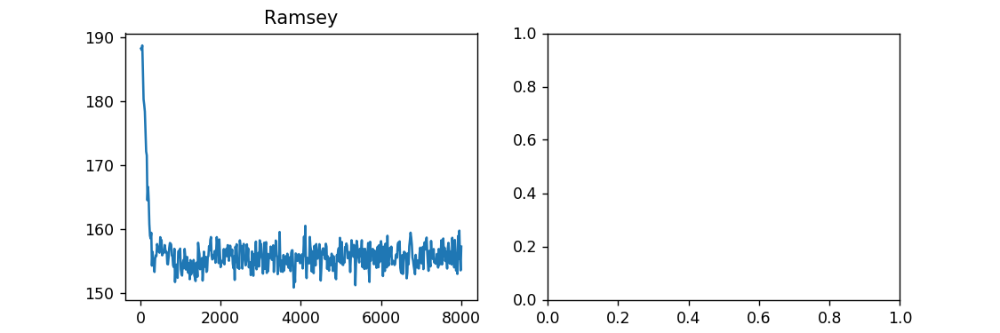

<IPython.core.display.Javascript object>


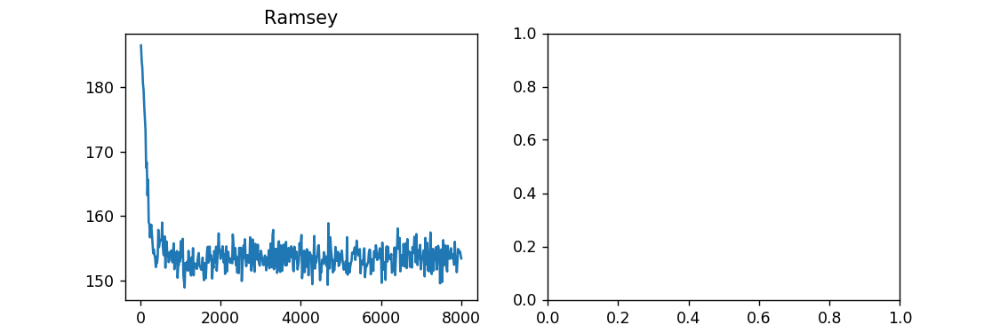

In [247]:
for i,v in enumerate(np.linspace(0,0.2,41)):
    value,num,tags = write(height=3,title='Ramsey',which=(40-i))
    x,y = value[0]
    np.savetxt(f'D:\\QuLabData\\2019\\1220\\Ramsey\\Ramsey_{v}.txt', np.c_[x,y])

<IPython.core.display.Javascript object>


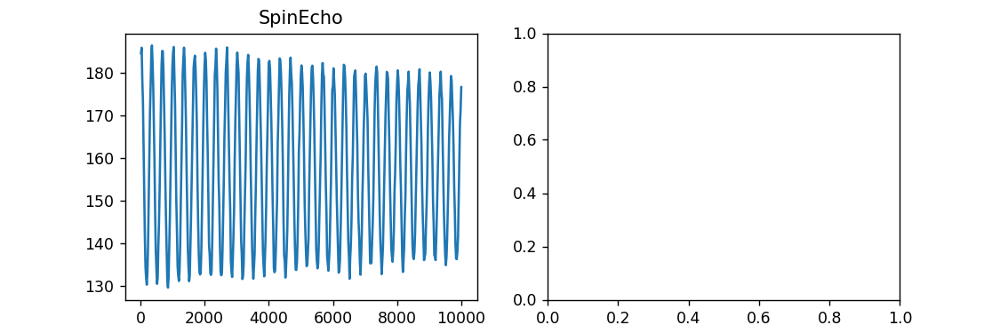

<IPython.core.display.Javascript object>


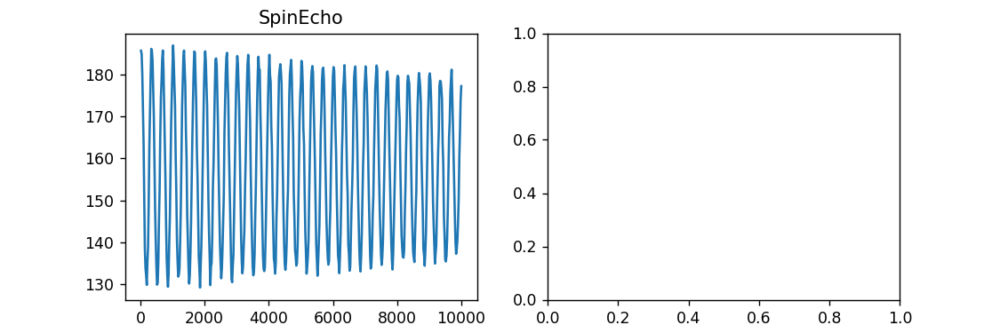

<IPython.core.display.Javascript object>


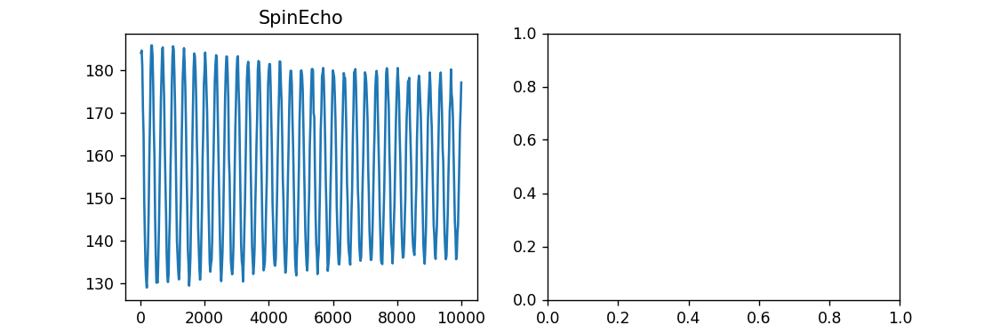

<IPython.core.display.Javascript object>


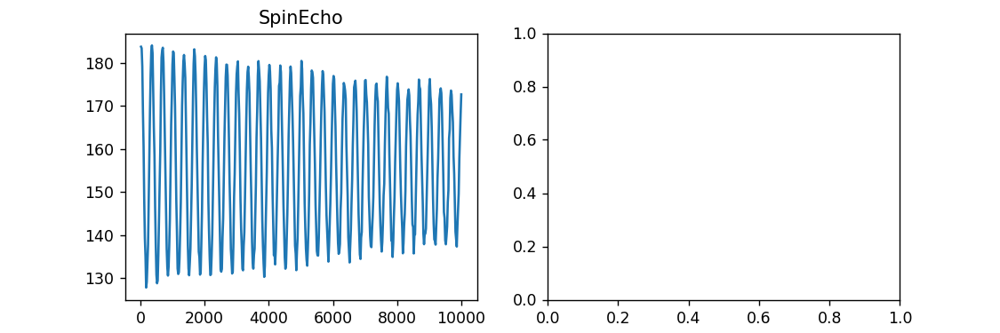

<IPython.core.display.Javascript object>


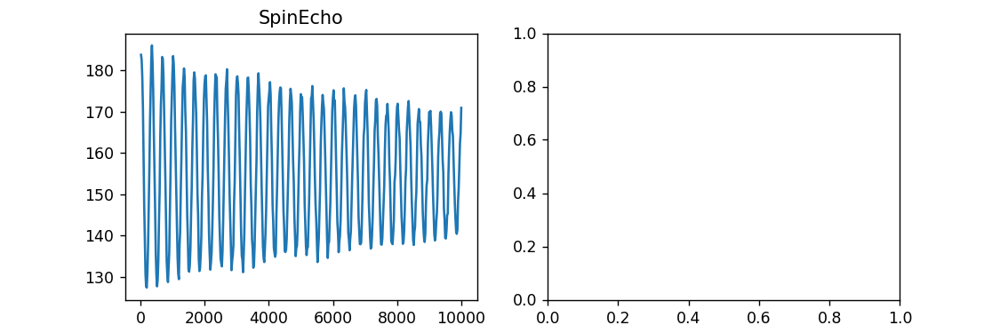

<IPython.core.display.Javascript object>


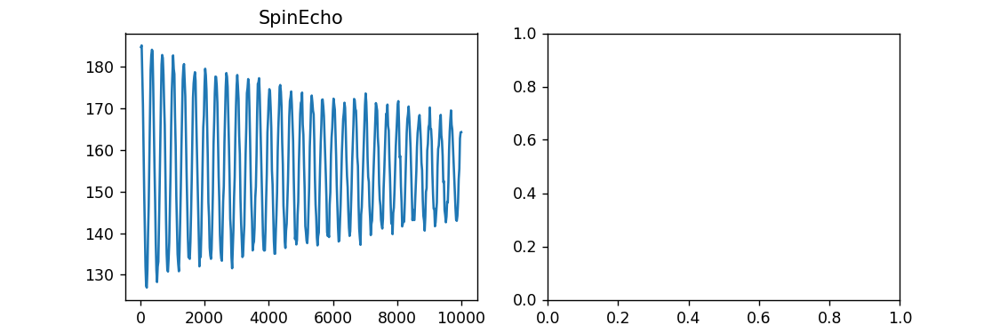

<IPython.core.display.Javascript object>


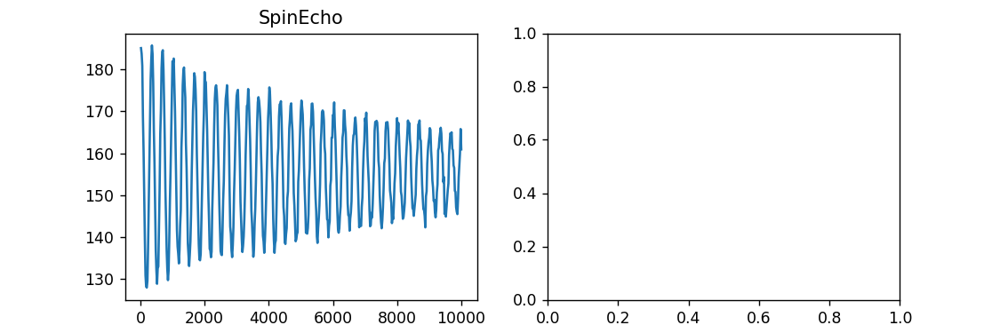

<IPython.core.display.Javascript object>


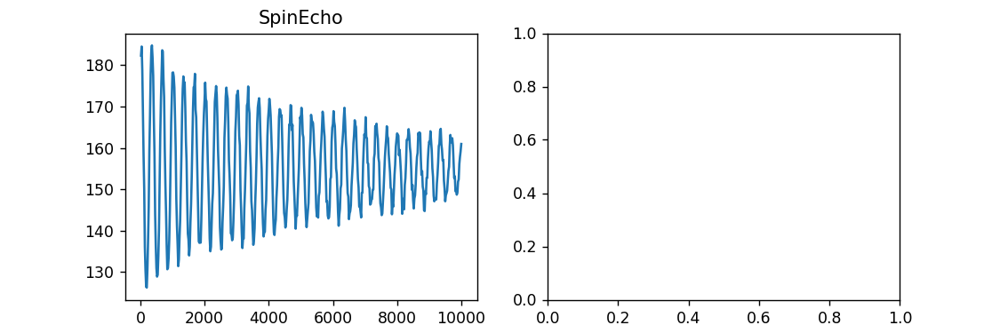

<IPython.core.display.Javascript object>


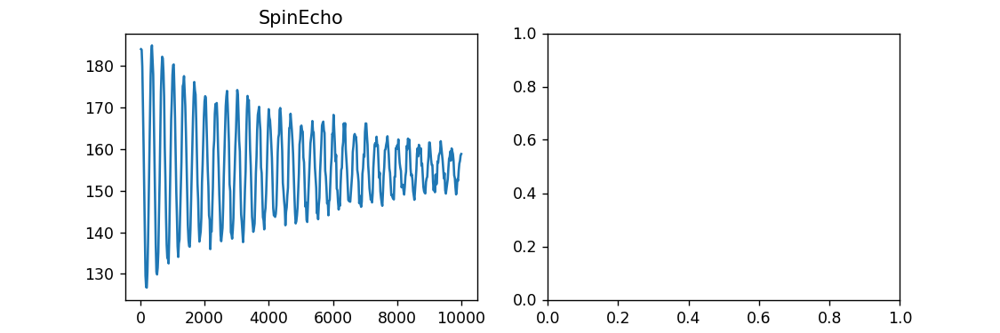

<IPython.core.display.Javascript object>


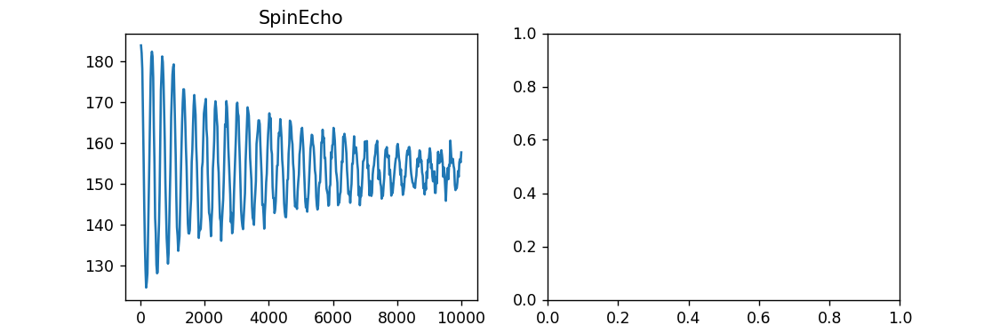

<IPython.core.display.Javascript object>


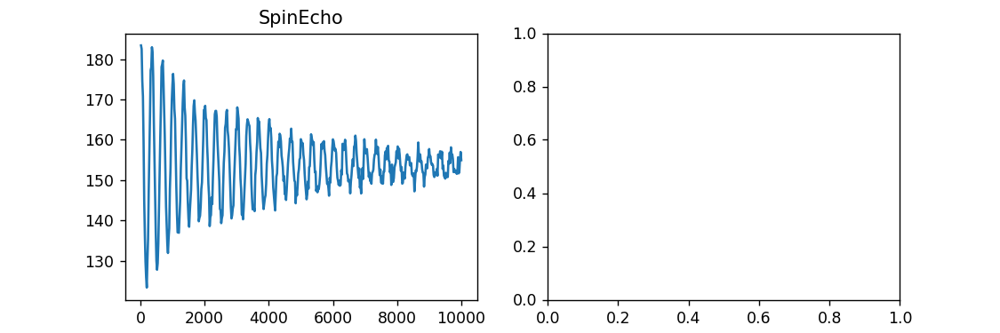

<IPython.core.display.Javascript object>


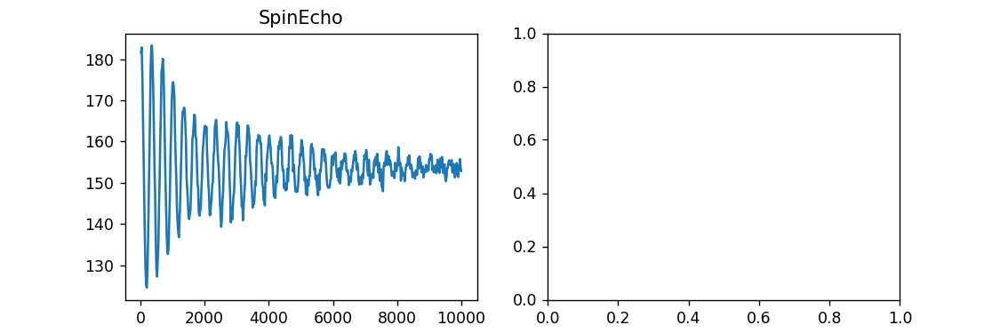

<IPython.core.display.Javascript object>


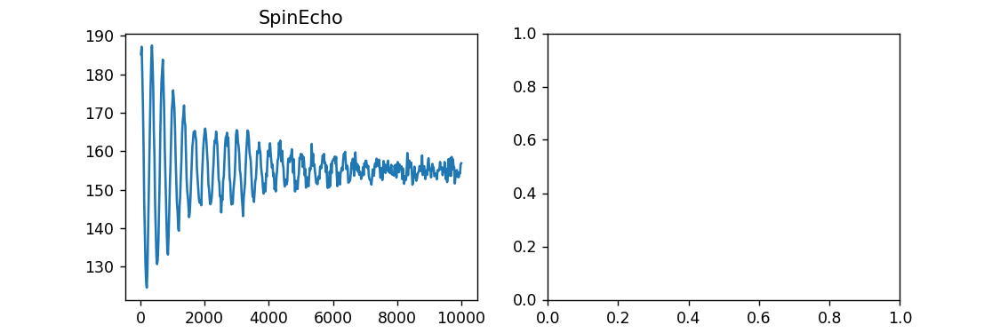

<IPython.core.display.Javascript object>


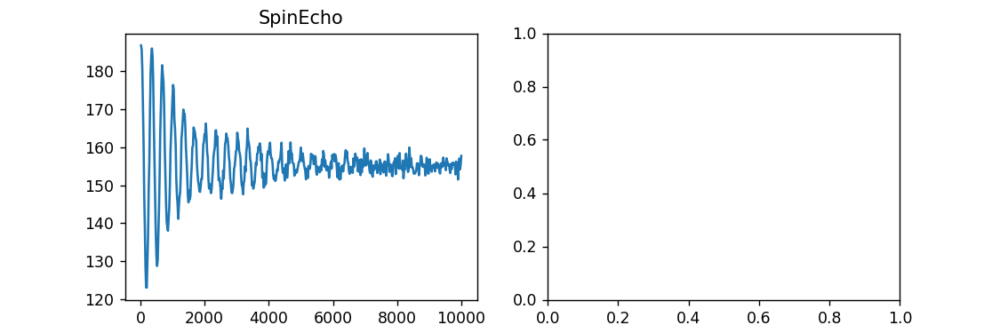

<IPython.core.display.Javascript object>


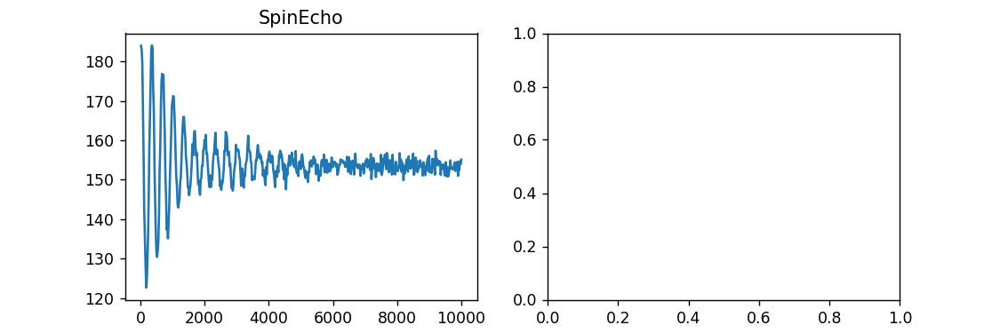

C:\WPy64-3740\python-3.7.4.amd64\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


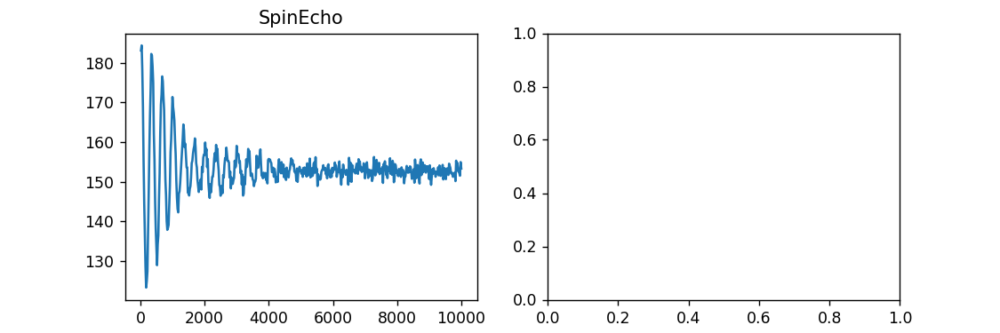

<IPython.core.display.Javascript object>


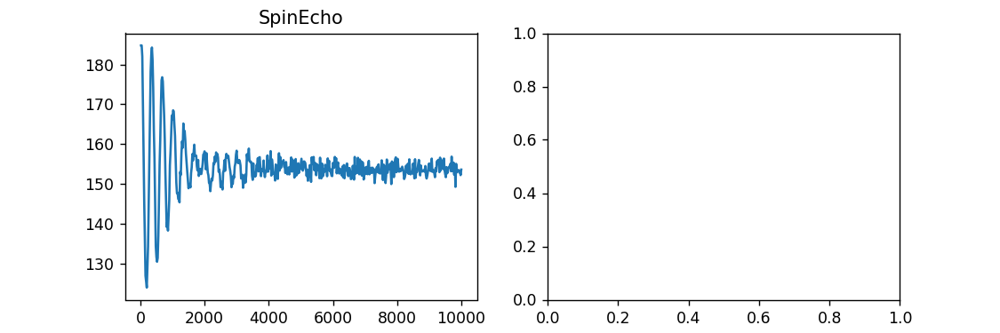

<IPython.core.display.Javascript object>


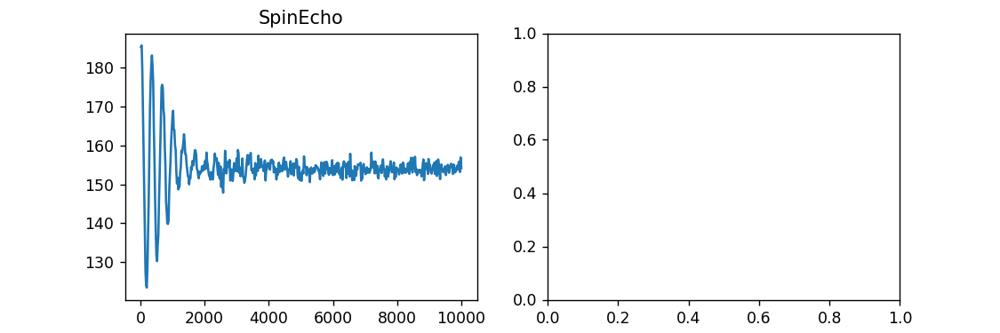

<IPython.core.display.Javascript object>


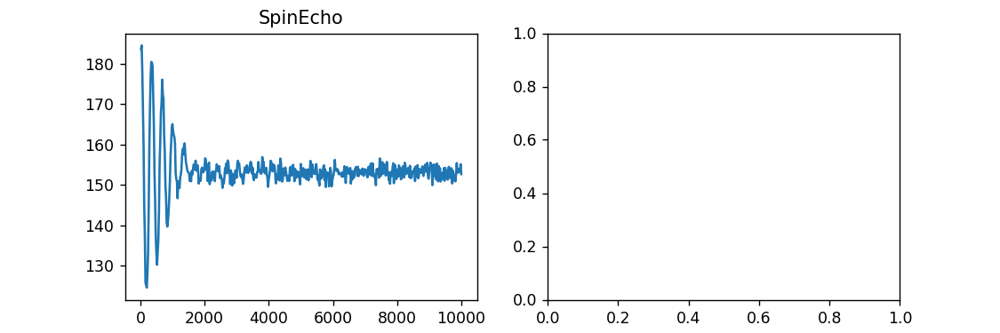

<IPython.core.display.Javascript object>


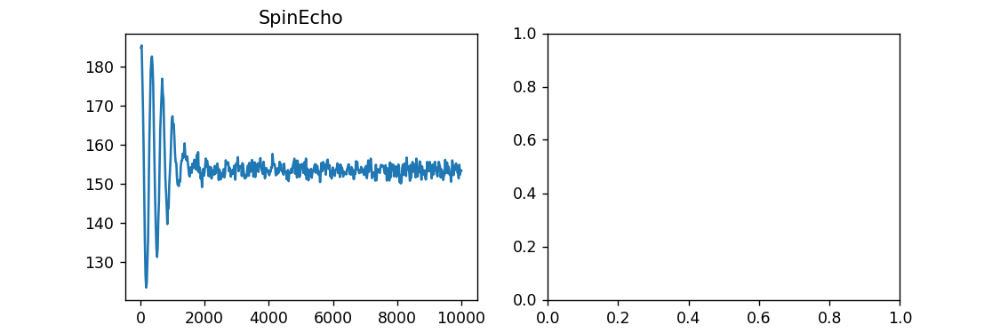

<IPython.core.display.Javascript object>


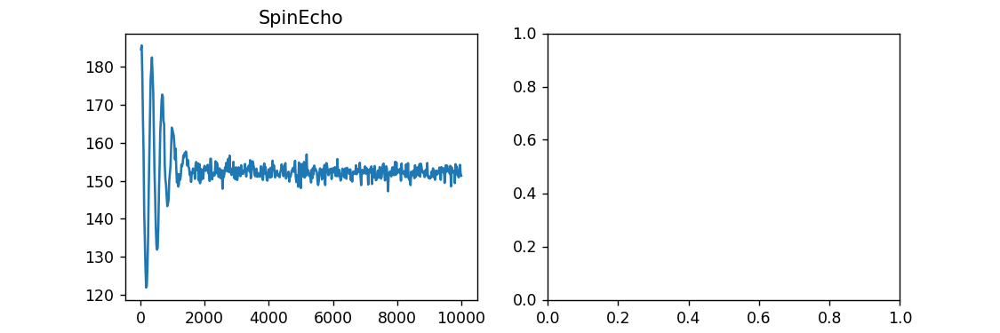

<IPython.core.display.Javascript object>


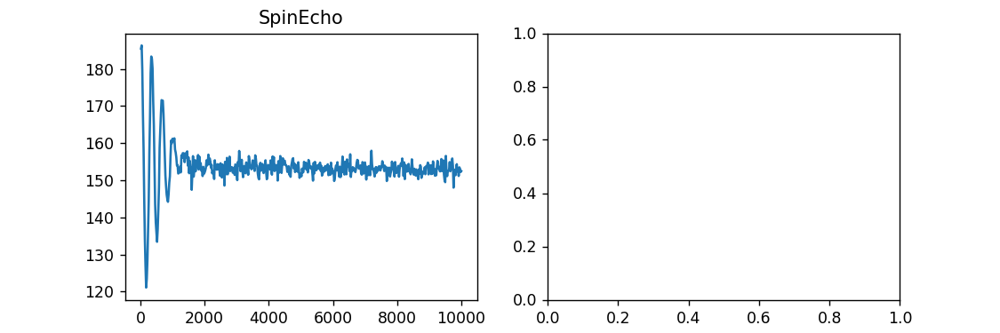

<IPython.core.display.Javascript object>


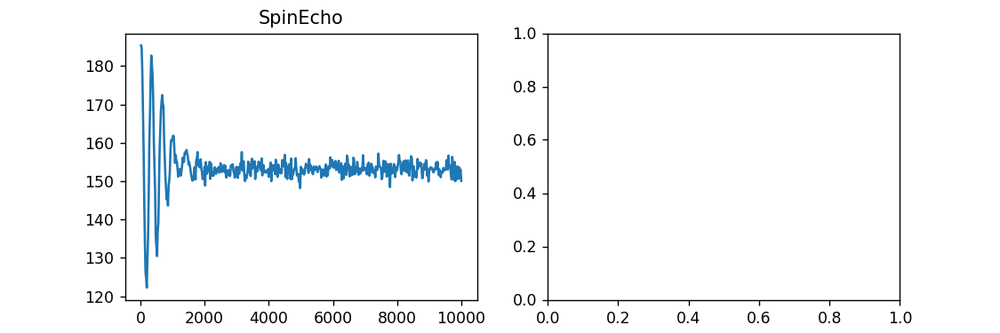

<IPython.core.display.Javascript object>


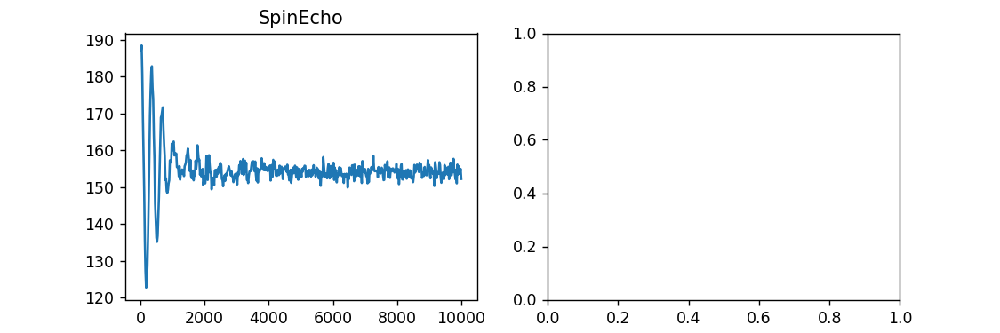

<IPython.core.display.Javascript object>


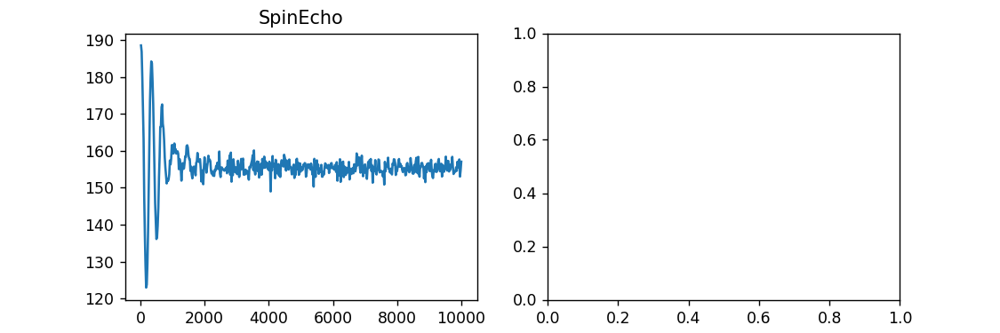

<IPython.core.display.Javascript object>


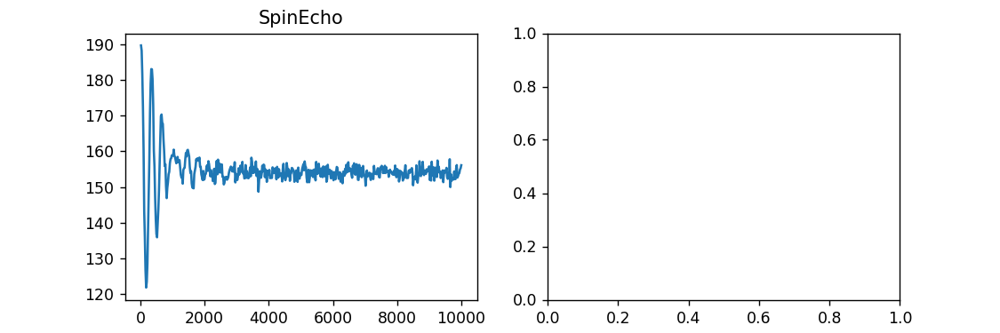

<IPython.core.display.Javascript object>


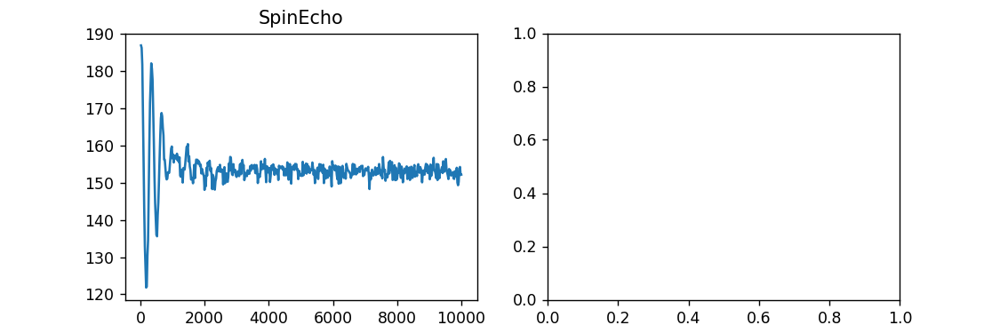

<IPython.core.display.Javascript object>


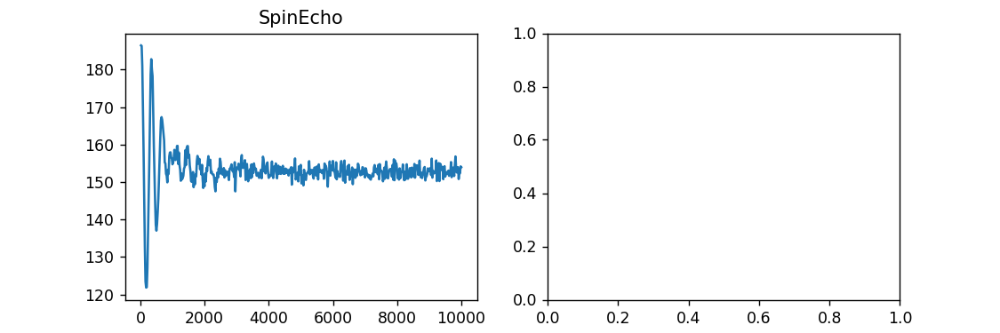

<IPython.core.display.Javascript object>


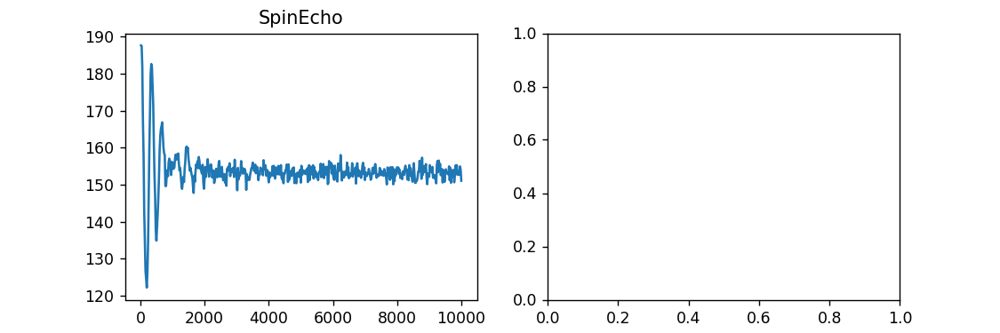

<IPython.core.display.Javascript object>


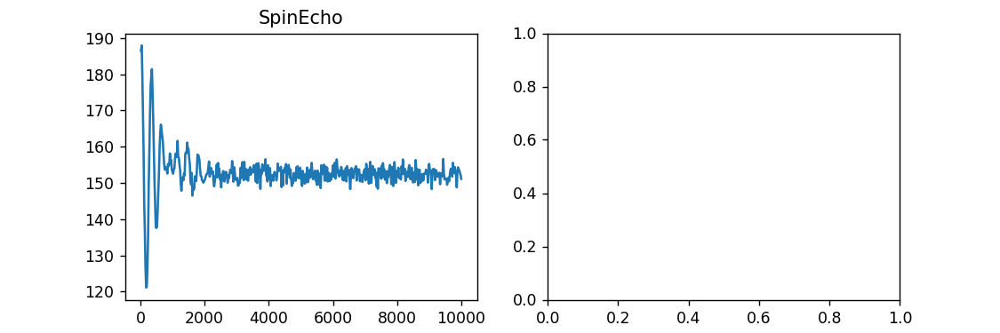

<IPython.core.display.Javascript object>


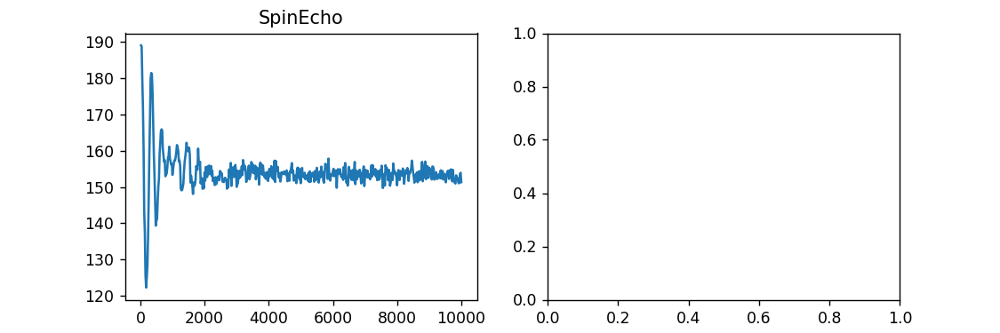

<IPython.core.display.Javascript object>


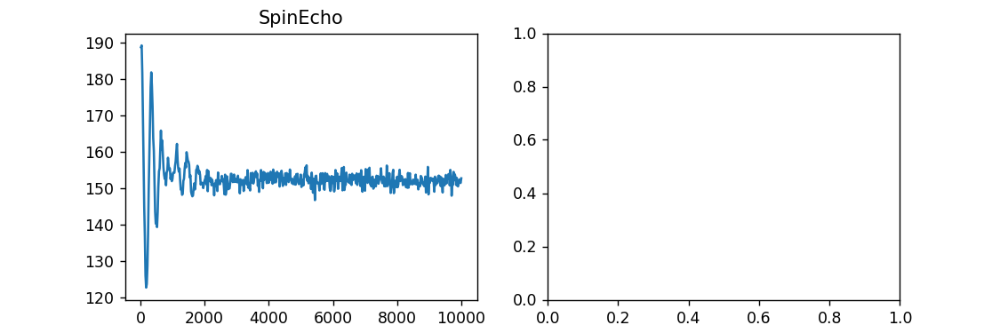

<IPython.core.display.Javascript object>


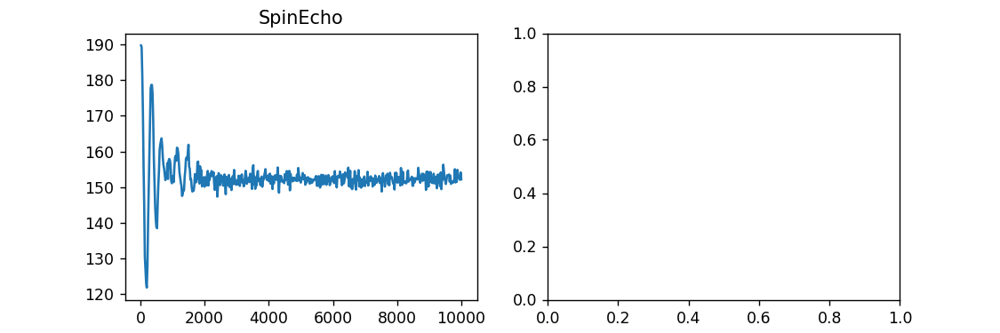

<IPython.core.display.Javascript object>


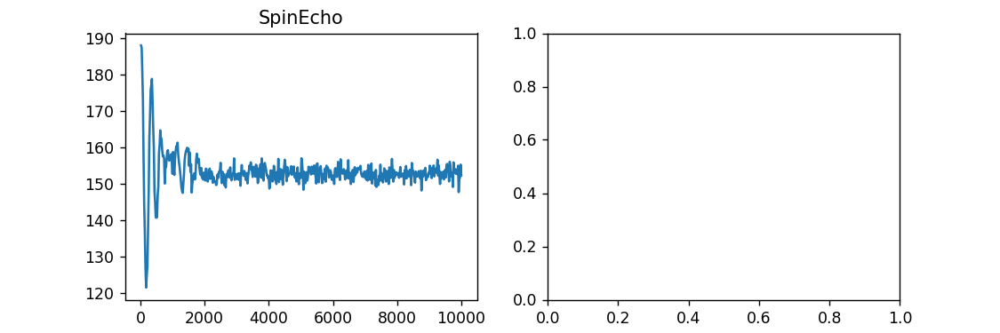

<IPython.core.display.Javascript object>


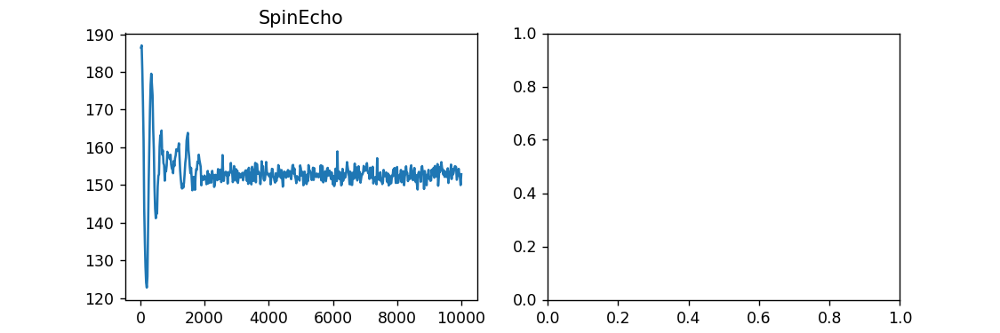

<IPython.core.display.Javascript object>


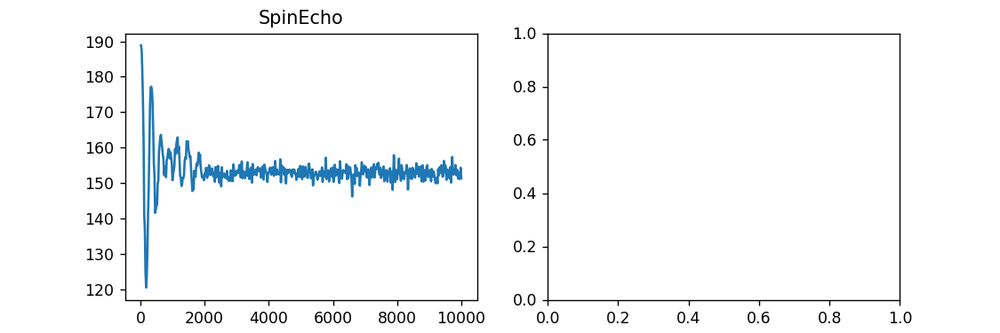

<IPython.core.display.Javascript object>


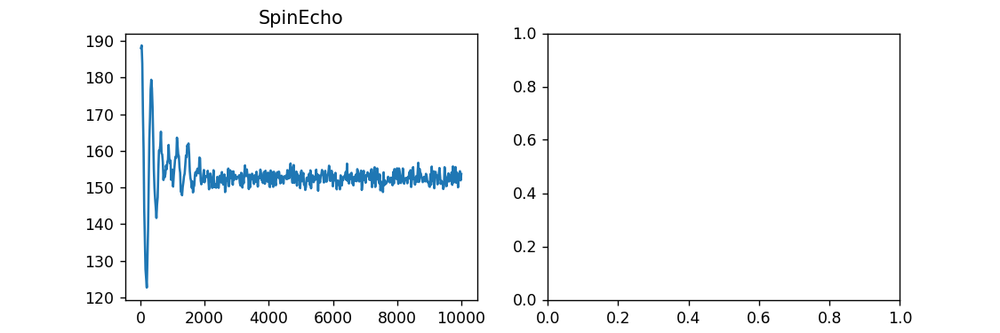

<IPython.core.display.Javascript object>


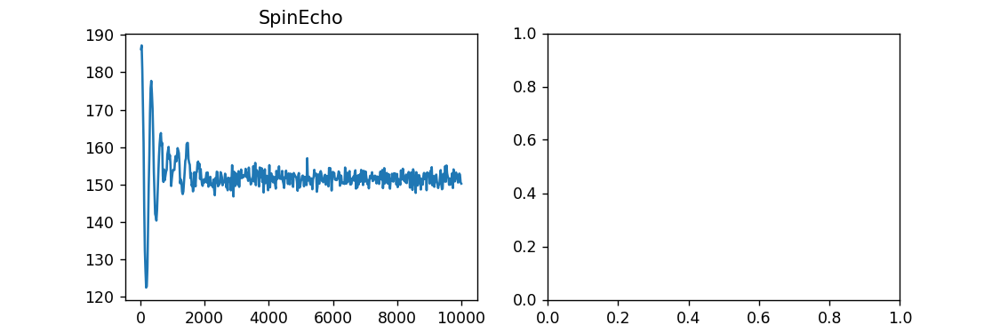

<IPython.core.display.Javascript object>


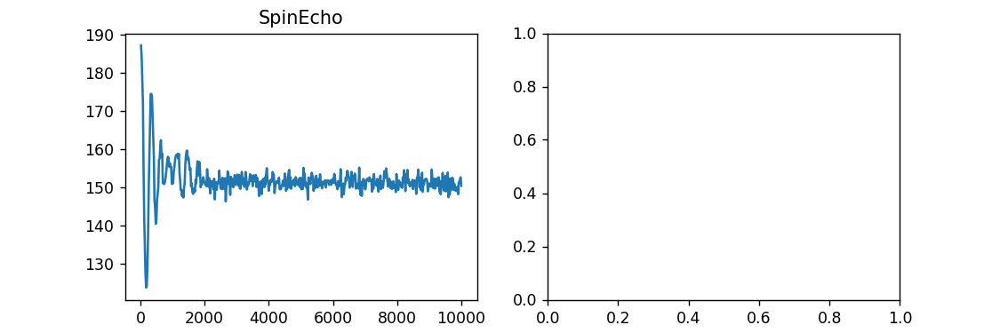

<IPython.core.display.Javascript object>


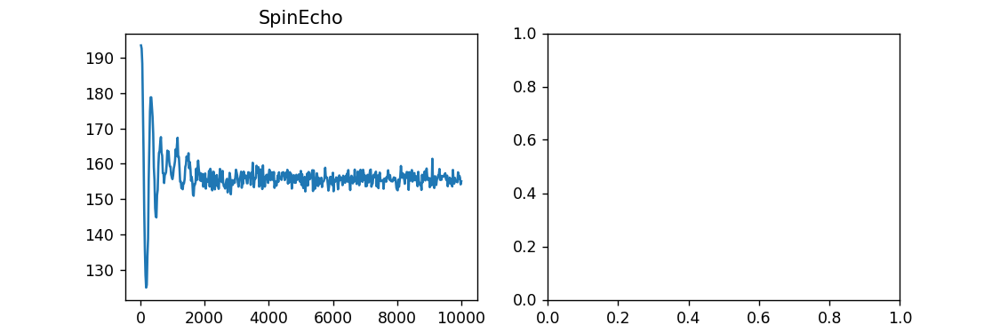

<IPython.core.display.Javascript object>


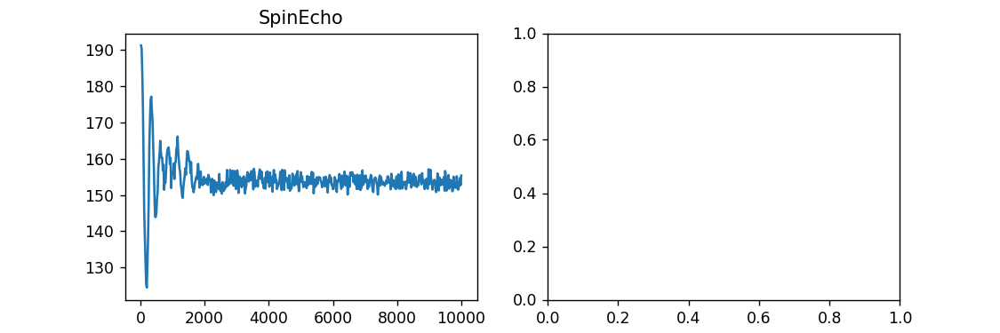

In [248]:
for i,v in enumerate(np.linspace(0,0.2,41)):
    value,num,tags = write(height=3,title='SpinEcho',which=(40-i))
    x,y = value[0]
    np.savetxt(f'D:\\QuLabData\\2019\\1220\\SpinEcho\\SpinEcho_{v}.txt', np.c_[x,y])

## 拟合T1

In [186]:
def fit(x, A, B, T1):
    return A * np.exp(-x/T1) + B

def guessParams(x,y):
    eps = 0.00001
    y = y-y.min()
    mask = y > eps*y.max()
    a = np.polyfit(x[mask], np.log(y[mask]), 1)
    return [y.max()-y.min(), y.min(), -1/a[0]]

def analyze(x,s):
    y = np.abs(s)
    p0 = guessParams(x,y)
    popt,pcov = curve_fit(fit, x, y, p0)
    return popt, pcov

In [187]:

for i in range(len(value)):
    try:
        xdata,ydata = value[i]
        popt, pcov = analyze(np.abs(xdata),abs(ydata))
        A, B, T1 = popt
        z =  A * np.exp(-xdata/T1) + B
        fig = plt.gcf() 
        axes = plt.getp(fig,'axes')
        #ax[i].plot(xdata,ydata)
        axes[i].plot(xdata,z)
        #ax.add_line(line[1])
        axes[i].set_title(r'$T1 = %g \mathrm{ns}$' %T1)
    except RuntimeError or TypeError:
        pass

In [208]:
data = np.load(r'D:\QuLabData\2019\1220\T1_0.1\old_crossover_q4_20191220025724.npz')
list(data.keys())
# plt.figure()
# plt.plot(data['row'], np.abs(data['col']))
# plt.show()
data['row'].shape, np.abs(data['col']).shape

((1,), (0,))

<IPython.core.display.Javascript object>


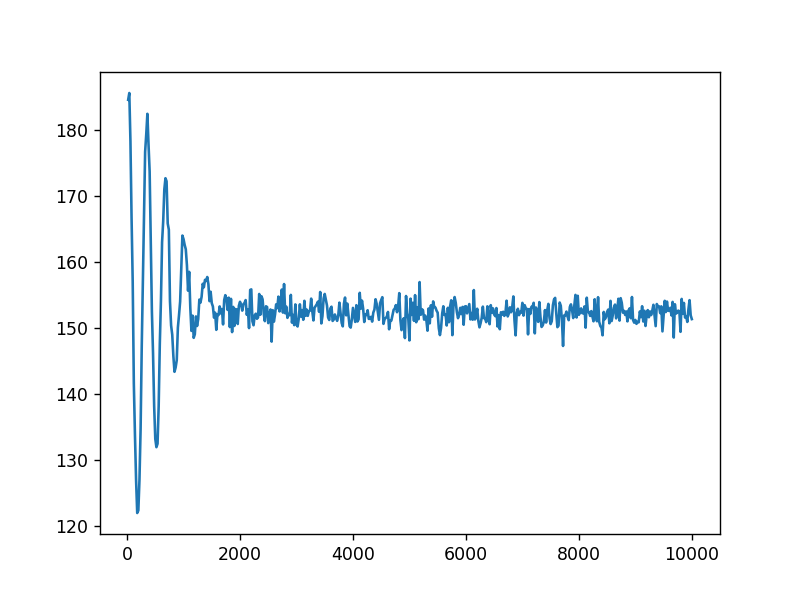

(array([[   20.],
        [   40.],
        [   60.],
        [   80.],
        [  100.],
        [  120.],
        [  140.],
        [  160.],
        [  180.],
        [  200.],
        [  220.],
        [  240.],
        [  260.],
        [  280.],
        [  300.],
        [  320.],
        [  340.],
        [  360.],
        [  380.],
        [  400.],
        [  420.],
        [  440.],
        [  460.],
        [  480.],
        [  500.],
        [  520.],
        [  540.],
        [  560.],
        [  580.],
        [  600.],
        [  620.],
        [  640.],
        [  660.],
        [  680.],
        [  700.],
        [  720.],
        [  740.],
        [  760.],
        [  780.],
        [  800.],
        [  820.],
        [  840.],
        [  860.],
        [  880.],
        [  900.],
        [  920.],
        [  940.],
        [  960.],
        [  980.],
        [ 1000.],
        [ 1020.],
        [ 1040.],
        [ 1060.],
        [ 1080.],
        [ 1100.],
        [ 

In [219]:
data = np.load(r'D:\QuLabData\2019\1220\SpinEcho_0.1\old_crossover_q2_20191220031227.npz')
plt.figure()
plt.plot(data['row'], np.abs(data['col']))
plt.show()
data['row'], np.abs(data['col'])

# 拟合Ramsy

<IPython.core.display.Javascript object>


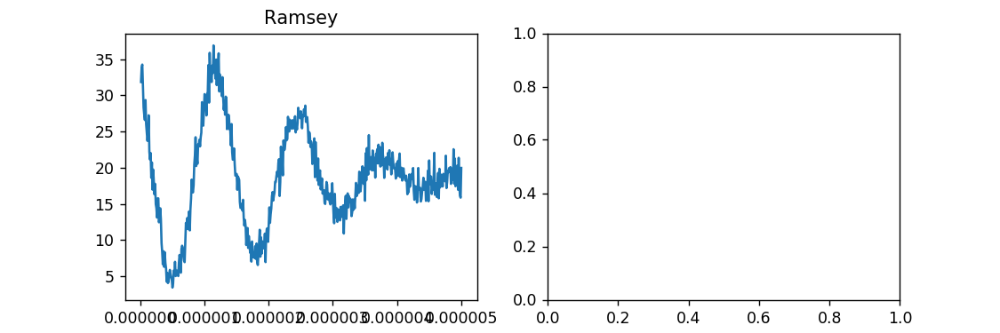

In [5]:
value,num,tags = write(height=3,title='Ramsey',which=7)

In [72]:
 fileName = r'D:\QuLabData\2019\1213\Ramsey\cali_dcblock.txt'
data = np.loadtxt(str(fileName))
    
t, y = data[:,0], data[:,1]

(30.709731050649683, 227.50968600779447, 25000, 7864.2647416906075, 0.002846153846153846, 0)


<IPython.core.display.Javascript object>


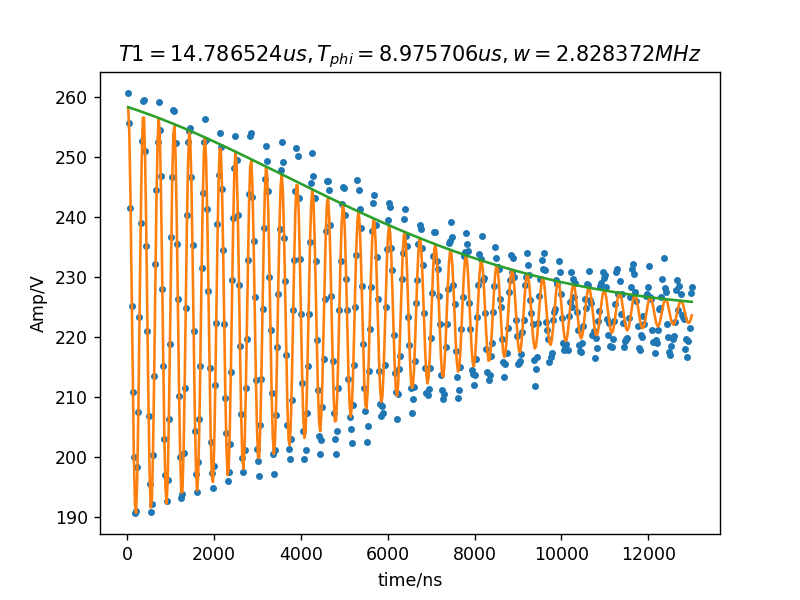

In [74]:
#t, y = value[0][0],np.abs(value[0][1])
op = imp.reload(qulab.optimize)
try: 
    fT2 = op.T2_Fit(funcname='gauss',envelopemethod='hilbert')
    A,B,T1,Tphi,w,phi,x,s = fT2.fitT2(t,y)
finally:
    pass

z = A*np.exp(-(t/Tphi)**2-t/T1)*np.cos(2*np.pi*w*t+phi) + B
plt.figure()
plt.plot(t,y,'.')
plt.plot(t,z)
plt.plot(t,A*np.exp(-(t/Tphi)**2-t/T1) + B)
plt.ylabel('Amp/V')
plt.xlabel('time/ns')
plt.title('$T1=%fus, T_{phi}=%fus, w=%fMHz$'%(np.abs(T1)/1e3,np.abs(Tphi)/1e3,w*1e3))
plt.show()

In [85]:
T = 1/(1/T2+1/2/T1)

In [12]:
A,B,T1,Tphi,w,phi

(27.80218324770545,
 154.21373723076567,
 21799.94506303129,
 45522.07756100876,
 0.003000384289817845,
 -0.3963623617685434)

<IPython.core.display.Javascript object>


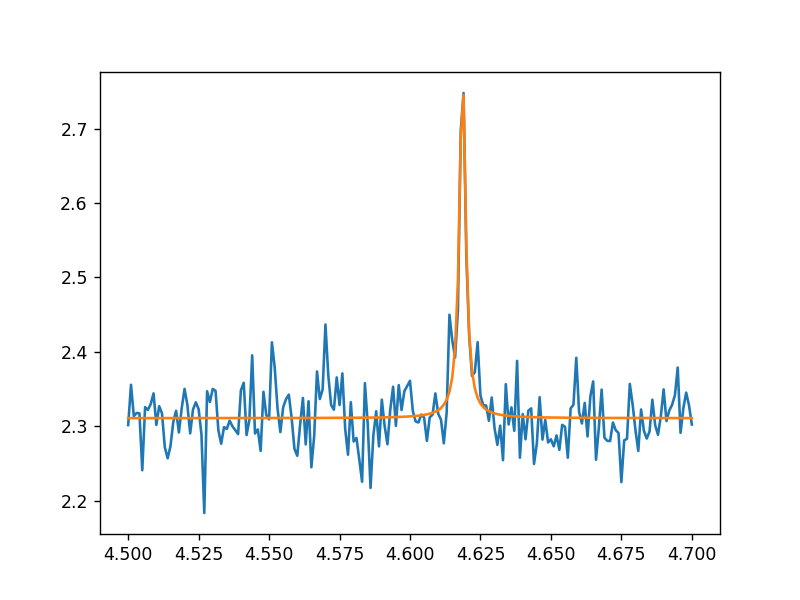

In [54]:
data = np.load(r'D:\skzhao\data\190628\ATS_singlespec\10bit_xi_q2_offset-13mv_D11_0mv20us_6.474GHz_-17dbm_-0.3.npz',allow_pickle=True)
row, col, s = data['row']/1e9, data['col'], data['s']
plt.plot(row,np.abs(col))
plt.show()

In [55]:
op = imp.reload(qulab.optimize)

lf = op.Lorentz_Fit()
a,b,c,d,bw = lf.fitLorentz(row,np.abs(col))
print(b,bw)
x = np.linspace(min(row),max(row),1001)
z = a/(1.0+c*(row-b)**2)+d
plt.plot(row,z)
plt.show()

4.61865028333253 1.823022084962488


In [49]:
plt.plot(x[5:-10],s[5:-10])
plt.show()

In [26]:
from scipy import fftpack
from scipy.signal import hilbert
# sh = fftpack.hilbert(s)
# ss = s + 1j*sh
# plt.plot(t,np.abs(ss))
# plt.show()

In [228]:
#from scipy.interpolate import spline
from scipy import interpolate
tnew = np.linspace(min(t),max(t),1001)
s_smooth = interpolate.spline(t,s,tnew)
plt.plot(t_new,s_smooth)
plt.show()

AttributeError: module 'scipy.interpolate' has no attribute 'spline'

In [229]:
import spline

ModuleNotFoundError: No module named 'spline'

<IPython.core.display.Javascript object>


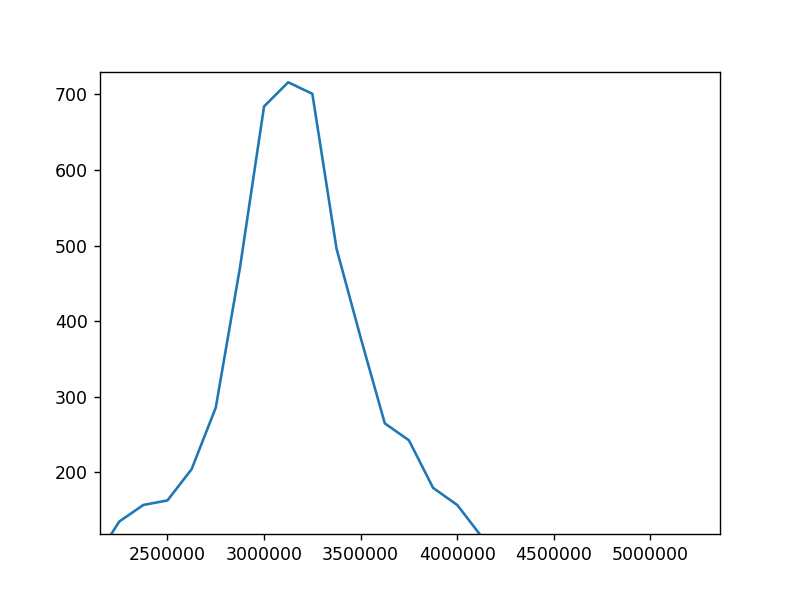

In [219]:
sample = (max(t)-min(t)) / (len(t) - 1)
sfft = np.fft.fft(s)
sfreq = np.fft.fftfreq(len(s)) / sample * 1e9
sfft = sfft[sfreq!=0]
sfreq = sfreq[sfreq!=0]
plt.figure()
plt.plot(sfreq,np.abs(sfft))
plt.show()

In [209]:
sfft

array([ 7.14784096e+04+0.00000000e+00j,  4.48677051e+01-6.73271369e+01j,
        4.66809778e+01-5.83897916e+01j,  3.15324756e+01-2.50248831e+01j,
        6.06580713e+01-4.62165485e+01j,  4.65741039e+01-8.48480869e+00j,
        2.75290201e+00+1.64568917e+01j,  5.04564975e+00-1.13289067e+00j,
        4.26830790e+01+1.36996395e+01j,  2.39930220e+01+2.53426232e+01j,
        2.57071599e+01+1.08100968e+00j,  6.82352248e+01+5.04436238e+01j,
        1.89661135e+01+3.71164540e+01j,  3.85105027e+01+4.88408815e+01j,
        2.82649345e+01+4.11517769e+01j,  2.54814763e+01+6.39598989e+01j,
        5.19996901e+00+4.57976770e+01j,  2.97767583e+01+7.88816093e+01j,
        7.88375253e+01+1.09186703e+02j,  6.29493292e+01+1.43527927e+02j,
        8.79019257e+01+1.36994738e+02j,  9.47682973e+01+1.80695269e+02j,
        1.06533025e+02+2.64933521e+02j,  3.06293562e+02+3.57040913e+02j,
        6.29766939e+02+2.67529520e+02j,  7.08568281e+02-1.03870039e+02j,
        5.29839992e+02-4.58837153e+02j,  1.93682602

In [205]:
from scipy import signal

b, a = signal.butter(3, 0.05)
sf = signal.filtfilt(b,a,s)
plt.plot(t,sf)
plt.show()

In [ ]:
def fit_R(x, A, B, T1, Tphi, wr):
    return A * np.cos(wr*x)*np.exp(-x/2/T1-(x/Tphi)**2) + B

def guessParams_R(x,y,wr=5e6):
    x, y = np.array(x), np.array(y)
    mask = y > y.mean()
    index, cell, loca,even,odd = [],[],[],[],[]
    for i in range(len(mask)-1):
        if mask[i]^mask[i+1]:
            index.append(i+1)
    if len(index)%2:
        del index[-1]
    while True:
        l0 = index.pop(0)
        odd.append(l0)
        l1 = index.pop(0)
        even.append(l1)
        cell.append(y[l0:l1].max())
        loca.append(x[l0:l1][y[l0:l1].argmax()])
        if not len(index):
            break
    wr = np.pi / (np.array(even)-np.array(odd)).mean()
    z1 = np.polyfit(np.array(loca),np.log(np.array(cell)),2)
    Tphi, T1 = -np.sqrt(1/z1[0]), -z1[1]/2
    return [y.max()-y.min(), y.mean(), T1, Tphi, wr]

def analyze_R(x,s):
    y = np.abs(s)
    p0 = guessParams_R(x,y)
    popt,pcov = curve_fit(fit_R, x, y, p0)
    return popt, pcov

In [39]:
 for i in range(len(value)):     
    try:         
        xdata,ydata = value[i]         
        popt, pcov = analyze_R(xdata,abs(ydata))         
        A, B, T1, Tphi, wr = popt         
        z =  A * np.cos(wr*x)*np.exp(-x/2/T1-(x/Tphi)**2) + B         
        fig = plt.gcf()          
        axes = plt.getp(fig,'axes')         
        #ax[i].plot(xdata,ydata)         
        axes[i].plot(xdata,z)         
        #ax.add_line(line[1]) 
        print(T1)
        axes[i].set_title(r'$Tphi = %g \mathrm{ns},wr=%g \mathrm{ns}$' %(Tphi,wr))     

    except RuntimeError or TypeError:         
        pass

C:\WPy64-3740\python-3.7.4.amd64\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in sqrt


In [ ]:
plt.figure()
t = np.linspace(0,10,1001)
y = np.cos(10*t)
mask = y>y.mean()
plt.plot(t,y)
plt.show()

In [ ]:
index = []
for i in range(len(mask)-1):
    if mask[i]^mask[i+1]:
        index.append(i+1)
if len(index)%2:
    del index[-1]
cell = []
loca = []
while True:
    
    l0 = index.pop(0)
    l1 = index.pop(0)
    cell.append(y[l0:l1])
    loca.append(t[l0:l1])
    if not len(index):
        break

In [ ]:
plt.figure()
for i in range(len(cell)):
    plt.plot(loca[i],cell[i])
plt.show()

In [ ]:
plt.figure()
for i in range(len(cell)):
    plt.plot(loca[i],cell[i])
plt.show()

<IPython.core.display.Javascript object>


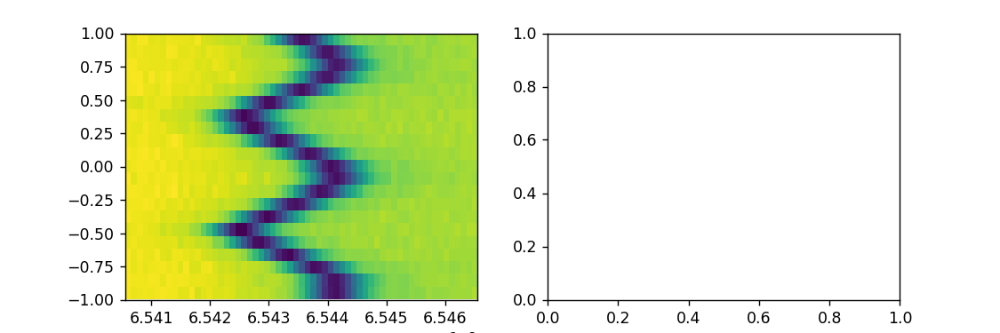

In [146]:
value,num,tags = write(height=3)

<IPython.core.display.Javascript object>


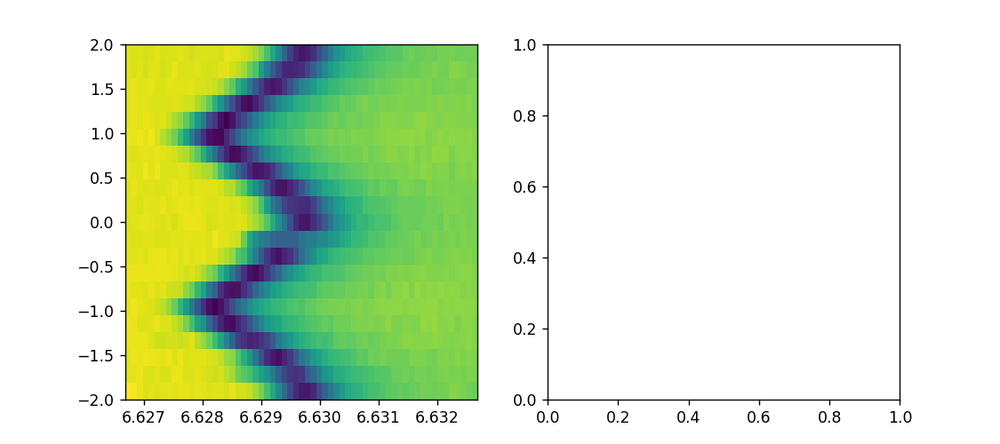

In [98]:
value,num,tags = write(height=4,title='S21vsFlux',which=0)

# 拟合二维谱

<IPython.core.display.Javascript object>


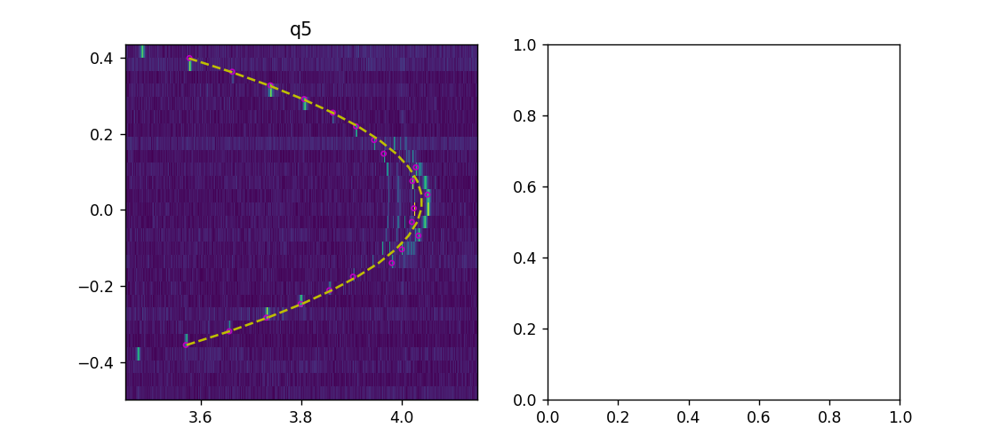

In [349]:
value,num,tags = write(height=4,title='spec2d',which=0)

In [350]:
v, f, s = value[0][0], value[0][1]/1e9, value[0][2]
f,v,A, C, W, phi = op.Spec2d_Fit(peak=15).fitSpec2d(v,f,s)
z = A*np.cos(2*np.pi*W*v+phi)+C
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].scatter(f[1:-1],v[1:-1],marker='.',c='',edgecolors='m')
ax[0].plot(z[1:-1],v[1:-1],'y--')
plt.show()

In [304]:
v, f, s = value[0][0], value[0][1]/1e9, value[0][2]
fig, axes = plt.subplots(ncols=2,nrows=(len(v)//2+len(v)%2),figsize=(9,2*(len(v)//2+len(v)%2)))
v = v[np.abs(s).max(axis=1)>15]
s = s[np.abs(s).max(axis=1)>15]
f_c = f[np.abs(s).argmax(axis=1)]
for j, i in enumerate(s):
    axes[j//2][j%2].plot(f,np.abs(i))
    try:
        a,b,c,d,band,res = op.Lorentz_Fit().fitLorentz(f,np.abs(i))
        z = a/(1.0+c*(f-b)**2)+d
        axes[j//2][j%2].plot(f,z)
    except ValueError:
        pass
    axes[j//2][j%2].set_title('%d'%j)
    #axes[j//2][1].plot(f_test,np.angle(i/s21_base))
plt.show()

# CrossTalk_Cali

In [48]:
n = num
matrix_cross = np.zeros((n,n)) #收集crosstalk矩阵元
matrix_phi = np.zeros((n,n))

In [100]:
def fit_cos(tag):
    mat = []
    At = 0
    for i in range(len(value)):
        volt1, freq1, s1 = value[i]
        freq1 = freq1
        volt, freq, s = volt1, freq1, s1
 
        if i == int(tag[2:]) - 1:
            index_0, index_1 = list(volt).index(-2), list(volt).index(1)
            volt, s = volt[index_0:index_1+1], s[index_0:index_1+1]

        x, y = manipulation(volt,freq,s)
        A, C, W, phi = op.Cos_Fit().fitCos(x,y)
        T = 1 / W
        fig = plt.gcf() 
        axes = plt.getp(fig,'axes')
        axes[i].plot(y,x,'ro')
        x1 = np.linspace(min(volt1),max(volt1),1001)
        axes[i].plot(A*np.cos(2*np.pi/T*x1+phi)+C,x1,'b-')
        #if i != int(tag[2:]) - 1:
        t = symbols("t")
        z = A*sy.cos(2*np.pi/T*t+phi)+C
        z_diff = diff(z,t)
        if z_diff.evalf(subs = {t:0}) < 0:
            T *= -1
            if phi<0:
                phi *= -1
        phi = phi % (2*np.pi)
        mat.append((1/T,phi))
        axes[i].set_title(r'$ %d,T = %g,phi=%g $' %(i,T,phi))
        print(T)
    return mat
        

In [106]:
n_target = 1
mat = fit_cos(tag='q_%d'%n_target)
matrix_cross[:,n_target-1] = np.array(mat)[:,0]
matrix_phi[:,n_target-1] = np.array(mat)[:,1]

2.057930338557709
15.039206976183022
-416.6094642415323
-1.78179011317478
165.5388098240392
161.73755395510534
5.910558067151911
373.04891097337867
373.04891097337867
-0.5460656310637384


In [14]:
tags

['xue_crossover_q1']

In [ ]:
matrix_cross[3,1] = -0.0398952

In [ ]:
matrix_phi

In [ ]:
matrix_phi

In [ ]:
matrix_phi=matrix_phi%(2*np.pi)

In [ ]:
matrix_phi[1,:]=matrix_phi[1,:]-np.pi

In [ ]:
matrix_phi[:,7]=5.8

In [ ]:
#matrix_phi[2,2] = 2.2
matrix_phi = np.array([[1.82320432, 1.92725558, 1.85513035],
       [2.15340554, 2.09757747, 2.02237438],
       [2.35750022, 2.157877  , 2.2       ]]) - np.pi
matrix_phi

In [ ]:
matrix_cross = np.array([[-1.13214383,  0.0327491 ,  0.02587035],
       [-0.07700234, -0.54725516,  0.03469247],
       [-0.08039911, -0.04041481,  0.56263594]])

In [ ]:
matrix_cross

In [ ]:
matrix_cross

In [ ]:
matrix = np.zeros((3,3))
m_phi = matrix

matrix[:,0] = (matrix_cross[0,0],matrix_cross[2,0],matrix_cross[5,0])
matrix[:,1] = (matrix_cross[0,2],matrix_cross[2,2],matrix_cross[5,2])
matrix[:,2] = (matrix_cross[0,5],matrix_cross[2,5],matrix_cross[5,5])

In [ ]:
matrix = matrix_cross

# crosstalk矩阵元

In [ ]:
I0 = -np.mat(matrix).I*np.mat(matrix_phi).mean(axis=1)/2/const.pi
mat_crosstalk = [matrix[i]/matrix[i][i] for i in range(len(matrix))]
#最终加在qubits上的电流为I = mat_crosstalk.I*[0,0,0,0,1]+I0

In [ ]:
mat_crosstalk

In [ ]:
I0

In [ ]:
save('crosstalk_cali','xue_crosstalk_q3_10',mat=mat_crosstalk,I0=I0)

In [ ]:
mat_crosstalk

# bloch sphere

<IPython.core.display.Javascript object>


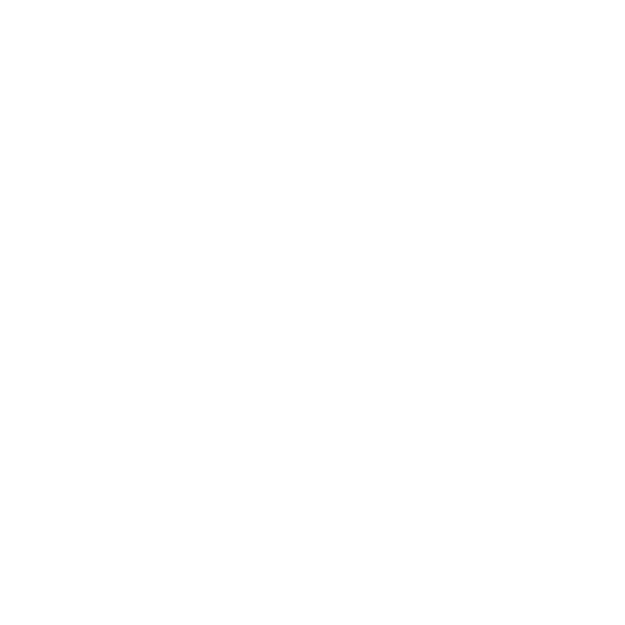

In [7]:
# data, ID, comment, tags, name = read()
# result = data
#fig = plt.figure(figsize=(4,4))
#ax = Axes3D(fig, azim=-40,elev=30)
from qutip import *

b = Bloch(background=True)
b.frame_alpha = 0.2
## normalize colors to times in tlist ##  
nrm = mpl.colors.Normalize(-2,10)  
#colors = cm.cool(nrm(tlist))   
## add data points from expectation values ##  
b.add_points([0,1,1])
## customize sphere properties ##  
b.add_vectors([[1.2,0,0],[0,1.2,0],[0,0,1.1]]) 
b.point_color = ['red']  
b.point_marker = ['o']  
b.point_size = [5]   
b.zlpos = [1.1,-1.2]  
#b.make_sphere()
b.show()

<IPython.core.display.Javascript object>


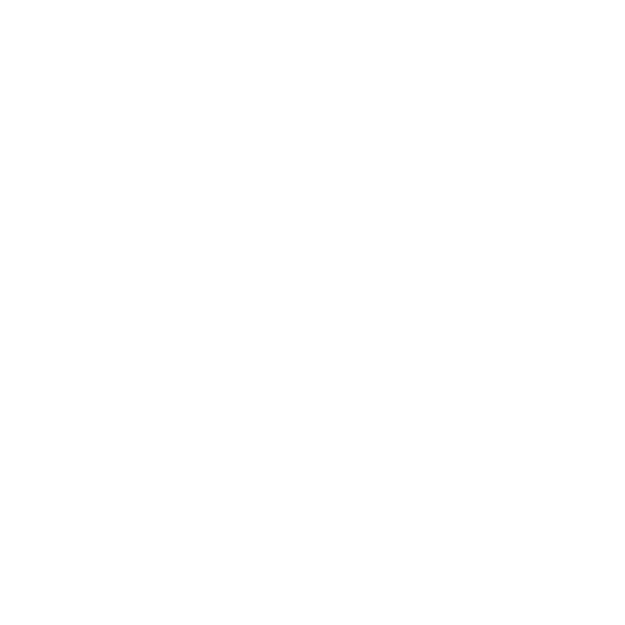

In [9]:
import qutip as qt

b = qt.Bloch()
b.add_points([1,1,1])
#b,add_vectors([1,0,0])
b.show()

In [28]:
# data, ID, comment, tags, name = read()
# result = data
#fig = plt.figure(figsize=(4,4))
#ax = Axes3D(fig, azim=-40,elev=30)
b = Bloch3d()
b.frame_alpha = 0.2
## normalize colors to times in tlist ##  
nrm = mpl.colors.Normalize(-2,10)  
#colors = cm.cool(nrm(tlist))   
## add data points from expectation values ## 
pnts = [result[0][:,0],result[1][:,0],result[2][:,0]]
b.add_points(pnts,'m')
## customize sphere properties ##  
b.add_vectors([[1.2,0,0],[0,1.2,0],[0,0,1.1]]) 
b.point_color = ['red']  
b.point_marker = ['o']  
b.point_size = [5]   
b.zlpos = [1.1,-1.2]  
#b.make_sphere()
b.show()

Exception: This function requires the mayavi module.

<IPython.core.display.Javascript object>


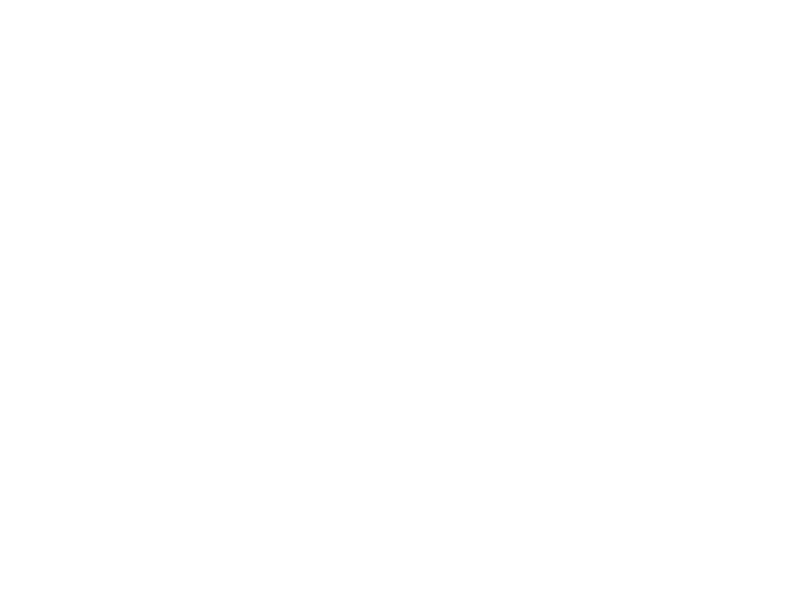

In [267]:
from pylab import * 
from qutip import *
import matplotlib.animation as animation 
from mpl_toolkits.mplot3d import Axes3D
import os


fig = figure() 
ax = Axes3D(fig,azim=-40,elev=20) 
b = Bloch(axes=ax)
# ffmpegpath = os.path.abspath("./ffmpeg/bin/ffmpeg.exe")
# matplotlib.rcParams["animation.ffmpeg_path"] = r'C:\Anoconda\ffmpeg-20191101-53c21c2-win64-static\bin\ffmpeg.exe'
# writer = animation.FFMpegWriter(fps=20,codec=)

def animate(i): 
    
    b.clear() 
    b.add_vectors([[1.2,0,0],[0,1.2,0],[0,0,1.1]]) 
    b.add_points([i[0],i[1],i[2]],'m')
    b.point_marker = ['o']
    b.point_size = [5]   
    b.zlpos = [1.1,-1.2]
    b.make_sphere() 
    return ax

def init():
    
    b.vector_color = ['r'] 
    return ax

def get_data():
    i = 0
    result, ID, comment, tags, name = read()
    for i in range(len(result[0][:,0])):
        
        x = [result[0][:,0][:i],result[1][:,0][:i],result[2][:,0][:i]]
        yield x

ani = animation.FuncAnimation(fig, animate, get_data(), init_func=init, blit=True,interval=100) 
#ani.save('D:\QuLabData\ani\bloch_sphere.gif',writer='imagemagick')


# 系统噪声

In [32]:
phi = np.array([-0.2205,-0.1957,-0.0827,0.0827,0.1653]) 
f01 = np.array([3.774,3.849,4.025,3.754,3.365])*1e9
# phi = np.array([-0.2205,-0.1654,-0.0882,0.1102,0.1433])
# f01 = np.array([3.78,3.924,4.024,3.653,3.499])*1e9

In [10]:
phi = np.array([-0.0701,-0.0993,-0.1169,-0.1461,-0.1636]) 
f01 = np.array([3.724,3.632,3.557,3.436,3.354])*1e9

In [33]:
p1 = np.polyfit(phi,f01,2)

In [38]:
df = np.array([4.024,3.924,3.78,3.653,3.499])-4.039
Tphi = np.array([6.4,5.6,3.1,2.1,1.2])

In [44]:
df_awg = np.array([4.025,3.849,3.514])-4.039
Tphi_awg = np.array([2.8,1.4,0.308])

<IPython.core.display.Javascript object>


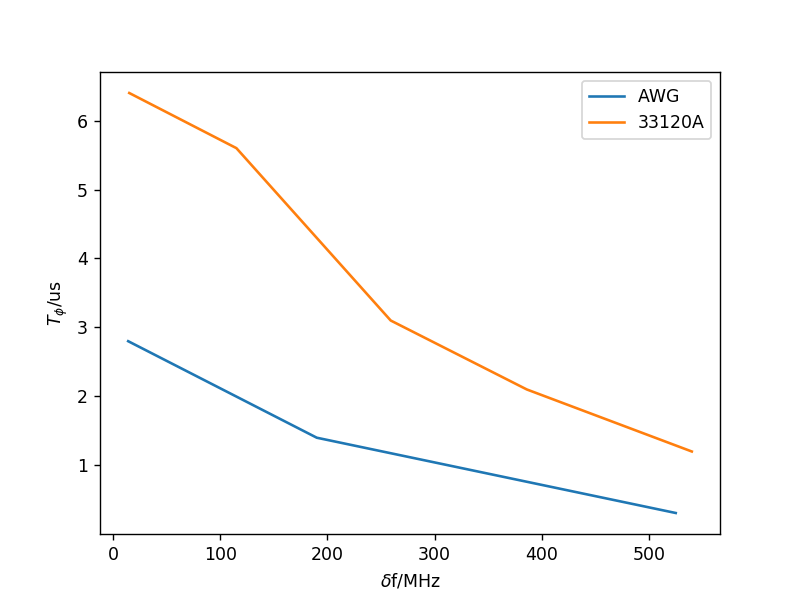

In [49]:
x = np.linspace(-0.5,0.5,100)
y = p1[0]*x**2 + p1[1]*x + p1[2]
y_diff  = 2*p1[0]*x+p1[1]
plt.figure()
#plt.plot(phi,f01,'.')
plt.plot(-df_awg*1e3,Tphi_awg,label='AWG')
plt.plot(-df*1e3,Tphi,label='33120A')
# plt.xlabel('$\phi/\phi_{0}$')
# plt.ylabel('$df/d\phi$')
plt.xlabel('$\delta$f/MHz')
plt.ylabel('$T_{\phi}$/us')
plt.legend()
#plt.title('AWG_nocrosstalkcali')
#plt.ylabel('$f$/GHz')
plt.show()

In [48]:
help(plt.legend)

Help on function legend in module matplotlib.pyplot:

legend(*args, **kwargs)
    Place a legend on the axes.
    
    Call signatures::
    
        legend()
        legend(labels)
        legend(handles, labels)
    
    The call signatures correspond to three different ways how to use
    this method.
    
    **1. Automatic detection of elements to be shown in the legend**
    
    The elements to be added to the legend are automatically determined,
    when you do not pass in any extra arguments.
    
    In this case, the labels are taken from the artist. You can specify
    them either at artist creation or by calling the
    :meth:`~.Artist.set_label` method on the artist::
    
        line, = ax.plot([1, 2, 3], label='Inline label')
        ax.legend()
    
    or::
    
        line, = ax.plot([1, 2, 3])
        line.set_label('Label via method')
        ax.legend()
    
    Specific lines can be excluded from the automatic legend element
    selection by defining a label st

In [12]:
import sympy as sy

In [15]:
t = symbols("t")
z = p1[0]*t**2 + p1[1]*t + p1[2]
z_diff = diff(z,t)

In [31]:
f01_diff = np.array([float(z_diff.evalf(subs = {t:i})) for i in phi])
f01_diff

array([3.05166354e+09, 3.62886557e+09, 3.97676817e+09, 4.55397021e+09,
       4.89989609e+09])

In [22]:
Ts = np.array([1.9,2.2,11.2,2.0,1.3])/1e6
Tphi = np.array([3.1,5.6,6.4,2.1,1.2])/1e6
#Ts = np.array([21.4,16.5,22.9,7.0,7.0])/1e6

In [32]:
Ts = np.array([1.164,0.868,0.809,0.760,0.716])/1e6
Tphi = np.array([0.434,0.370,0.322,0.262,0.243])/1e6

In [33]:
b = 1 / Tphi
a1 = np.polyfit(np.abs(f01_diff),b,1)
A = a1 / np.sqrt(2*np.pi) / np.log(2) / 2/np.pi
print(f'{A[0] * 1e6:.3f}')

93.679


In [34]:
b = 1 / Ts
a1 = np.polyfit(np.abs(f01_diff),b,1)
A = a1 / np.sqrt(2*np.pi) / np.log(2) / 2/np.pi
print(f'{A[0] * 1e6:.3f}')

24.785


In [25]:
12.399/2.112*11.834

69.47432102272727

In [22]:
A = a1 / np.sqrt(2*np.pi) / np.log(2) / 2/np.pi

In [23]:
print(f'{A[0] * 1e6:.3f}')

24.785


<IPython.core.display.Javascript object>


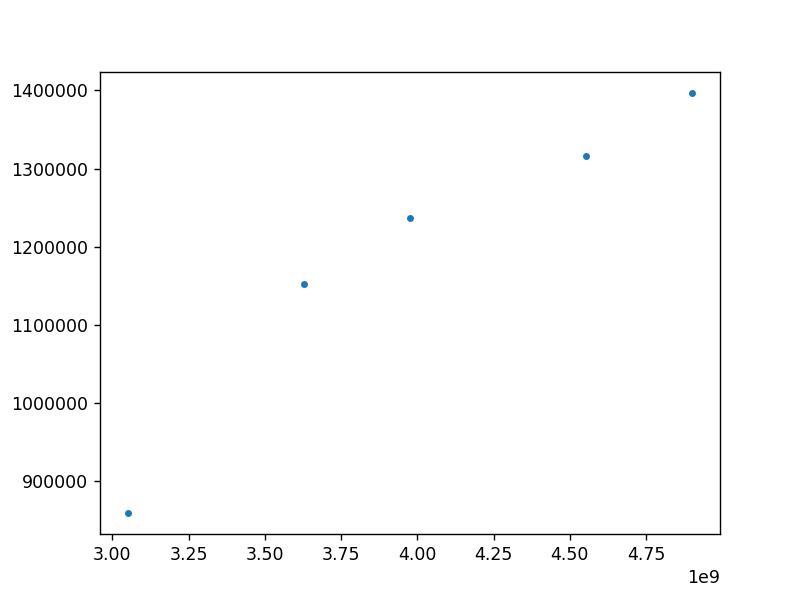

In [25]:
plt.figure()
plt.plot(np.abs(f01_diff),b, '.')
plt.show()

<IPython.core.display.Javascript object>


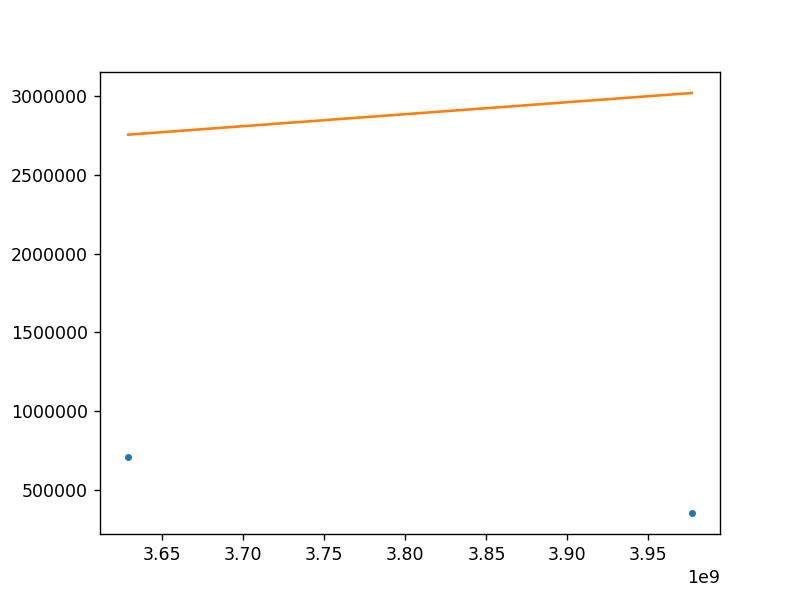

In [26]:
plt.figure()
plt.plot(np.abs(f01_diff[1:3]), np.array([1/1.4,1/2.8])*1e6, '.')

plt.plot(np.abs(f01_diff[1:3]), np.abs(f01_diff[1:3])*69.47432102272727*1e-6*np.sqrt(2*np.pi) * np.log(2) * 2*np.pi )
plt.show()

In [607]:
data, ID, comment, tags, name = read(title='z_cross',which=0)

<IPython.core.display.Javascript object>


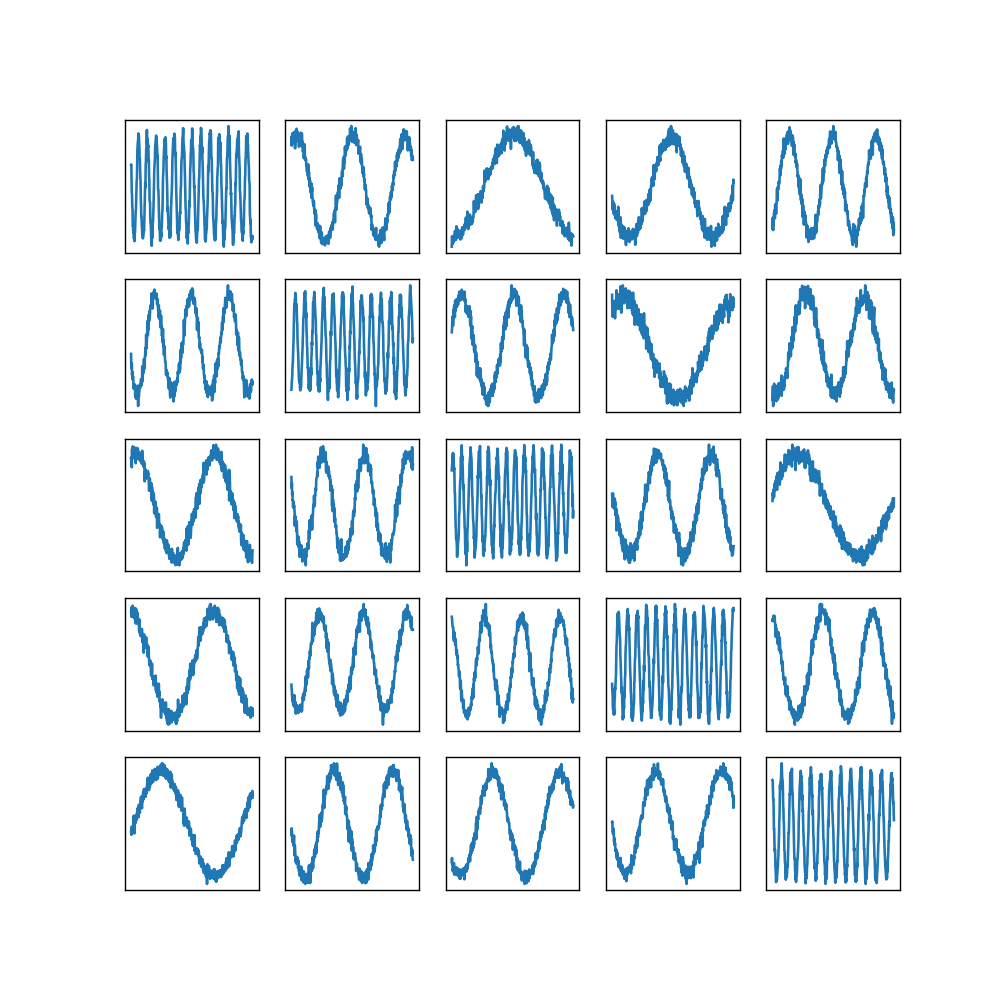

In [618]:
plt.figure(figsize=(8,8))

lst = [
    29,28,27,26,25,
    24,23,22,21,20,
    14,13,12,11,10,
    9,8,7,6,5,
    4,3,2,1,0
]

for i in range(5):
    for j in range(5):
        data, ID, comment, tags, name = read(title='z_cross',which=lst[5*i+j])
        plt.subplot(5,5,5*i+j+1)
        plt.plot(data[0], np.abs(data[1]))
        plt.xticks([])
        plt.yticks([])
plt.show()

In [1]:
import sys as _sys

In [2]:
globals()

{'__name__': '__main__',
 '__doc__': 'Automatically created module for IPython interactive environment',
 '__package__': None,
 '__loader__': None,
 '__spec__': None,
 '__builtin__': <module 'builtins' (built-in)>,
 '__builtins__': <module 'builtins' (built-in)>,
 '_ih': ['', 'import sys as _sys', 'globals()'],
 '_oh': {},
 '_dh': ['D:\\notebooks'],
 'In': ['', 'import sys as _sys', 'globals()'],
 'Out': {},
 'get_ipython': <bound method InteractiveShell.get_ipython of <ipykernel.zmqshell.ZMQInteractiveShell object at 0x000002A751CDCB08>>,
 'exit': <IPython.core.autocall.ZMQExitAutocall at 0x2a751dca608>,
 'quit': <IPython.core.autocall.ZMQExitAutocall at 0x2a751dca608>,
 '_': '',
 '__': '',
 '___': '',
 'json': <module 'json' from 'C:\\WPy64-3740\\python-3.7.4.amd64\\lib\\json\\__init__.py'>,
 'yapf_reformat': <function __main__.yapf_reformat(cell_text)>,
 'isort': <module 'isort' from 'C:\\WPy64-3740\\python-3.7.4.amd64\\lib\\site-packages\\isort\\__init__.py'>,
 '_isort_refactor_cel

In [4]:
_sys.__name__

'sys'

In [5]:
import qulab

In [8]:
isinstance(qulab, type(_sys))

True

In [10]:
shell = get_ipython()

In [11]:
shell.user_ns['In']

['',
 'import sys as _sys',
 'globals()',
 '_sys',
 '_sys.__name__',
 'import qulab',
 'qulab',
 'qulab.__name__',
 'isinstance(qulab, type(_sys))',
 'get_ipython()',
 'shell = get_ipython()',
 "shell.user_ns['In']"]

In [12]:
import qulab.math

In [16]:
for k, v in globals().items():
    if k[0] == '_' or k in ['In', 'Out']:
        pass
    else:
        print(k, ':', v)

get_ipython : <bound method InteractiveShell.get_ipython of <ipykernel.zmqshell.ZMQInteractiveShell object at 0x000002A751CDCB08>>
exit : <IPython.core.autocall.ZMQExitAutocall object at 0x000002A751DCA608>
quit : <IPython.core.autocall.ZMQExitAutocall object at 0x000002A751DCA608>
json : <module 'json' from 'C:\\WPy64-3740\\python-3.7.4.amd64\\lib\\json\\__init__.py'>
yapf_reformat : <function yapf_reformat at 0x000002A752EA54C8>
isort : <module 'isort' from 'C:\\WPy64-3740\\python-3.7.4.amd64\\lib\\site-packages\\isort\\__init__.py'>
qulab : <module 'qulab' from 'd:\\qulab\\qulab\\__init__.py'>
shell : <ipykernel.zmqshell.ZMQInteractiveShell object at 0x000002A751CDCB08>
k : _i14
v : _i14
